<a href="https://colab.research.google.com/github/Shun0212/CodeBERTPretrained/blob/main/CodeMorAttention.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import torch
import numpy as np
from transformers import AutoModelForMaskedLM, AutoTokenizer
from sklearn.metrics.pairwise import cosine_similarity

model_name = "Shuu12121/CodeMorph-BERT"
tokenizer = AutoTokenizer.from_pretrained(model_name)
model = AutoModelForMaskedLM.from_pretrained(model_name)

!pip install datasets

# Googleドライブのマウント
from google.colab import drive
drive.mount('/content/drive')
import os
import sys
import torch
import random
from datasets import load_dataset, Dataset
from tokenizers import BertWordPieceTokenizer
from transformers import (
    BertConfig,
    BertForMaskedLM,
    BertTokenizerFast,
    DataCollatorForLanguageModeling,
    Trainer,
    TrainingArguments,
)

/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


tokenizer_config.json:   0%|          | 0.00/1.40k [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/224k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/728k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/695 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/642 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/254M [00:00<?, ?B/s]

BertForMaskedLM has generative capabilities, as `prepare_inputs_for_generation` is explicitly overwritten. However, it doesn't directly inherit from `GenerationMixin`. From 👉v4.50👈 onwards, `PreTrainedModel` will NOT inherit from `GenerationMixin`, and this model will lose the ability to call `generate` and other related functions.
  - If you're using `trust_remote_code=True`, you can get rid of this warning by loading the model with an auto class. See https://huggingface.co/docs/transformers/en/model_doc/auto#auto-classes
  - If you are the owner of the model architecture code, please modify your model class such that it inherits from `GenerationMixin` (after `PreTrainedModel`, otherwise you'll get an exception).
  - If you are not the owner of the model architecture class, please contact the model code owner to update it.


generation_config.json:   0%|          | 0.00/90.0 [00:00<?, ?B/s]

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 480.6/480.6 kB 16.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 116.3/116.3 kB 12.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 179.3/179.3 kB 8.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 143.5/143.5 kB 13.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 194.8/194.8 kB 20.6 MB/s eta 0:00:00
  Attempting uninstall: fsspec
    Found existing installation: fsspec 2024.10.0
    Uninstalling fsspec-2024.10.0:
      Successfully uninstalled fsspec-2024.10.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
gcsfs 2024.10.0 requires fsspec==2024.10.0, but you have fsspec 2024.9.0 which is incompatible.
torch 2.5.1+cu124 requires nvidia-cublas-cu12==12.4.5.8; platform_system == "Linux" and platform_machine == "x86_64", but you have nvidia-cublas-cu12 12.5.3.2 wh


google/code_x_glue_ct_code_to_text データセット (Test) をロードします...
使用デバイス: cuda

Shuu12121/CodeMorph-BERT を google/code_x_glue_ct_code_to_text で評価します (候補プールサイズ: 100)...
データセット全体のコード埋め込みを計算中...
コード埋め込み計算完了.
候補コードプールを作成し、類似度計算中...
類似度計算完了.
Shuu12121/CodeMorph-BERT の評価指標 (google/):
  mrr: 0.5051
  recall@k@1: 0.3600
  recall@k@5: 0.6700
  recall@k@10: 0.7500
  recall@k@50: 0.9900
  recall@k@100: 1.0000
  precision@k@1: 0.3600
  precision@k@5: 0.4825
  precision@k@10: 0.4926
  precision@k@50: 0.5050
  precision@k@100: 0.5051
  ndcg@k@1: 0.3600
  ndcg@k@5: 0.5295
  ndcg@k@10: 0.5548
  ndcg@k@50: 0.6092
  ndcg@k@100: 0.6108
  map: 0.5051
  f1@k@1: 0.3600
  f1@k@5: 0.5320
  f1@k@10: 0.5499
  f1@k@50: 0.5732
  f1@k@100: 0.5735
  r_precision: 0.3600
  success_rate@k@1: 0.3600
  success_rate@k@5: 0.6700
  success_rate@k@10: 0.7500
  success_rate@k@50: 0.9900
  success_rate@k@100: 1.0000
  query_coverage@k@1: 0.3600
  query_coverage@k@5: 0.6700
  query_coverage@k@10: 0.7500
  query_coverage@k@50: 0.990

Some weights of the model checkpoint at microsoft/codebert-base-mlm were not used when initializing RobertaForMaskedLM: ['roberta.pooler.dense.bias', 'roberta.pooler.dense.weight']
- This IS expected if you are initializing RobertaForMaskedLM from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing RobertaForMaskedLM from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


データセット全体のコード埋め込みを計算中...
コード埋め込み計算完了.
候補コードプールを作成し、類似度計算中...


Asking to truncate to max_length but no maximum length is provided and the model has no predefined maximum length. Default to no truncation.


類似度計算完了.
microsoft/codebert-base-mlm の評価指標 (google/):
  mrr: 0.3789
  recall@k@1: 0.2900
  recall@k@5: 0.4500
  recall@k@10: 0.5400
  recall@k@50: 0.9400
  recall@k@100: 1.0000
  precision@k@1: 0.2900
  precision@k@5: 0.3472
  precision@k@10: 0.3582
  precision@k@50: 0.3780
  precision@k@100: 0.3789
  ndcg@k@1: 0.2900
  ndcg@k@5: 0.3726
  ndcg@k@10: 0.4006
  ndcg@k@50: 0.4905
  ndcg@k@100: 0.5005
  map: 0.3789
  f1@k@1: 0.2900
  f1@k@5: 0.3720
  f1@k@10: 0.3915
  f1@k@50: 0.4290
  f1@k@100: 0.4309
  r_precision: 0.2900
  success_rate@k@1: 0.2900
  success_rate@k@5: 0.4500
  success_rate@k@10: 0.5400
  success_rate@k@50: 0.9400
  success_rate@k@100: 1.0000
  query_coverage@k@1: 0.2900
  query_coverage@k@5: 0.4500
  query_coverage@k@10: 0.5400
  query_coverage@k@50: 0.9400
  query_coverage@k@100: 1.0000
可視化サンプル: 12
クエリ: Converts a string to a valid filename.
コード (コメント削除済み): def legitimize(text, os=detect_os()):
    

    # POSIX systems
    text = text.translate({
        0: None,
      

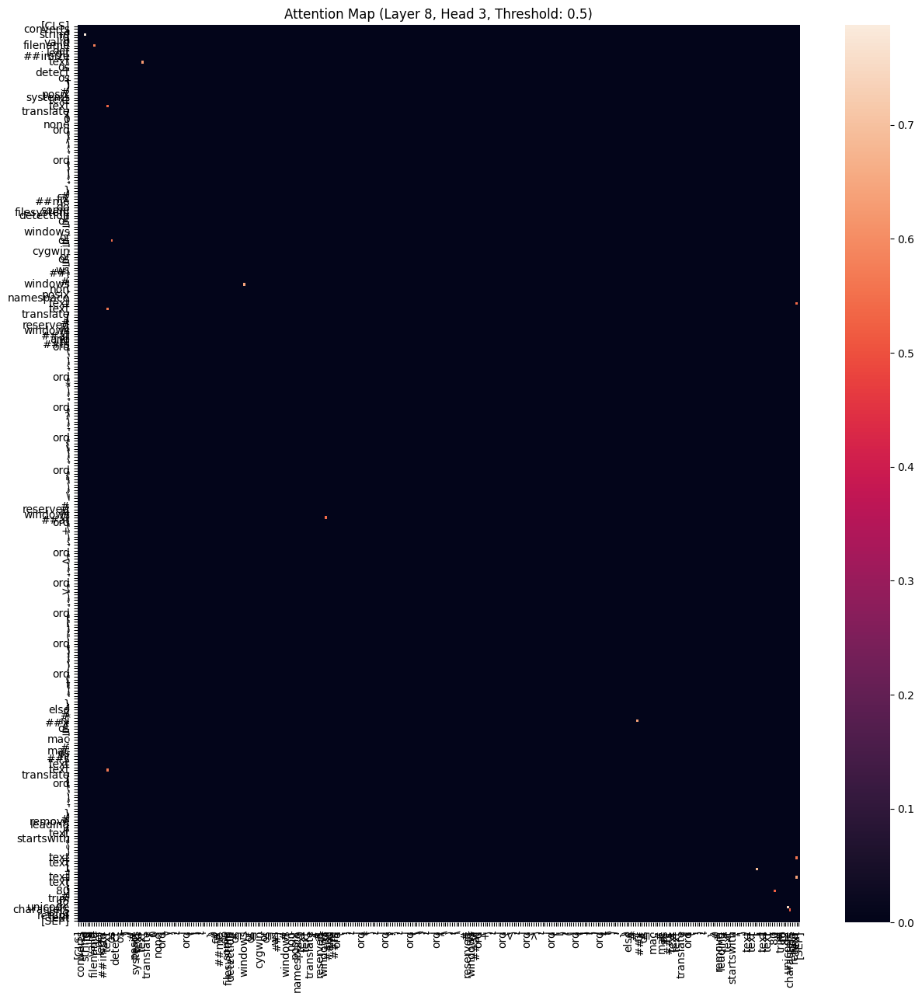


microsoft/codebert-base-mlm のAttention可視化:


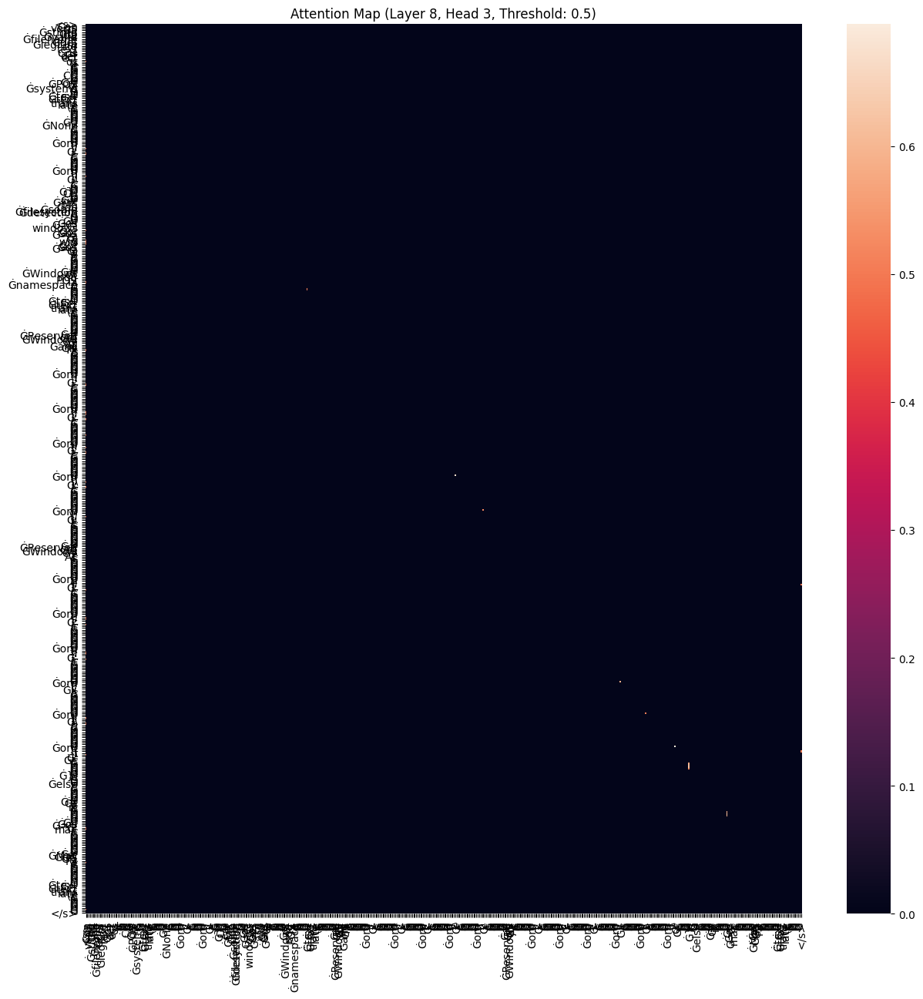

In [ ]:
import torch
import numpy as np
from transformers import AutoModelForMaskedLM, AutoTokenizer, RobertaForMaskedLM, BertForMaskedLM
from datasets import load_dataset
from sklearn.metrics.pairwise import cosine_similarity
import random
import re
import matplotlib.pyplot as plt
import seaborn as sns

def remove_multiline_strings(code):
    """
    Pythonコードからマルチライン文字列（ダブルクォート3つまたはシングルクォート3つで囲まれた部分）を削除する関数
    """
    pattern = r'("""(.*?)"""|\'\'\'(.*?)\'\'\')'
    return re.sub(pattern, '', code, flags=re.DOTALL)

def func_load_codes_from_xglue(num_samples: int = 10000):
    """
    google/code_x_glue_tc_nl_code_search_adv の Python コードデータ（code）を抽出し、
    マルチライン文字列（""" """ や ''' '''）を削除してリストに格納します。

    Args:
        num_samples (int): 抽出するサンプル数。0 以下（例: -1）を指定すると全サンプルを使用します。

    Returns:
        List[str]: 抽出したコードのリスト
    """
    dataset = load_dataset("google/code_x_glue_tc_nl_code_search_adv", split="train")
    code_samples = []
    for item in dataset:
        code = item.get("code", "")
        # マルチライン文字列を削除
        cleaned_code = remove_multiline_strings(code)
        # 空文字でなければ追加
        if cleaned_code and len(cleaned_code.strip()) > 0:
            code_samples.append(cleaned_code)
        # num_samples が正の値の場合のみ打ち切り
        if num_samples > 0 and len(code_samples) >= num_samples:
            break
    print(f"抽出したコードサンプル数: {len(code_samples)}")
    return code_samples


def func_tokenize_dataset(dataset, tokenizer, max_length: int = 512):

    def tokenize_function(example):
        texts = example["code"]
        # 各サンプルが None または空文字なら "" に置き換える
        texts = [text if text is not None and text.strip() != "" else "" for text in texts]
        # batched なのでリストをまとめて処理（返り値は dict になります）
        return tokenizer(texts, truncation=True, max_length=max_length)

    # func_code_string 以外のカラムは削除
    tokenized_dataset = dataset.map(
        tokenize_function,
        batched=True,
        remove_columns=[col for col in dataset.column_names if col != "code"]
    )
    return tokenized_dataset

def evaluate_code_search(model, tokenizer, dataset, device, max_examples=100, pool_size=100,
                         query_field="func_documentation_string", code_field="func_code_string"):
    """
    指定したデータセットに対して、コード検索タスクの各種評価指標を計算する関数
    （※正解候補は候補プールの先頭に固定しています）
    """
    num_examples = min(len(dataset), max_examples)
    # 全サンプルのコードからマルチライン文字列を除去してリストに格納
    all_codes = [remove_multiline_strings(dataset[i][code_field]) for i in range(len(dataset))]
    queries = []

    # 正解候補のインデックスは各サンプルの位置（0～num_examples-1）とする
    for i in range(num_examples):
        ex = dataset[i]
        query_text = ex[query_field]
        queries.append(query_text)
    # 各コードの埋め込みを計算
    all_code_embeddings = []
    print("データセット全体のコード埋め込みを計算中...")
    for code in all_codes[:num_examples]:
        emb = get_cls_embedding(model, tokenizer, code, device)
        all_code_embeddings.append(emb)
    # (num_examples, embedding_dim) の2次元配列に統合
    all_code_embeddings = np.concatenate(all_code_embeddings, axis=0)
    print("コード埋め込み計算完了.")

    sim_matrices = []
    print("候補コードプールを作成し、類似度計算中...")
    for i in range(num_examples):
        query_embedding = get_cls_embedding(model, tokenizer, queries[i], device).reshape(1, -1)
        # 候補プール作成：正解候補（インデックス i）を必ず先頭に配置し、残りをランダムサンプル
        candidate_indices = [i] + random.sample([j for j in range(num_examples) if j != i], pool_size - 1)
        candidate_pool_embeddings = all_code_embeddings[candidate_indices]
        sims = cosine_similarity(query_embedding, candidate_pool_embeddings)[0]
        sim_matrices.append(sims)
    sim_matrix = np.array(sim_matrices)
    print("類似度計算完了.")
    # 指標計算（候補プール内の正解は必ずインデックス0と仮定）
    metrics = calculate_metrics(sim_matrix)
    return metrics, all_codes  # all_codesをmetricsと合わせて返す

def get_cls_embedding(model, tokenizer, text, device, max_length=256):
    """
    モデルのCLSトークン埋め込みを取得する関数
    """
    inputs = tokenizer(text, return_tensors="pt", truncation=True, max_length=max_length)
    inputs = {k: v.to(device) for k, v in inputs.items()}
    if isinstance(model, BertForMaskedLM):
        outputs = model.bert(**inputs)
    elif isinstance(model, RobertaForMaskedLM):
        outputs = model.roberta(**inputs)
    else:
        raise ValueError("Model must be BertForMaskedLM or RobertaForMaskedLM.")
    cls_embedding = outputs.last_hidden_state[:, 0, :]
    return cls_embedding.detach().cpu().numpy()

def calculate_metrics(sim_matrix, k_values=[1, 5, 10, 50, 100]):
    """
    MRR、Recall@k、Precision@k、NDCG@k、MAP、F1@k、R-Precision、Success Rate@k、Query Coverage@k を計算する
    ※候補プール内の正解候補は常にインデックス0と仮定
    """
    num_queries = sim_matrix.shape[0]
    metrics = {
        "mrr": 0.0,
        "recall@k": {k: 0.0 for k in k_values},
        "precision@k": {k: 0.0 for k in k_values},
        "ndcg@k": {k: 0.0 for k in k_values},
        "map": 0.0,
        "f1@k": {k: 0.0 for k in k_values},
        "r_precision": 0.0,
        "success_rate@k": {k: 0.0 for k in k_values},
        "query_coverage@k": {k: 0.0 for k in k_values},
    }
    for i in range(num_queries):
        sims = sim_matrix[i]
        # 候補プール内の順位（降順ソート）
        ranked_indices = np.argsort(-sims)
        # 正解候補（インデックス0）のランク位置（1始まり）
        correct_rank = np.where(ranked_indices == 0)[0][0] + 1
        metrics["mrr"] += 1.0 / correct_rank

        for k in k_values:
            if correct_rank <= k:
                prec = 1.0 / correct_rank
                rec = 1.0
            else:
                prec = 0.0
                rec = 0.0
            f1 = calculate_f1(prec, rec)
            metrics["precision@k"][k] += prec
            metrics["recall@k"][k] += rec
            metrics["f1@k"][k] += f1
            # NDCGの計算
            ideal_ranking = [1.0] + [0.0] * (k - 1)
            actual_ranking = [1.0 if j == 0 else 0.0 for j in ranked_indices[:k]]
            idcg = calculate_dcg(ideal_ranking)
            dcg = calculate_dcg(actual_ranking)
            metrics["ndcg@k"][k] += dcg / idcg if idcg > 0 else 0.0
            metrics["success_rate@k"][k] += 1.0 if correct_rank <= k else 0.0
            metrics["query_coverage@k"][k] += 1.0 if correct_rank <= k else 0.0

        # MAP（ここでは正解が1件なので1/correct_rank と同じ）
        metrics["map"] += 1.0 / correct_rank
        # R-Precision（R=1の場合は、正解がトップにあるかどうか）
        metrics["r_precision"] += 1.0 if correct_rank == 1 else 0.0

    # 各指標の平均化
    metrics["mrr"] /= num_queries
    metrics["map"] /= num_queries
    metrics["r_precision"] /= num_queries
    for k in k_values:
        metrics["recall@k"][k] /= num_queries
        metrics["precision@k"][k] /= num_queries
        metrics["ndcg@k"][k] /= num_queries
        metrics["f1@k"][k] /= num_queries
        metrics["success_rate@k"][k] /= num_queries
        metrics["query_coverage@k"][k] /= num_queries
    return metrics

def calculate_f1(precision, recall):
    if precision + recall == 0:
        return 0.0
    return 2 * (precision * recall) / (precision + recall)

def calculate_dcg(ranking):
    dcg = 0.0
    for i, rel in enumerate(ranking):
        dcg += rel / np.log2(i + 2)
    return dcg


def visualize_attention(model, tokenizer, query, code, device, layer=8, head=0, threshold=0.5):
    combined_text = query + " " + code  # クエリとコードを結合 (必要に応じて区切り文字を追加)
    inputs = tokenizer(combined_text, return_tensors="pt", truncation=True, padding=True).to(device) #paddingを追加

    with torch.no_grad():
        outputs = model(**inputs, output_attentions=True)

    attentions = outputs.attentions[layer][0, head].cpu().numpy()

    # Attention 値が閾値以上の部分だけを True とするマスクを作成
    mask = attentions > threshold

    # combined_text をトークン化
    combined_tokens = tokenizer.convert_ids_to_tokens(inputs["input_ids"][0])

    # マスクを適用して Attention Map を表示
    fig, ax = plt.subplots(figsize=(15, 15))
    sns.heatmap(attentions * mask, xticklabels=combined_tokens, yticklabels=combined_tokens, ax=ax)
    plt.title(f"Attention Map (Layer {layer}, Head {head}, Threshold: {threshold})")
    plt.show()



if __name__ == "__main__":
    # 評価データセットのロード（ここでは google/code_x_glue_ct_code_to_text を使用）
    print("\ngoogle/code_x_glue_ct_code_to_text データセット (Test) をロードします...")
    tc_dataset = load_dataset("google/code_x_glue_ct_code_to_text", "python", split="test", trust_remote_code=True)
    # 適当な件数をサブセットとして選択（例：最初の14918件）
    subset_tc = tc_dataset.select(range(14918))
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    print(f"使用デバイス: {device}")

    # 評価対象モデル1: Shuu12121/CodeMorph-BERT
    model_name1 = "Shuu12121/CodeMorph-BERT"
    print(f"\n{model_name1} を google/code_x_glue_ct_code_to_text で評価します (候補プールサイズ: 100)...")
    tokenizer1 = AutoTokenizer.from_pretrained(model_name1)
    model1 = AutoModelForMaskedLM.from_pretrained(model_name1)
    model1.to(device)
    # メインではフィールド名を"docstring" と "code"に上書き
    metrics_tc1, all_codes1 = evaluate_code_search(model1, tokenizer1, subset_tc, device, max_examples=100, pool_size=100,
                                                query_field="docstring", code_field="code")

    print(f"{model_name1} の評価指標 (google/):")
    for name, value in metrics_tc1.items():
        if isinstance(value, dict):
            for k, v in value.items():
                print(f"  {name}@{k}: {v:.4f}")
        else:
            print(f"  {name}: {value:.4f}")

    # 評価対象モデル2: microsoft/codebert-base-mlm
    model_name2 = "microsoft/codebert-base-mlm"
    print(f"\n{model_name2} を google/ で評価します (候補プールサイズ: 100)...")
    tokenizer2 = AutoTokenizer.from_pretrained(model_name2)
    model2 = AutoModelForMaskedLM.from_pretrained(model_name2)
    model2.to(device)
    metrics_tc2, all_codes2 = evaluate_code_search(model2, tokenizer2, subset_tc, device, max_examples=100, pool_size=100,
                                                query_field="docstring", code_field="code")

    print(f"{model_name2} の評価指標 (google/):")
    for name, value in metrics_tc2.items():
        if isinstance(value, dict):
            for k, v in value.items():
                print(f"  {name}@{k}: {v:.4f}")
        else:
            print(f"  {name}: {value:.4f}")


     # 可視化部分
    example_index = 12  # 可視化したいサンプル番号
    query_text = subset_tc[example_index]["docstring"]

    # all_codes1からコメント削除済みのコードを取得
    cleaned_code_text = all_codes1[example_index]  # 修正点

    print(f"可視化サンプル: {example_index}")
    print(f"クエリ: {query_text}")
    print(f"コード (コメント削除済み): {cleaned_code_text}")  # 確認用

    # モデル1の可視化
    print(f"\n{model_name1} のAttention可視化:")
    visualize_attention(model1, tokenizer1, query_text, cleaned_code_text, device, layer=8, head=3)  # 修正点

    # モデル2の可視化
    print(f"\n{model_name2} のAttention可視化:")
    visualize_attention(model2, tokenizer2, query_text, cleaned_code_text, device, layer=8, head=3)  # 修正点


Shuu12121/CodeMorph-BERT のAttention可視化 (12層のすべてのヘッド):


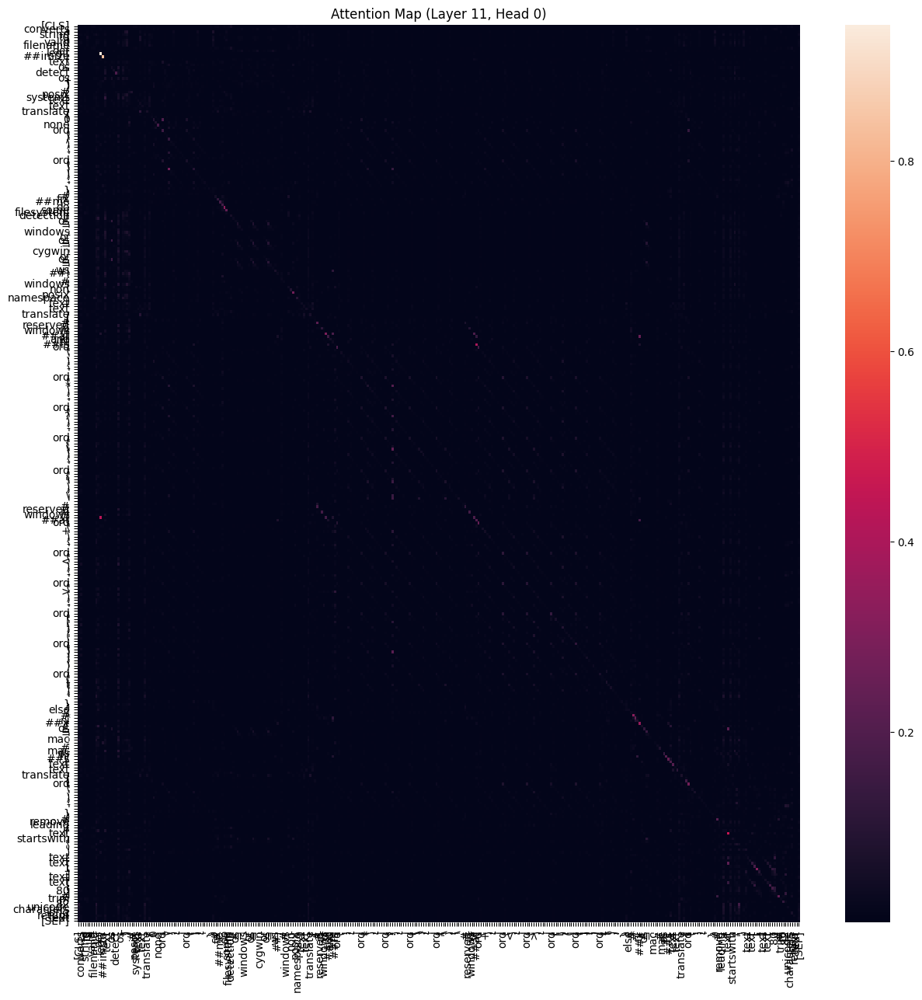

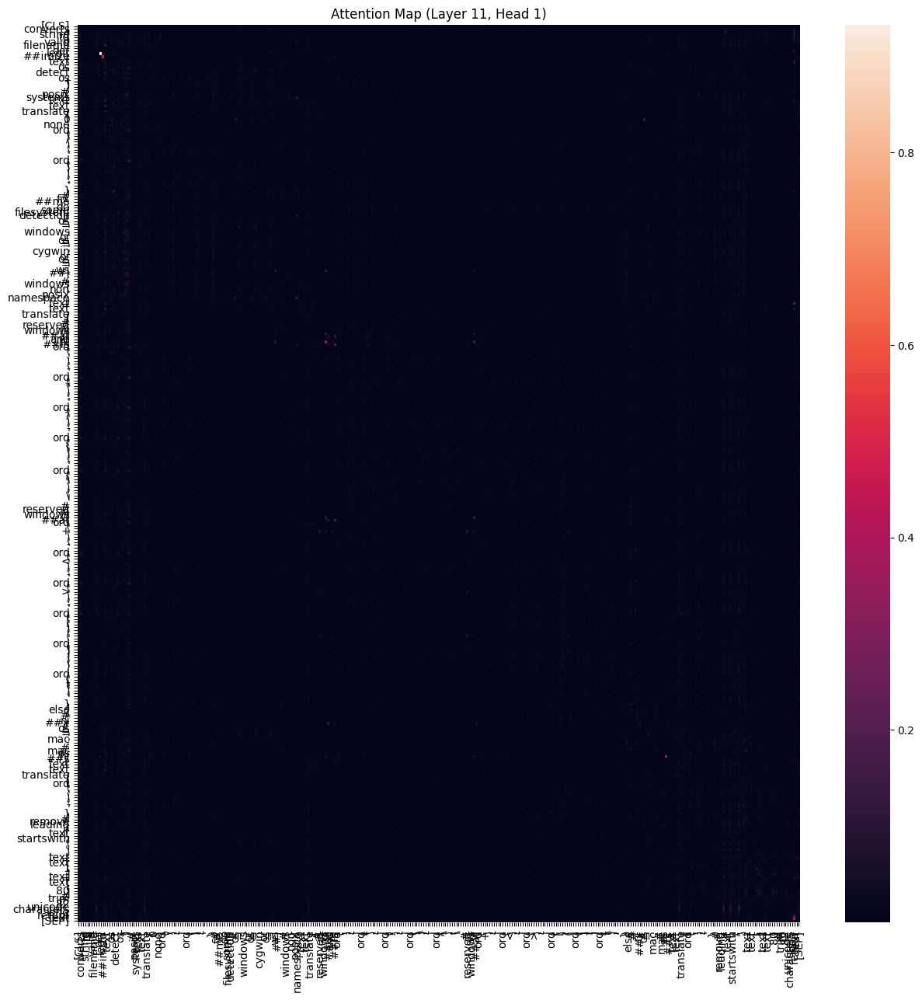

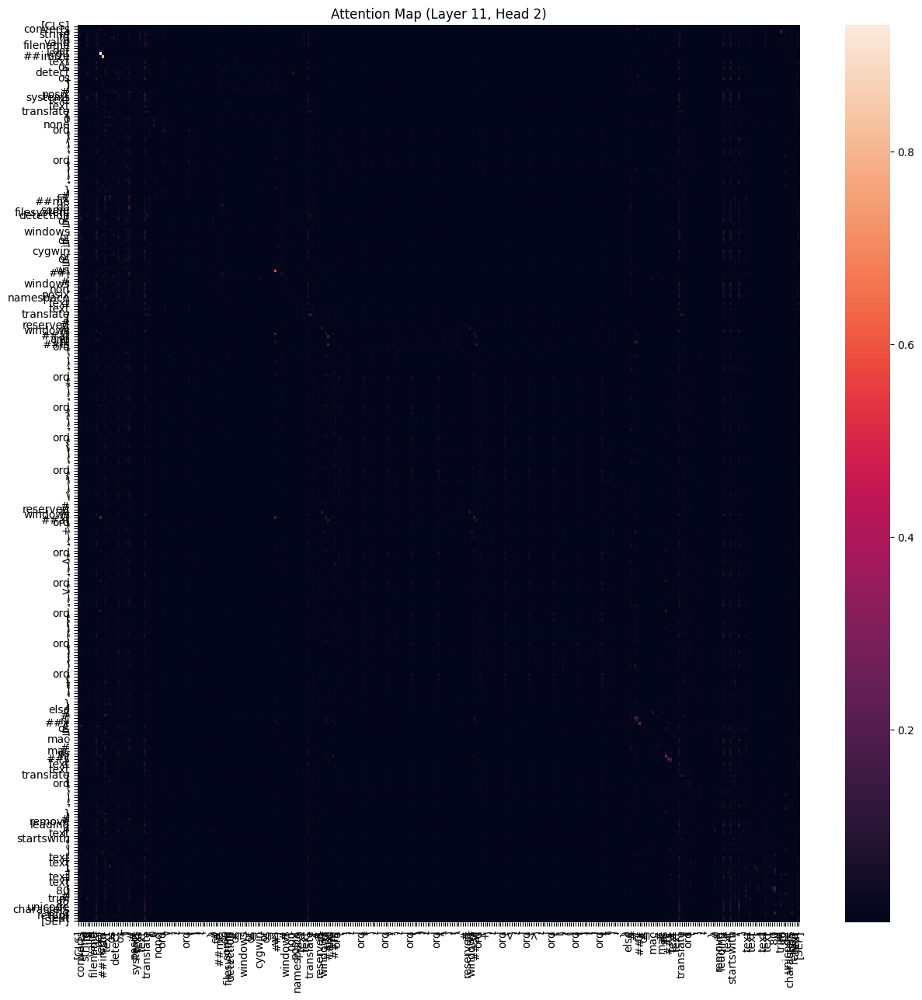

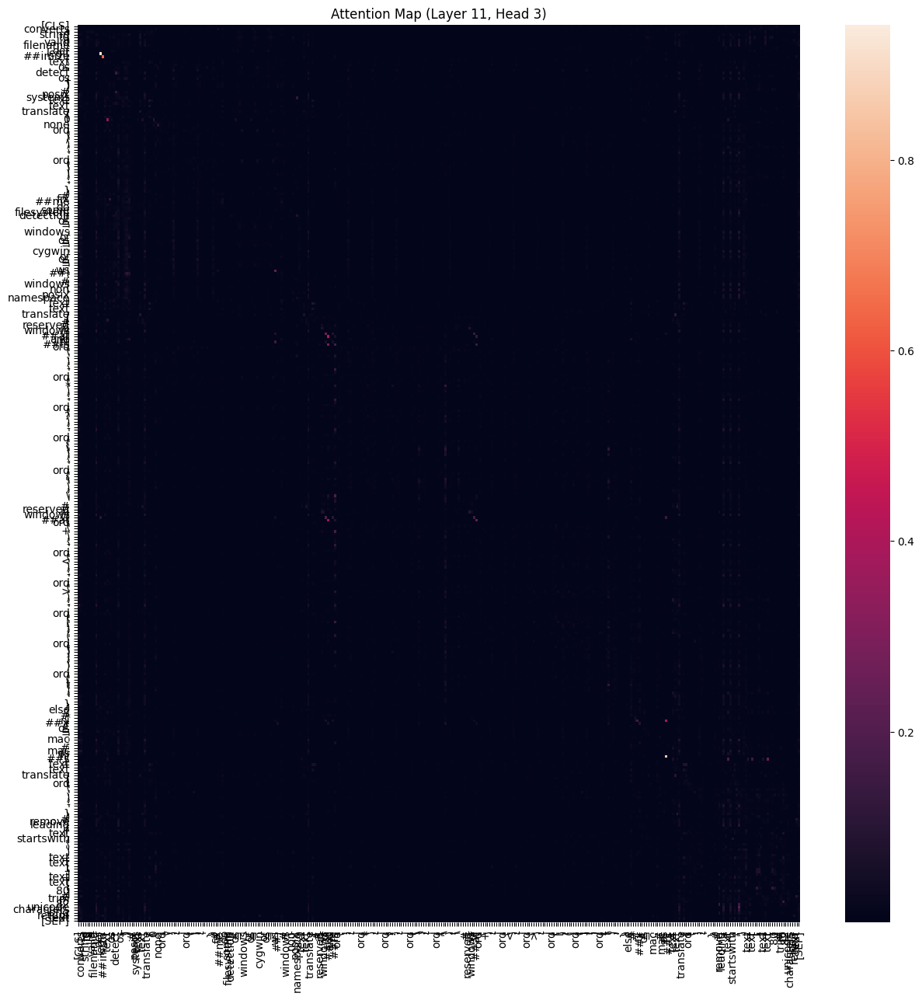

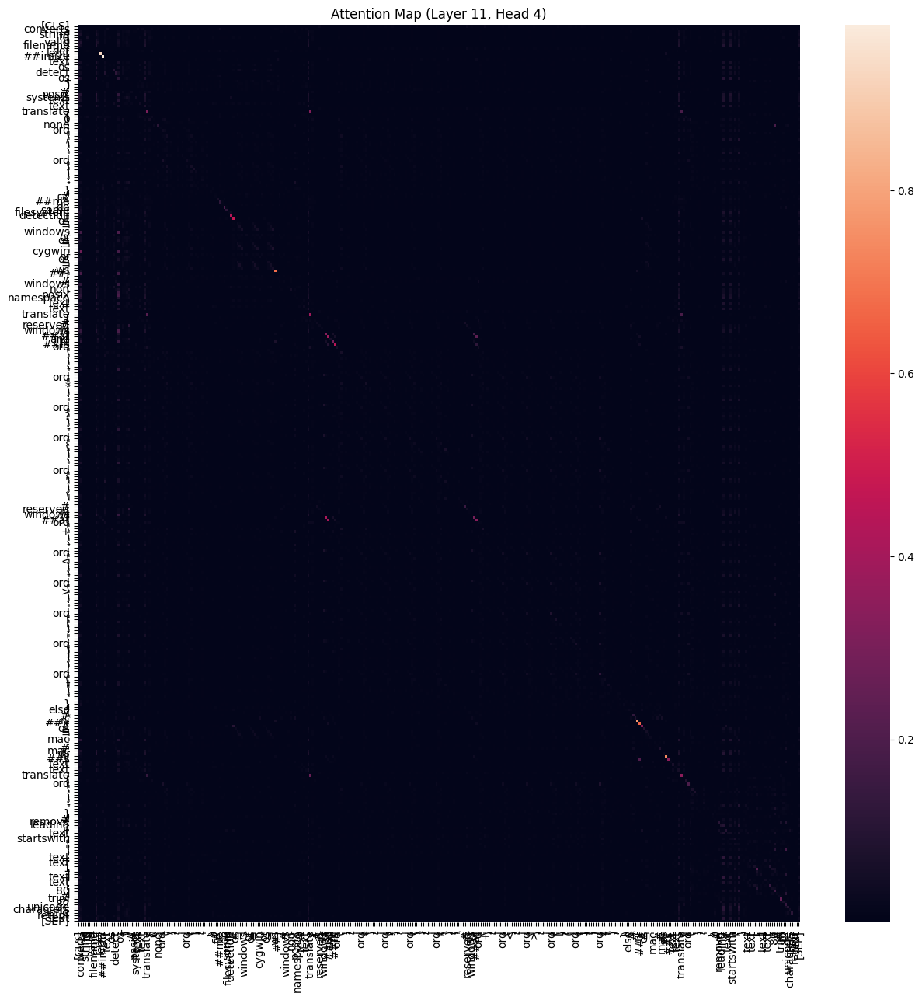

...

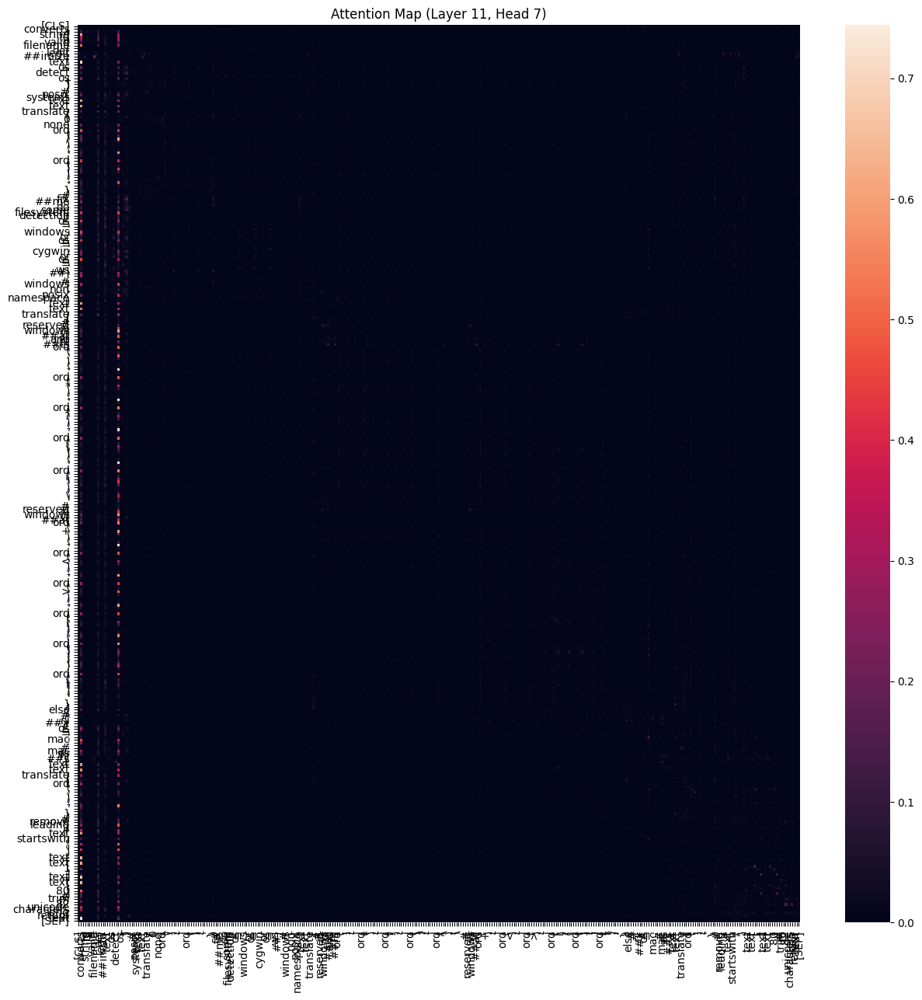

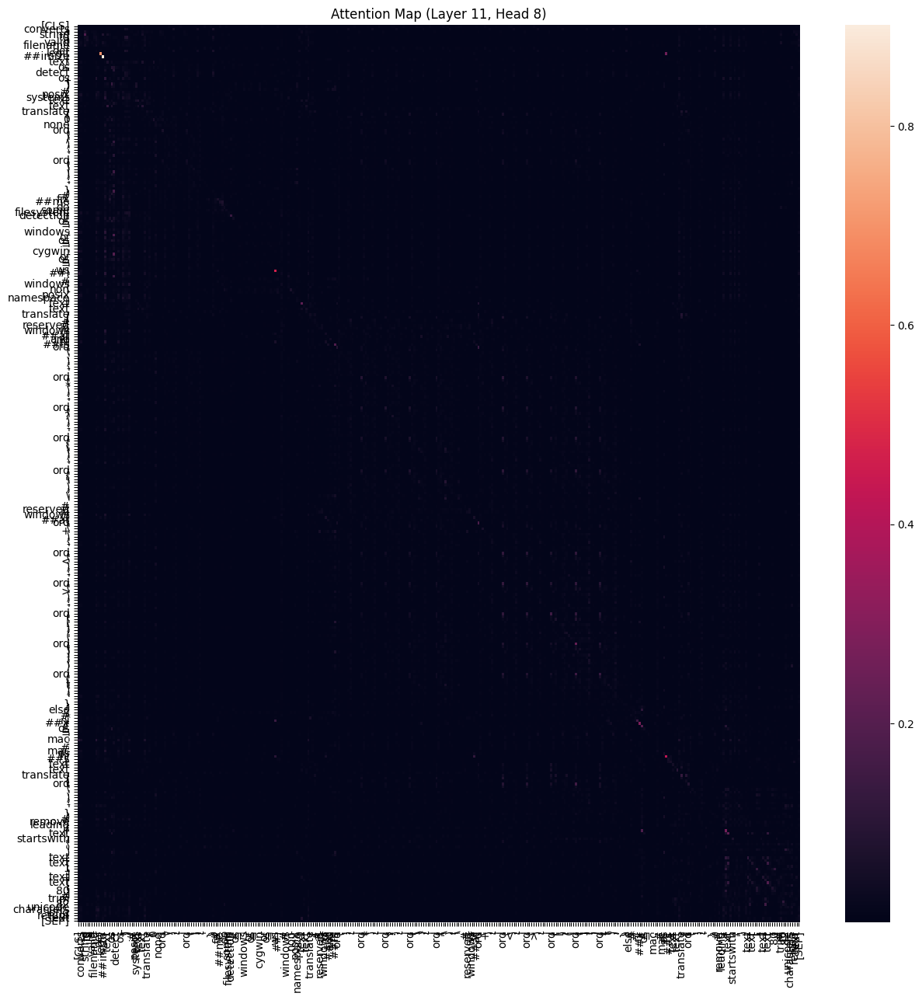

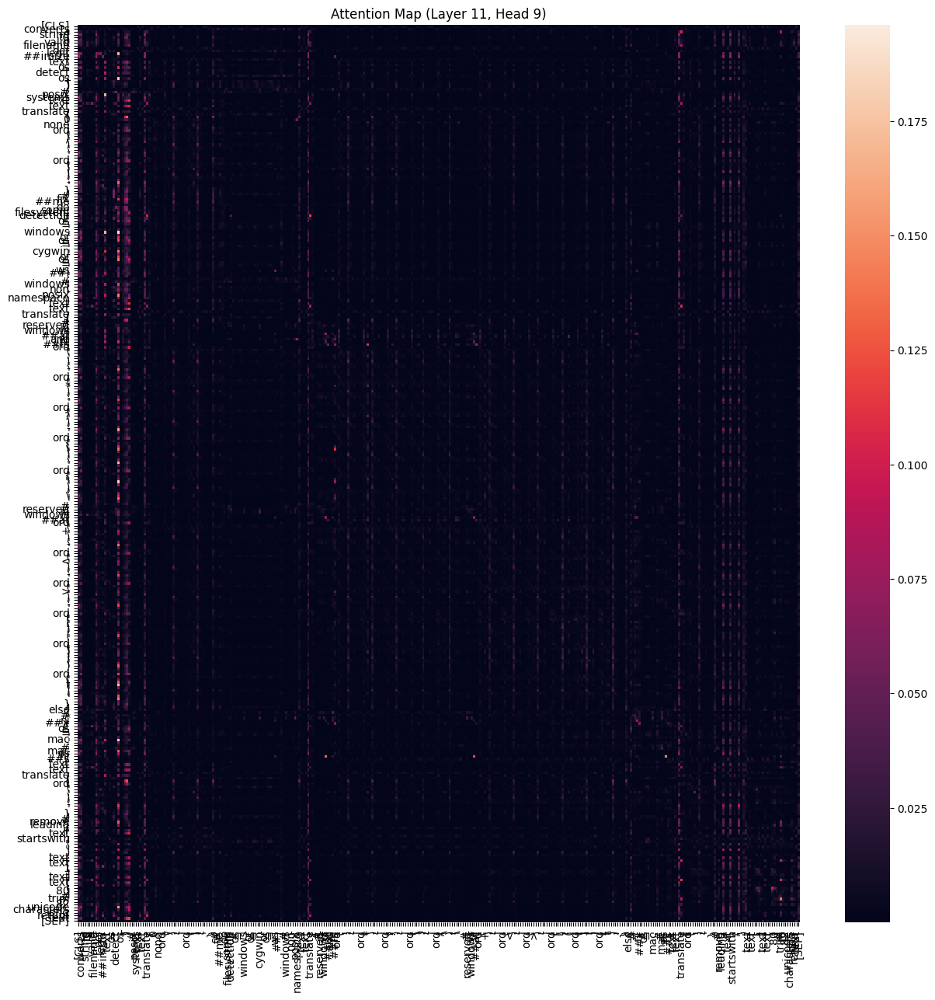

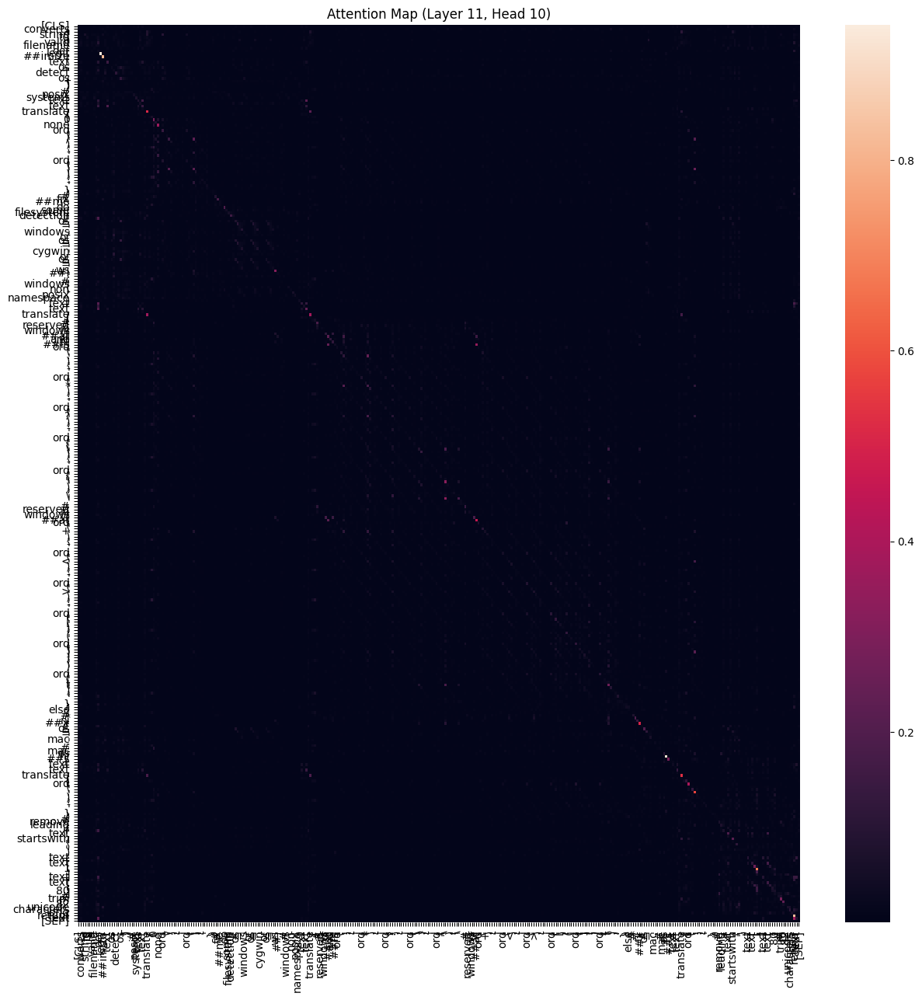

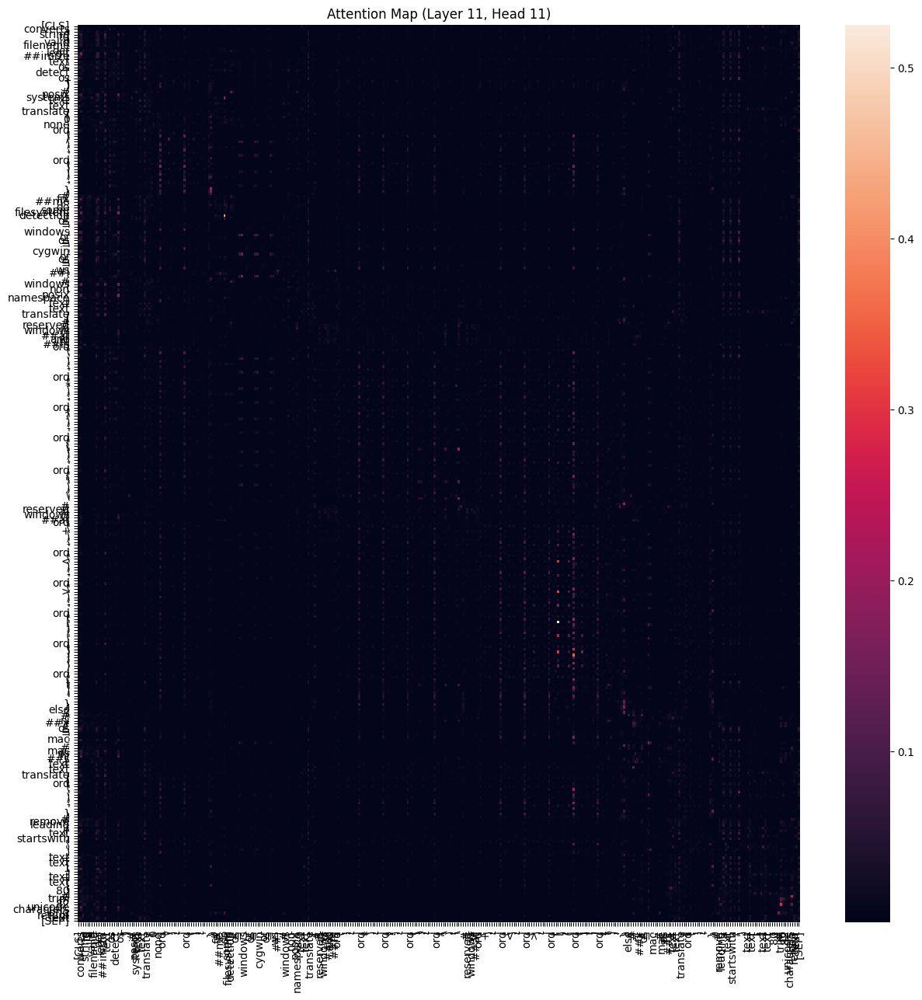


microsoft/codebert-base-mlm のAttention可視化 (12層のすべてのヘッド):


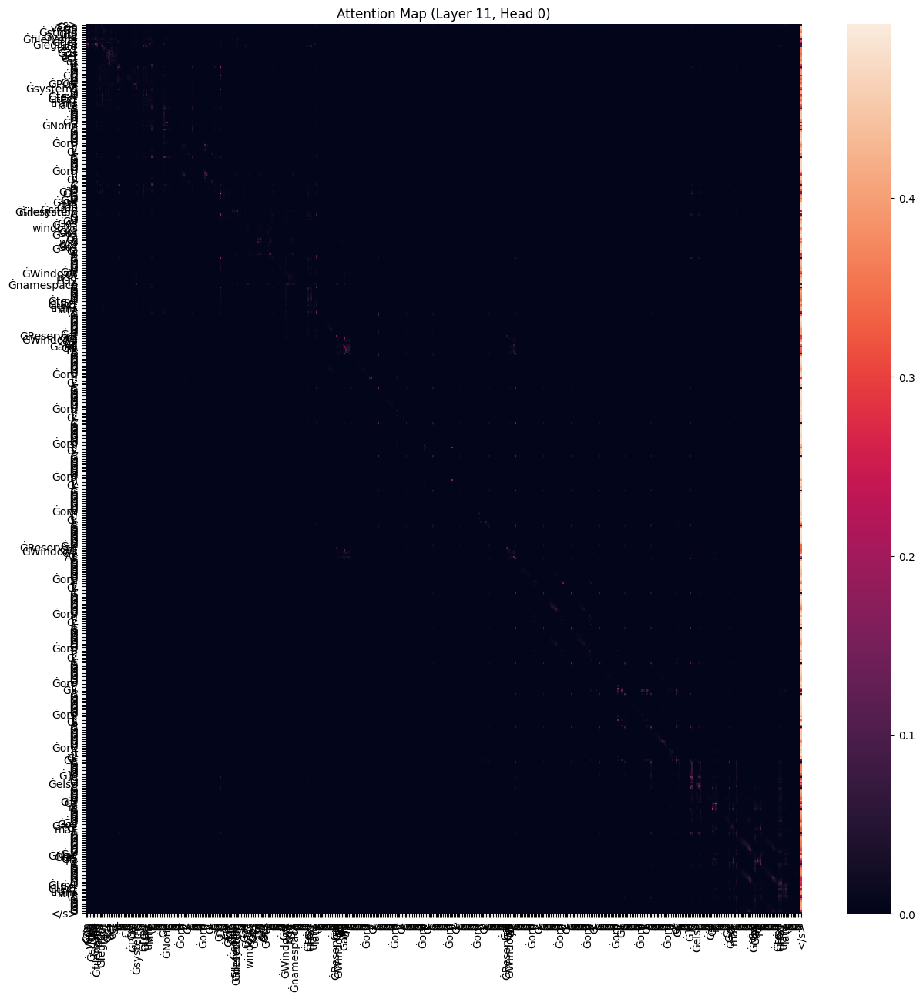

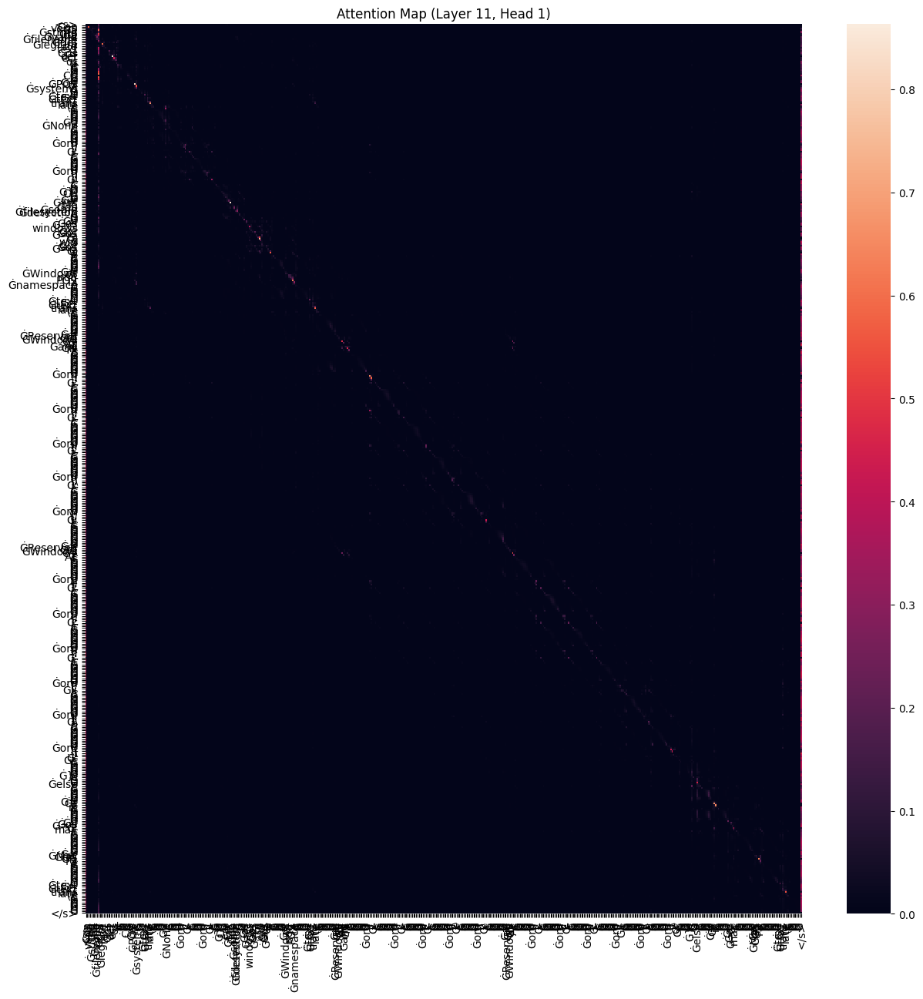

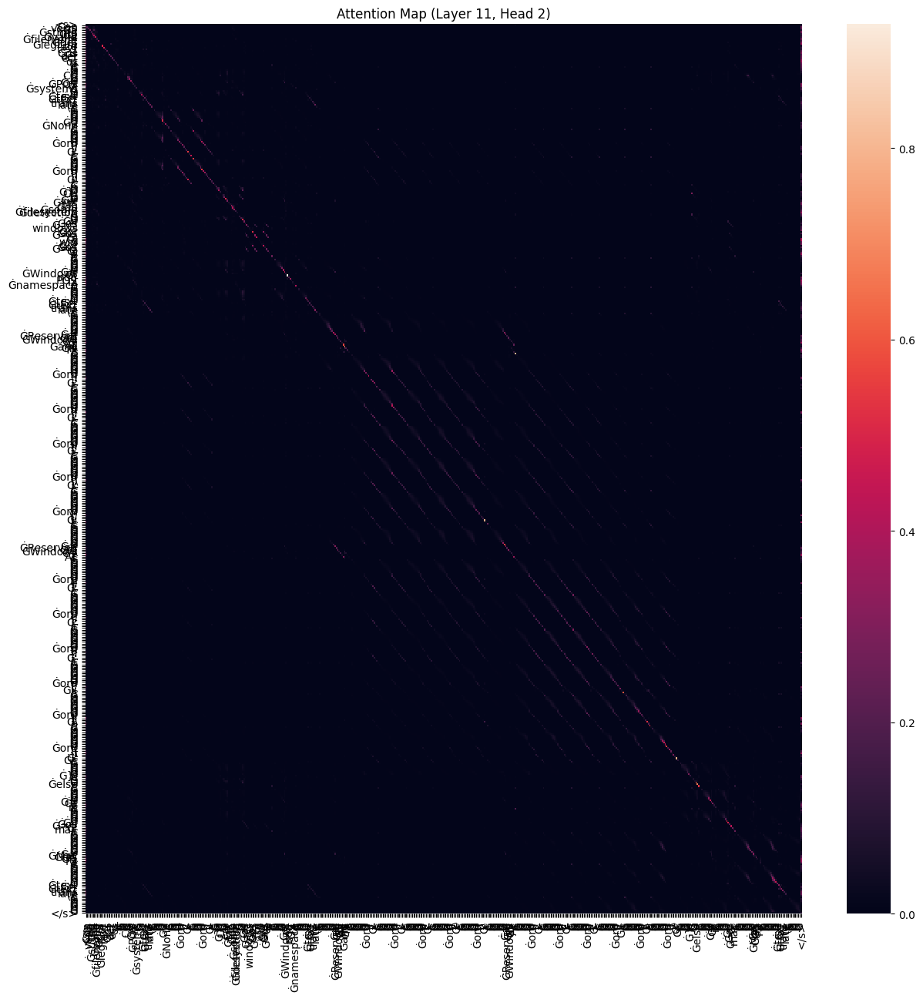

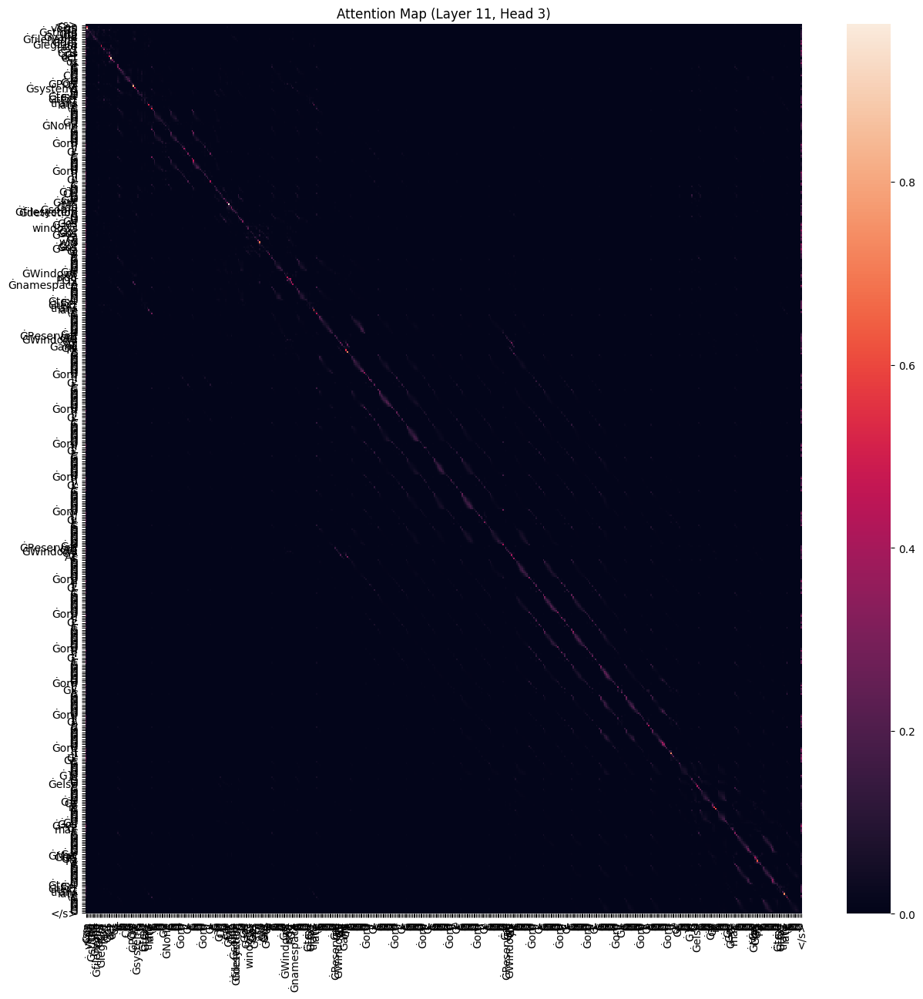

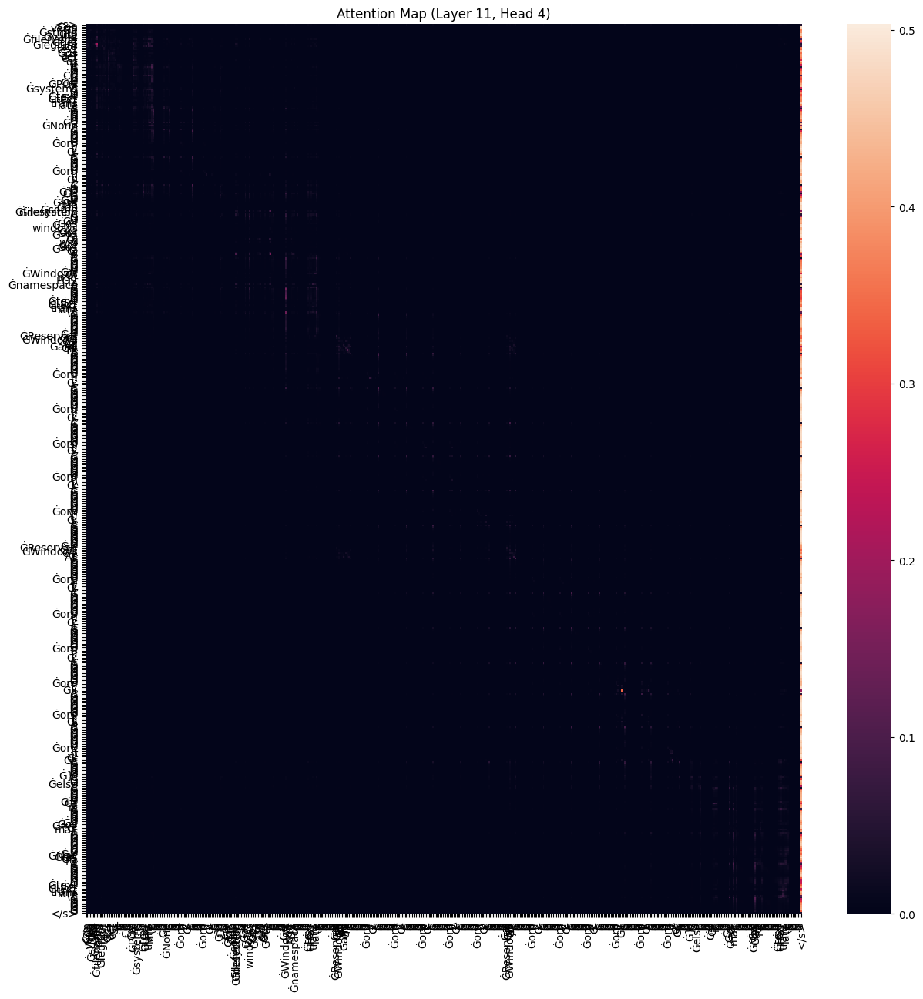

...

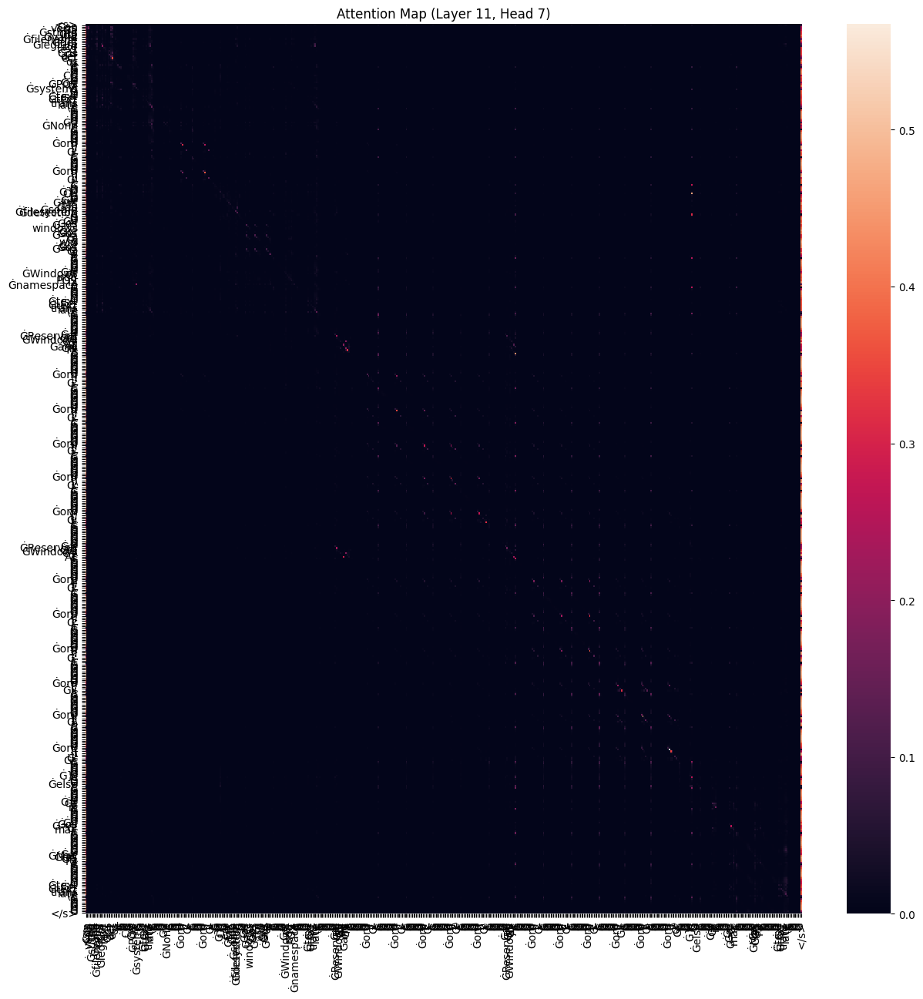

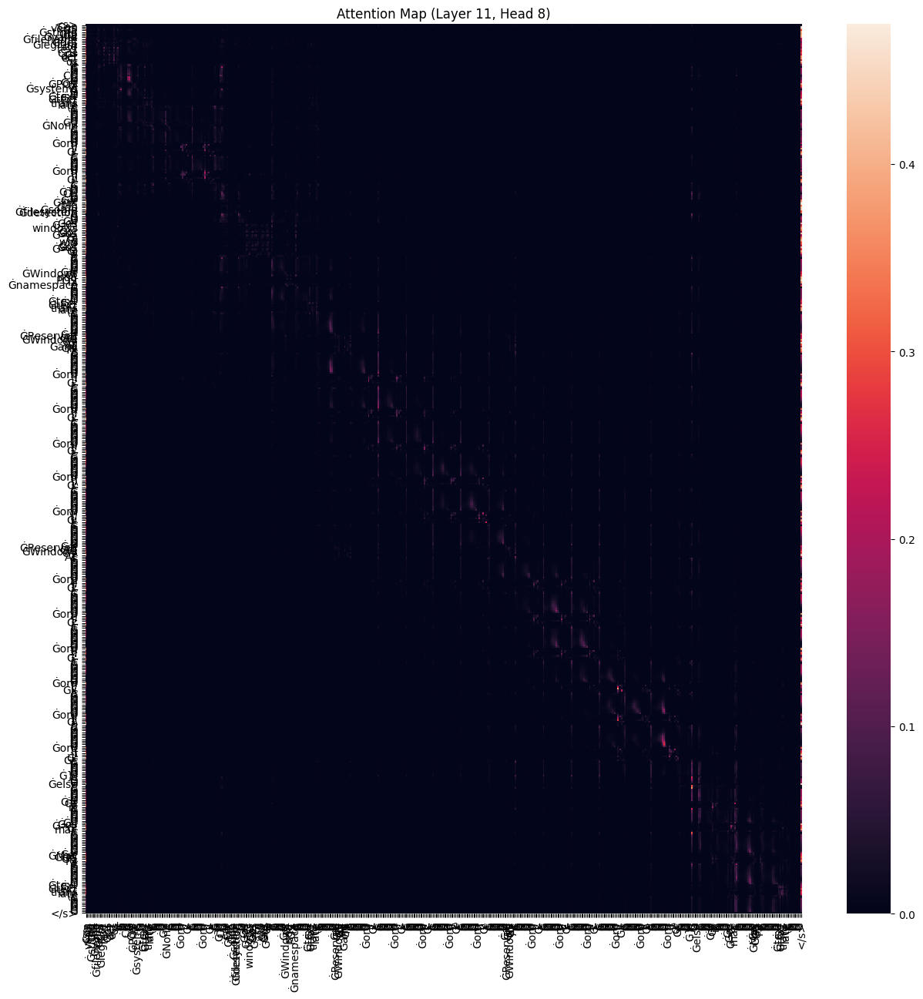

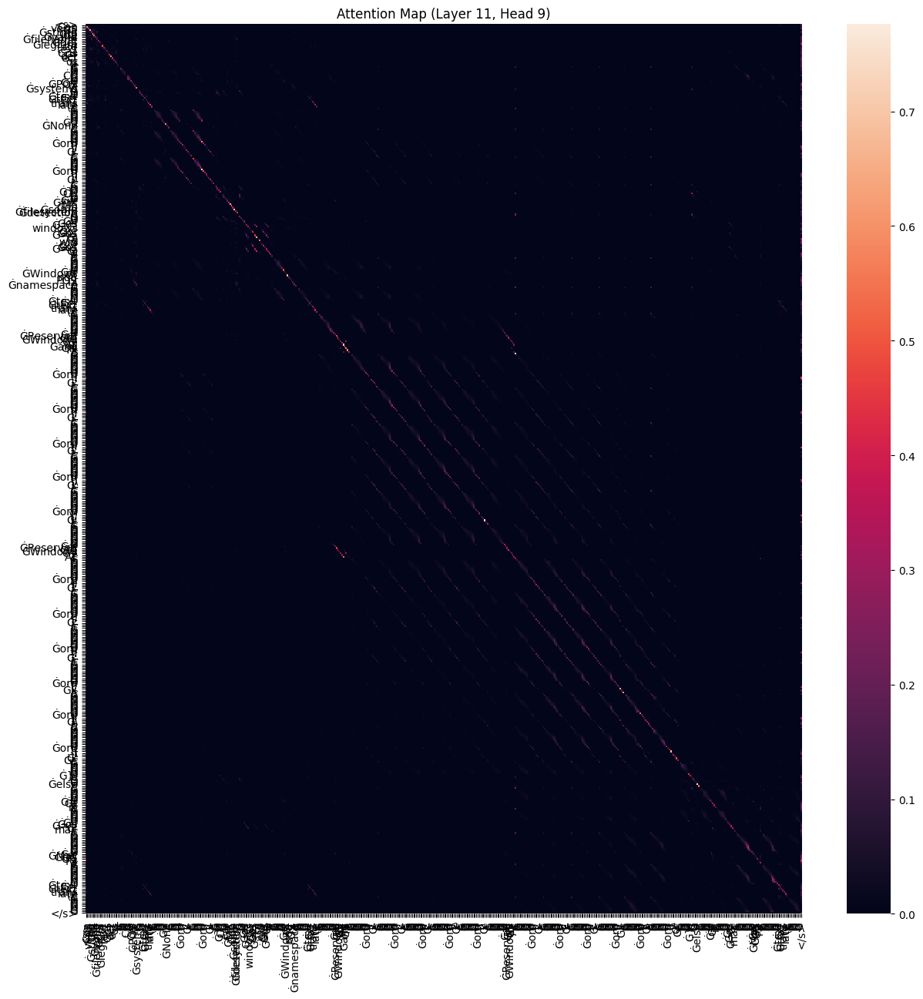

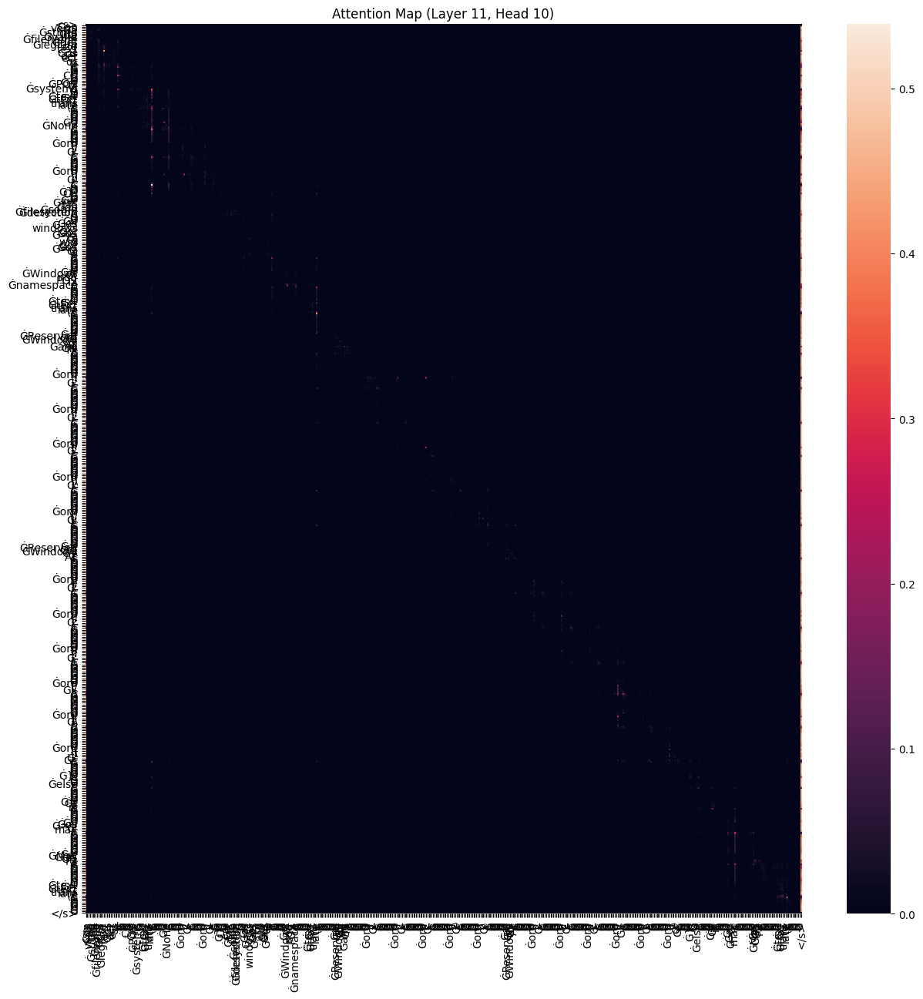

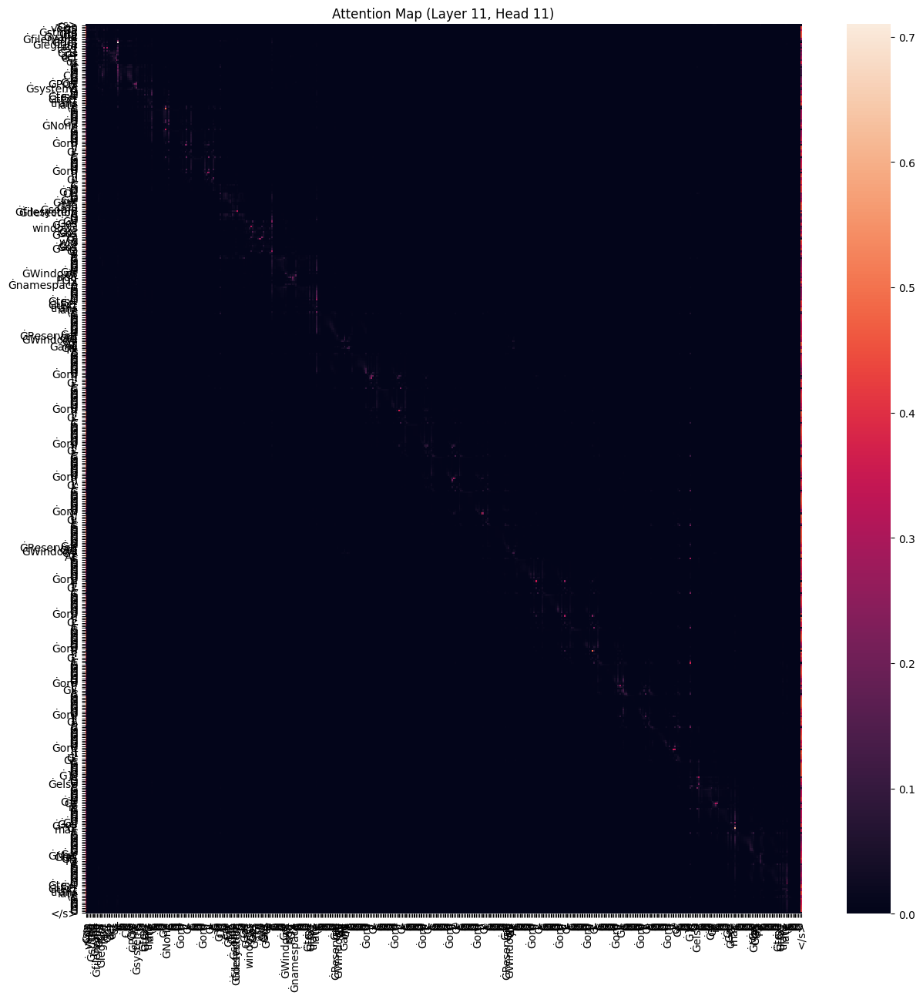

In [ ]:


def visualize_all_heads(model, tokenizer, query, code, device, layer=12):
    """
    指定した層のすべてのヘッドのAttentionを可視化する関数
    """
    combined_text = query + " " + code
    inputs = tokenizer(combined_text, return_tensors="pt", truncation=True, padding=True).to(device)

    with torch.no_grad():
        outputs = model(**inputs, output_attentions=True)

    num_heads = outputs.attentions[layer].shape[1]  # ヘッド数を取得

    for head in range(num_heads):
        attentions = outputs.attentions[layer][0, head].cpu().numpy()
        combined_tokens = tokenizer.convert_ids_to_tokens(inputs["input_ids"][0])

        fig, ax = plt.subplots(figsize=(15, 15))
        sns.heatmap(attentions, xticklabels=combined_tokens, yticklabels=combined_tokens, ax=ax)
        plt.title(f"Attention Map (Layer {layer}, Head {head})")
        plt.show()

if __name__ == "__main__":
    # ... (モデル、tokenizerのロード、データセットの準備)


    # モデル1の可視化 (8層のすべてのヘッド)
    print(f"\n{model_name1} のAttention可視化 (12層のすべてのヘッド):")
    visualize_all_heads(model1, tokenizer1, query_text, cleaned_code_text, device, layer=11)

    # モデル2の可視化 (8層のすべてのヘッド)
    print(f"\n{model_name2} のAttention可視化 (12層のすべてのヘッド):")
    visualize_all_heads(model2, tokenizer2, query_text, cleaned_code_text, device, layer=11)


Shuu12121/CodeMorph-BERT のAttention可視化 (1から12層の3番目のヘッド):


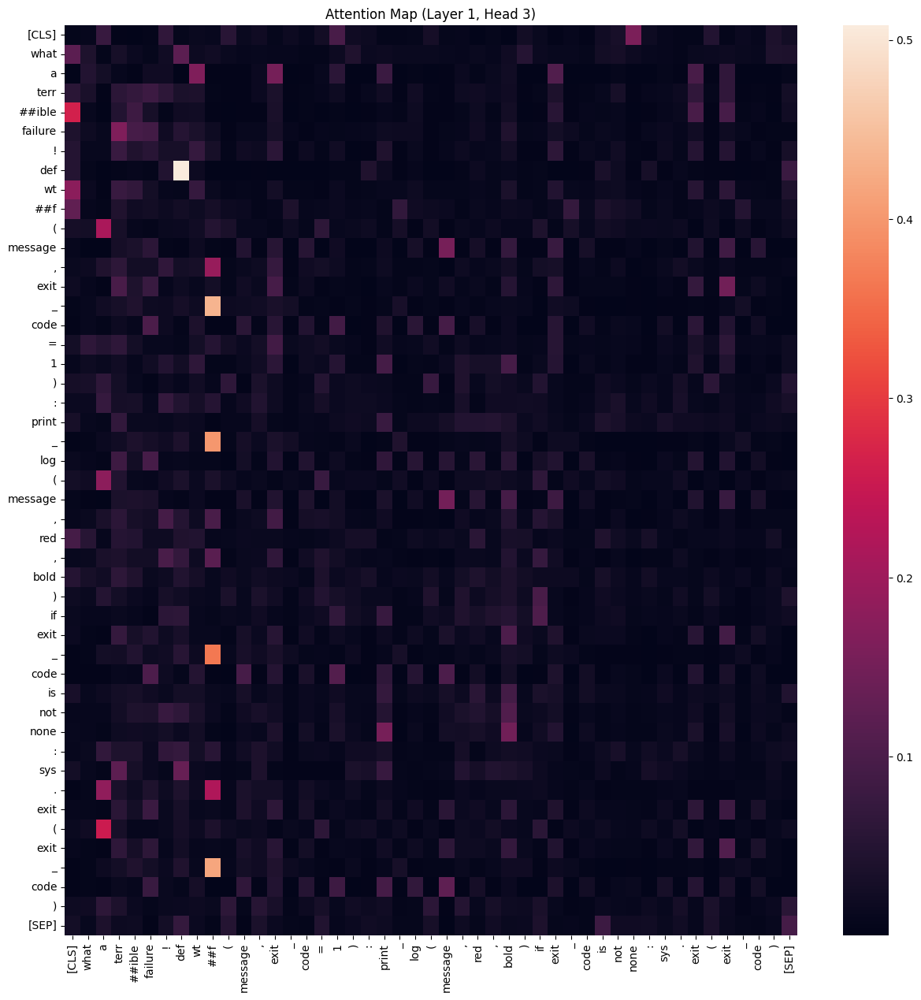

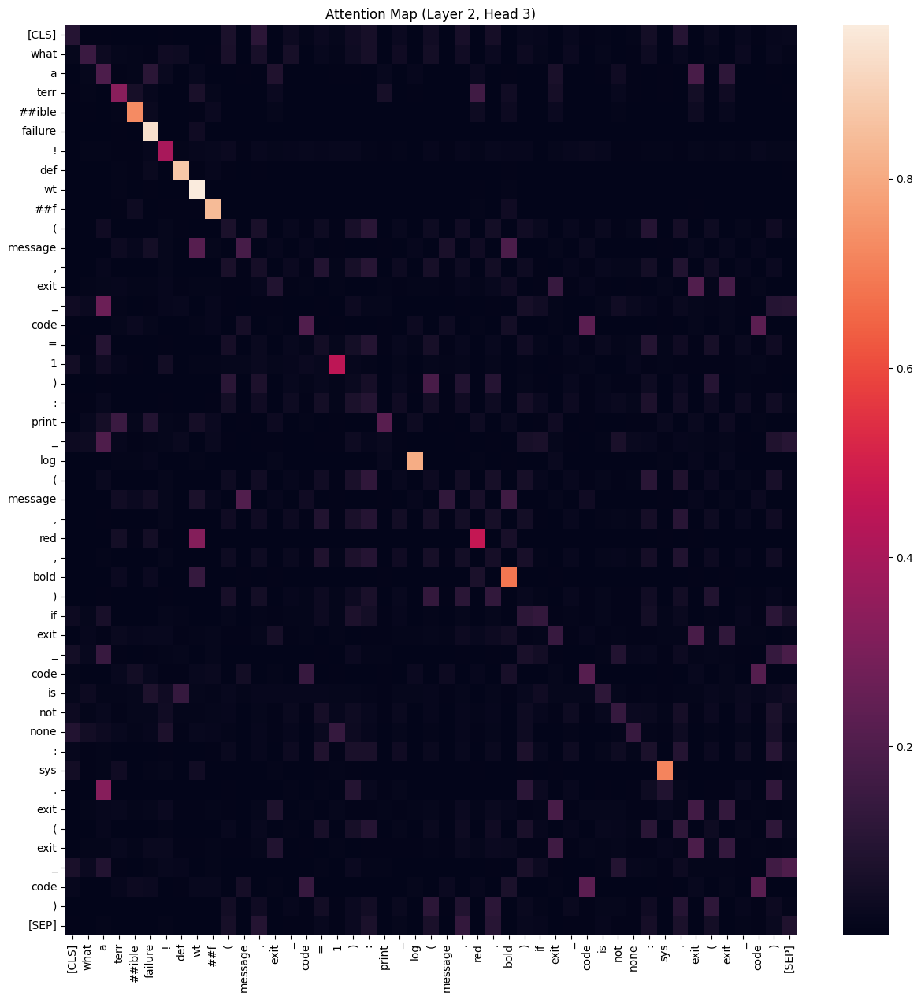

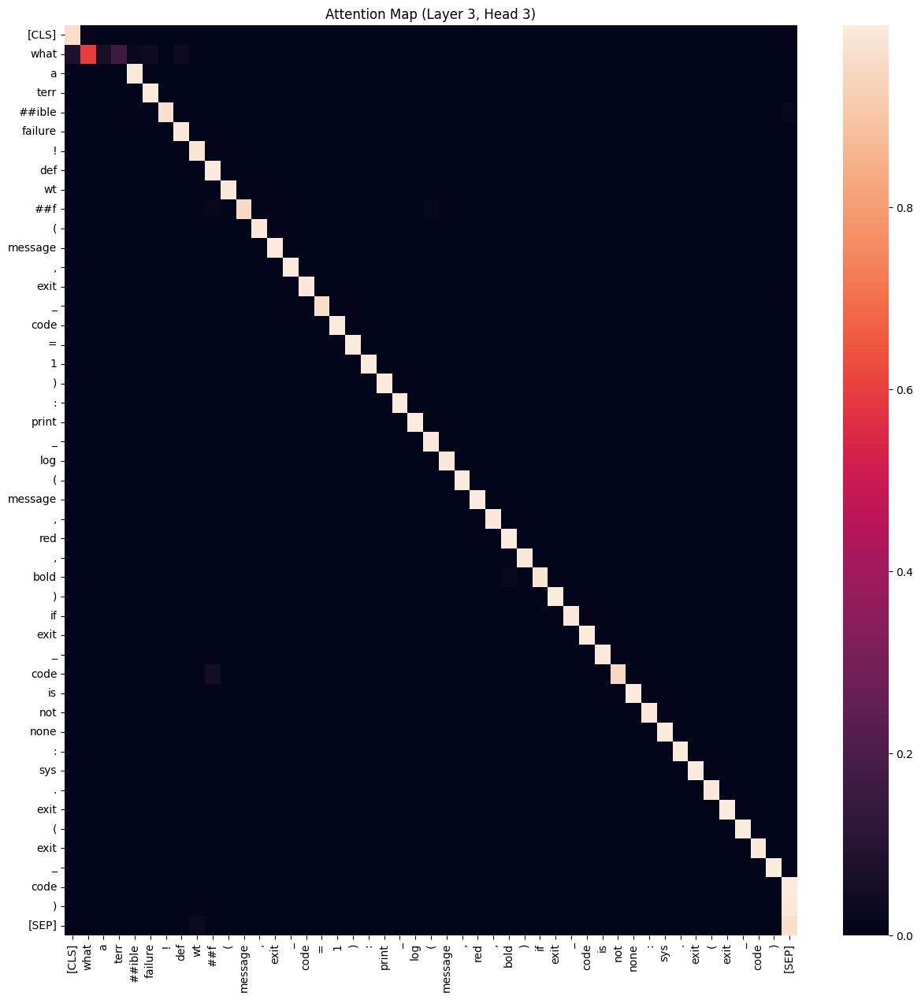

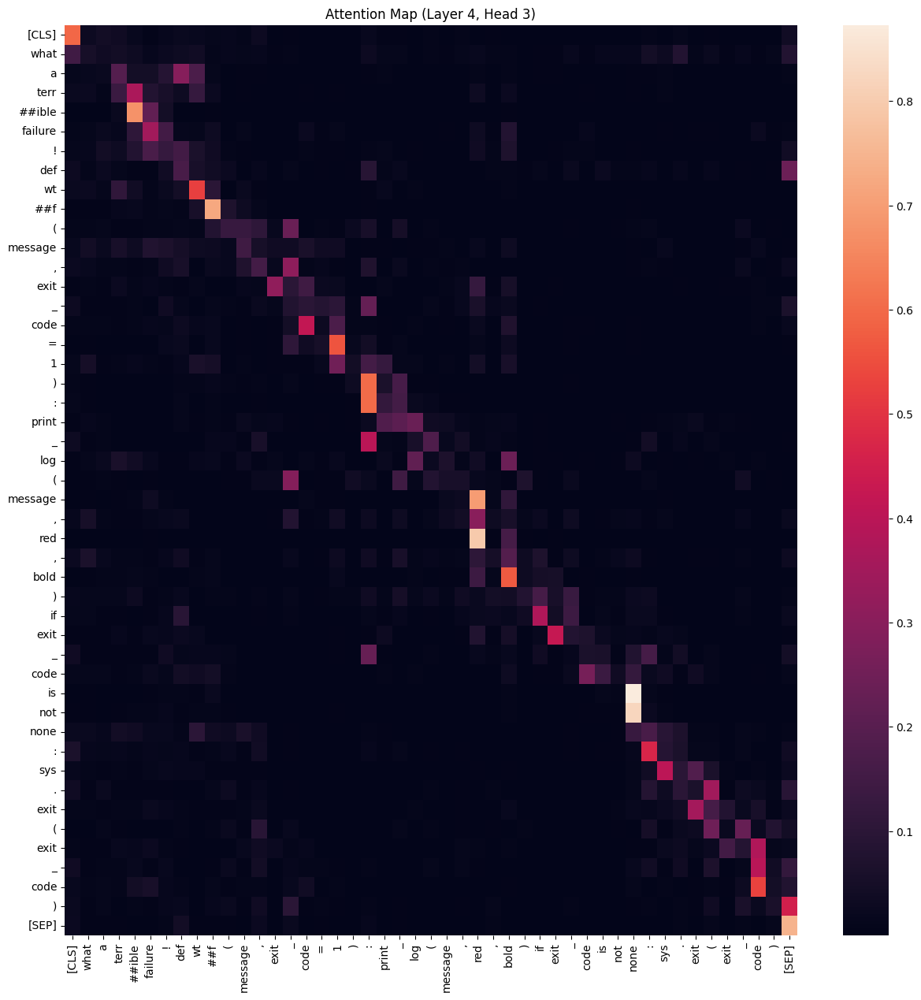

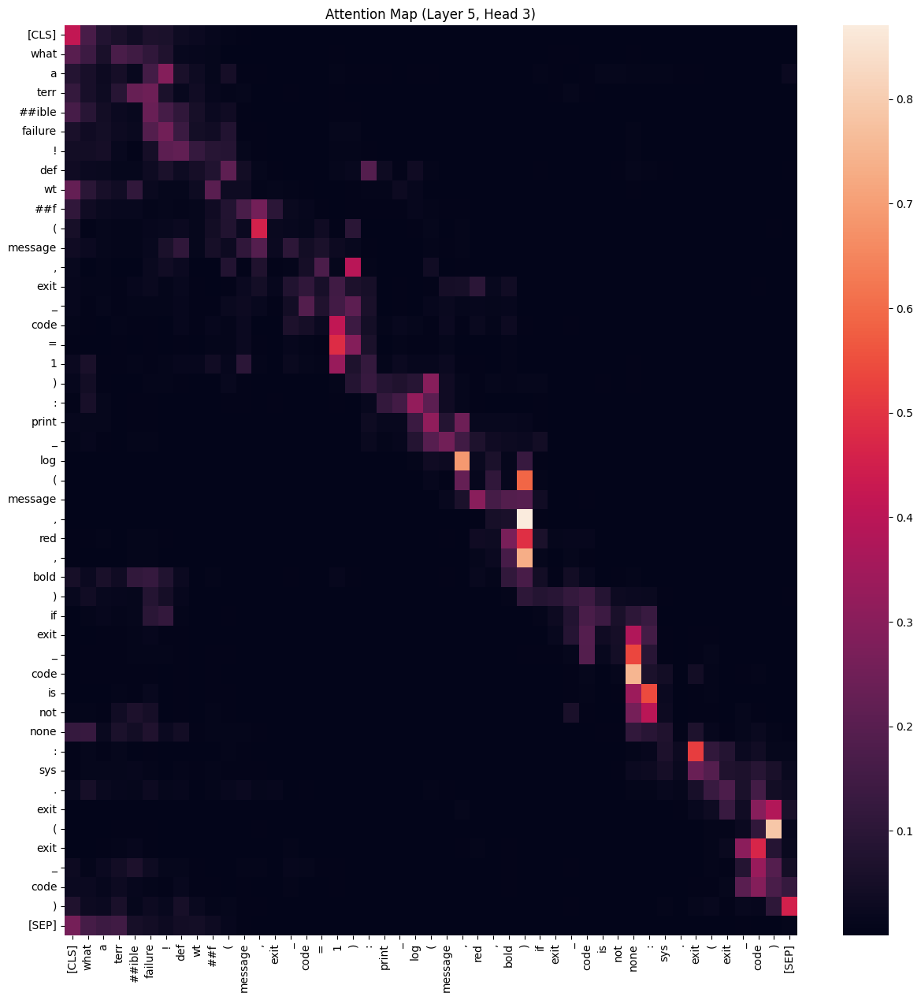

...

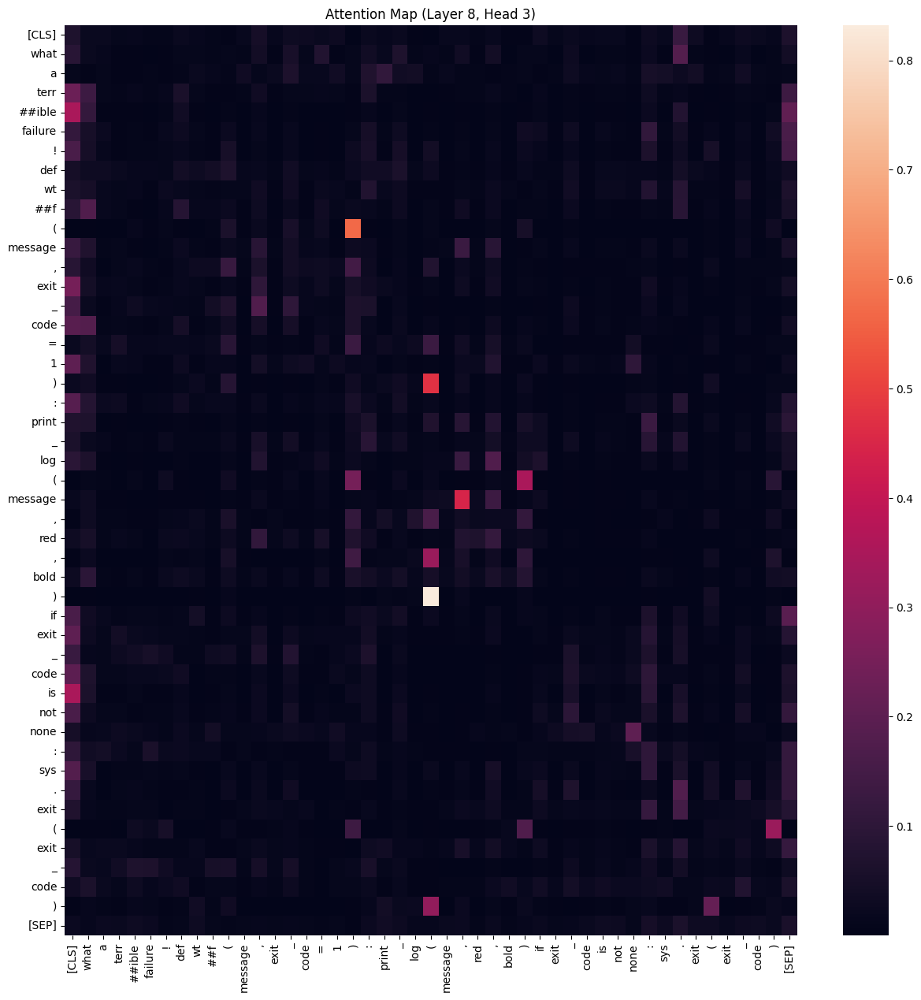

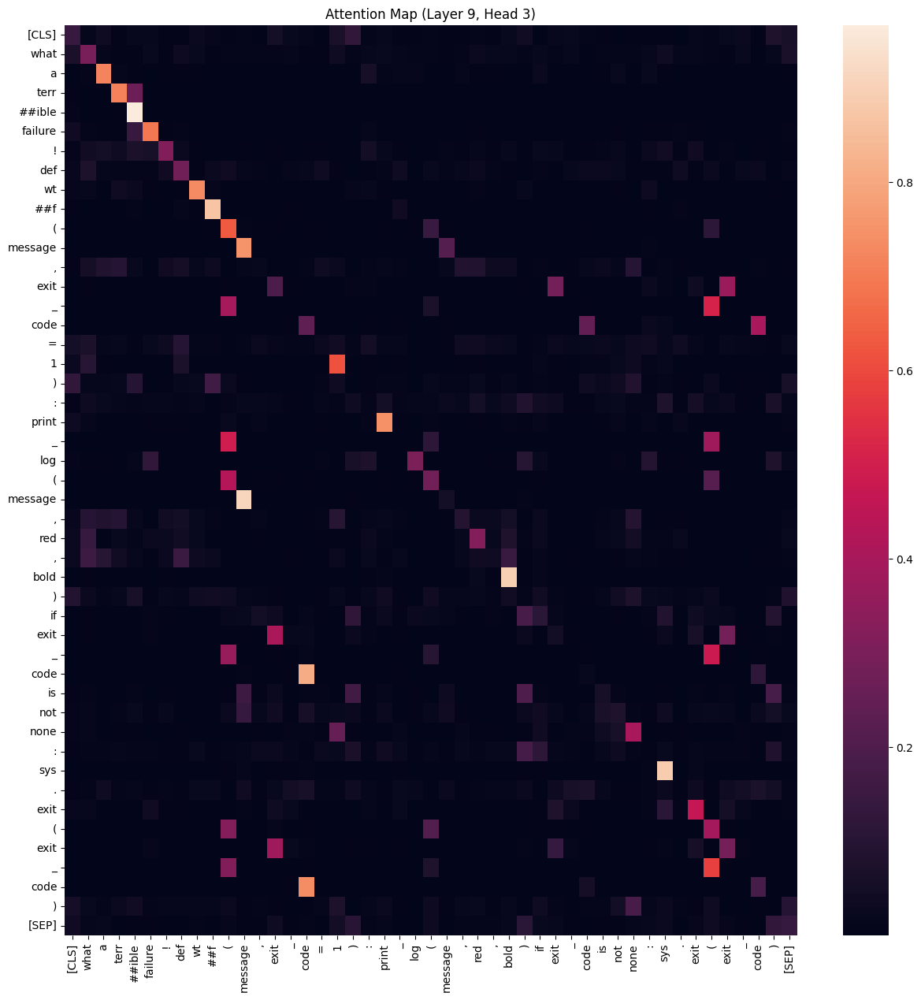

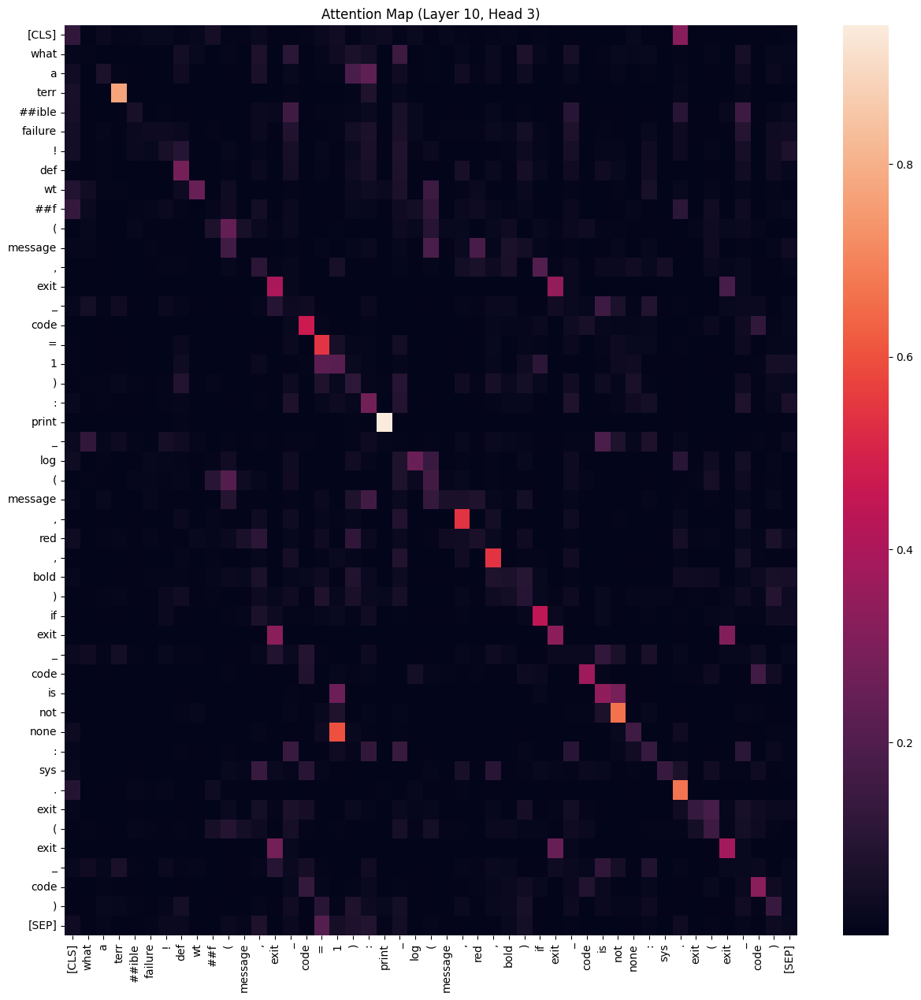

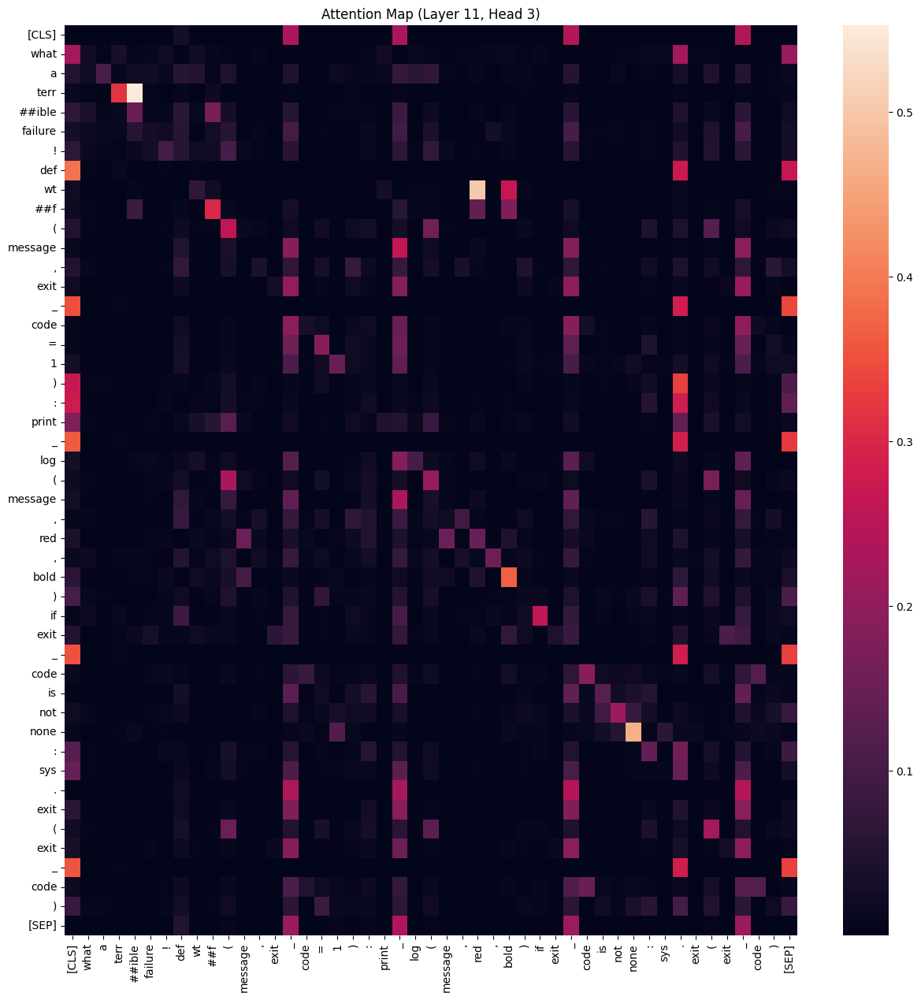

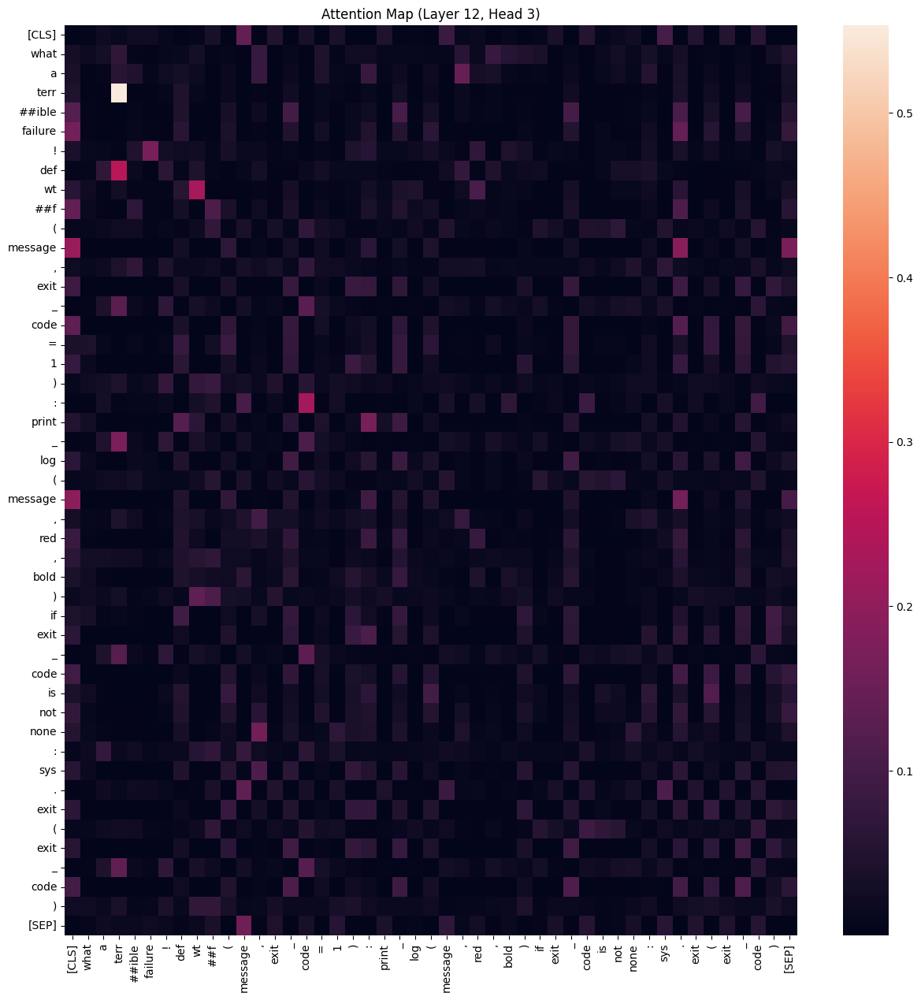


microsoft/codebert-base-mlm のAttention可視化 (1から12層の3番目のヘッド):


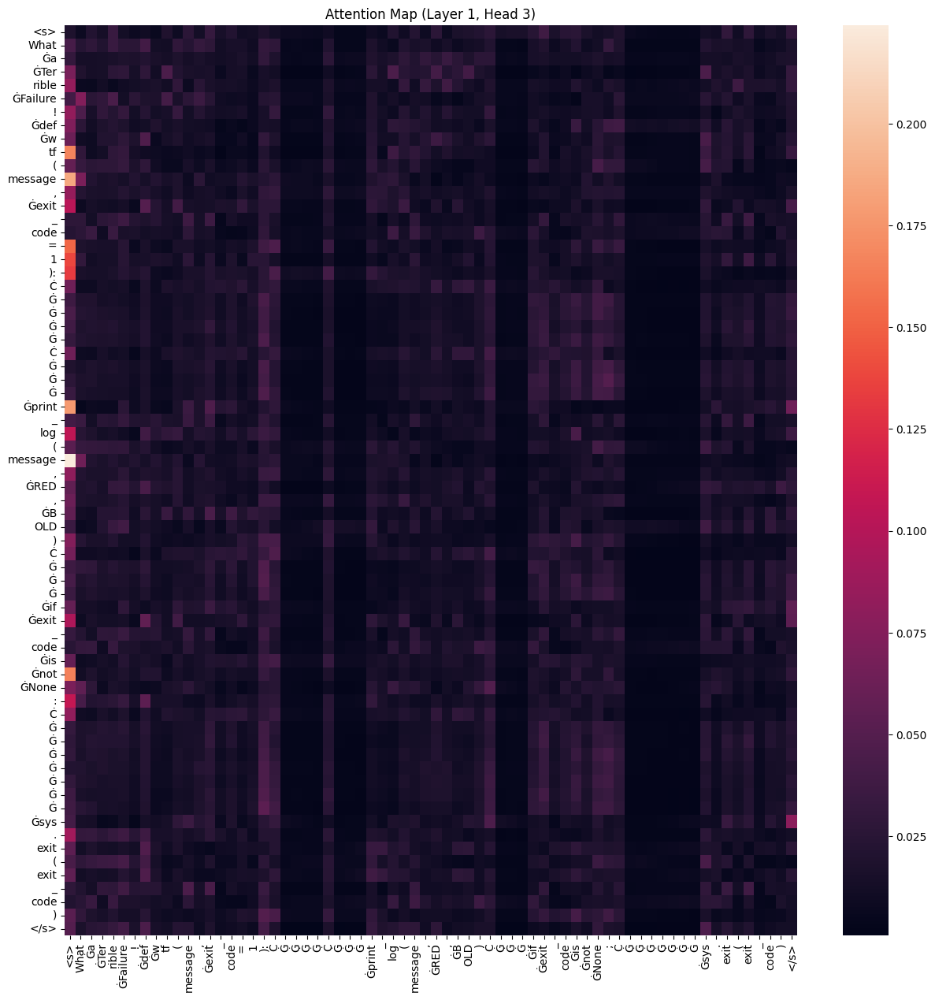

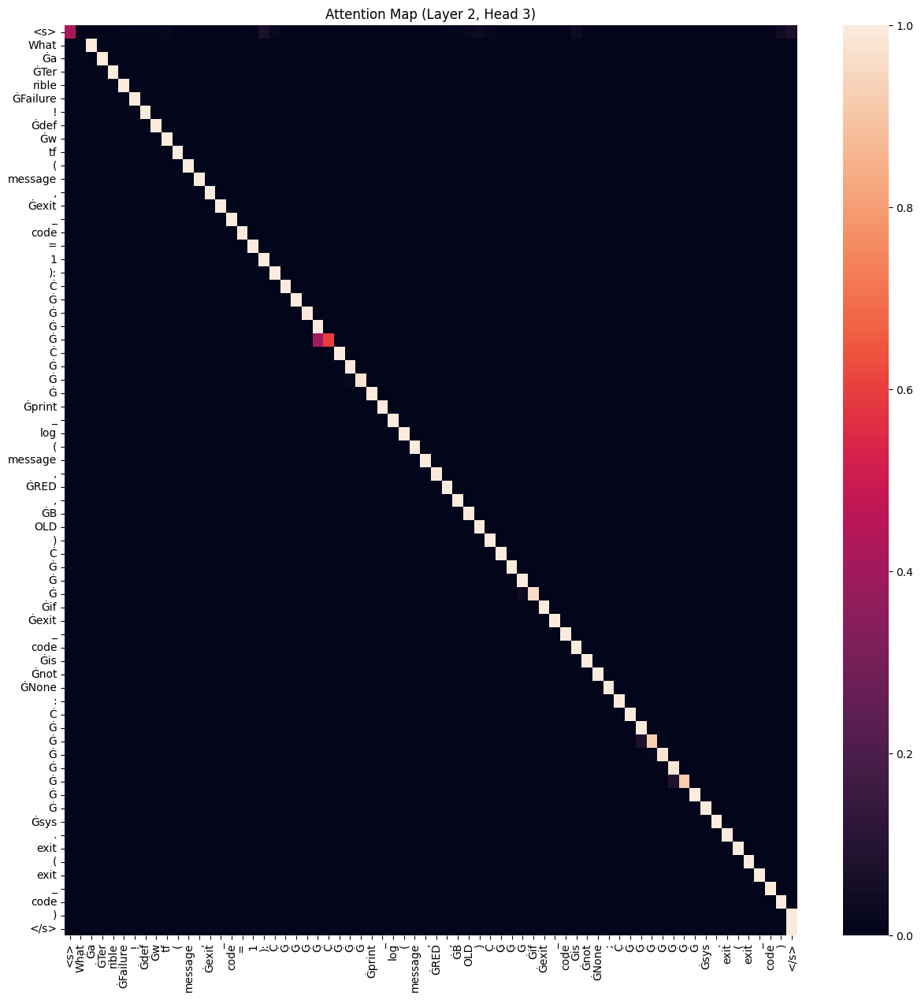

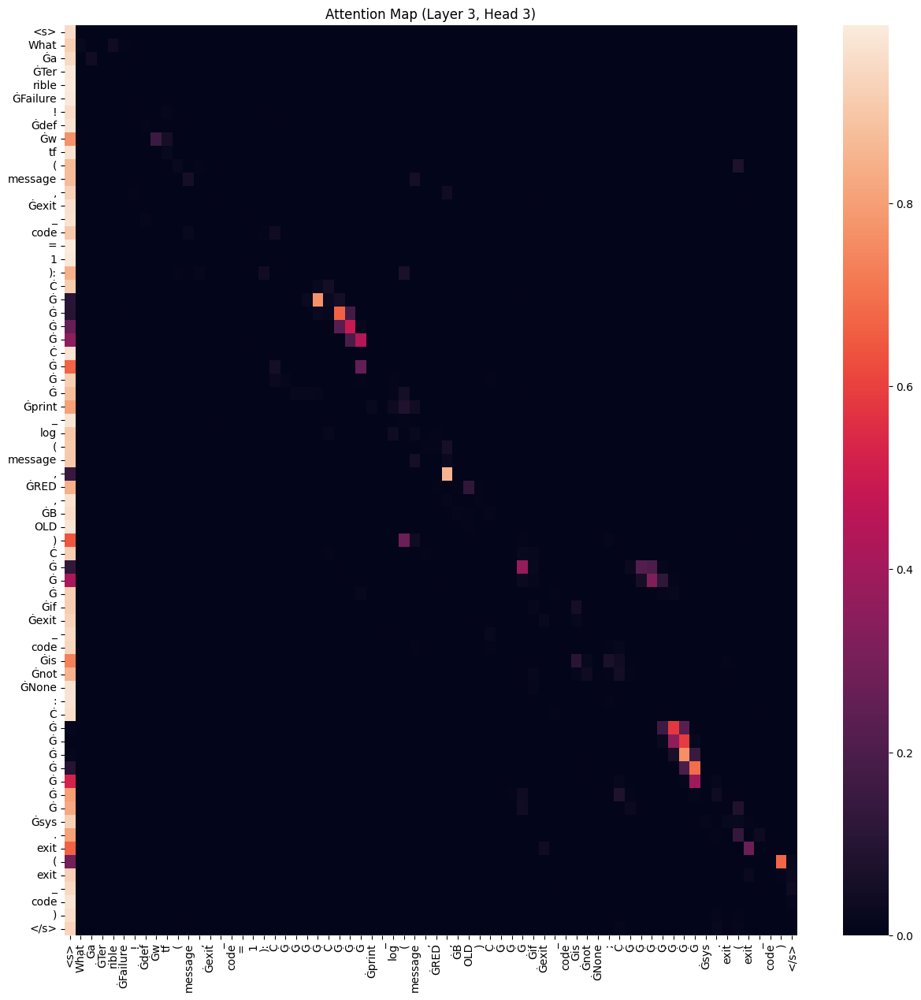

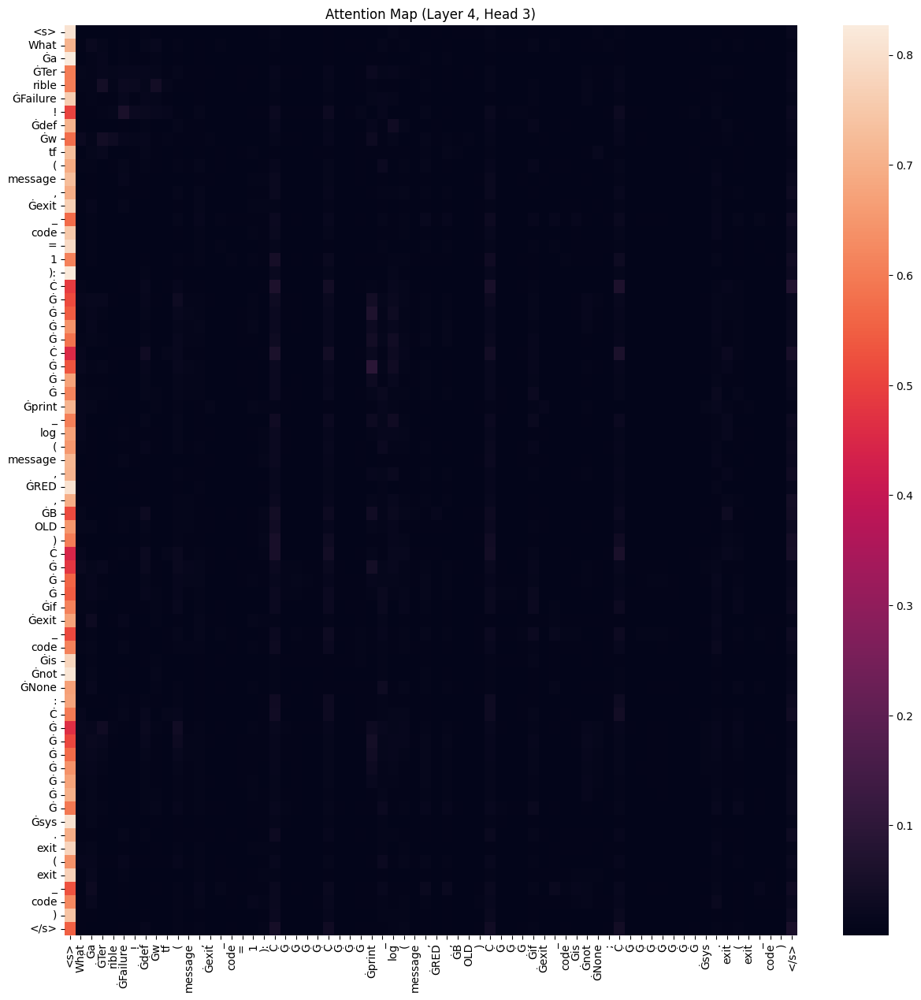

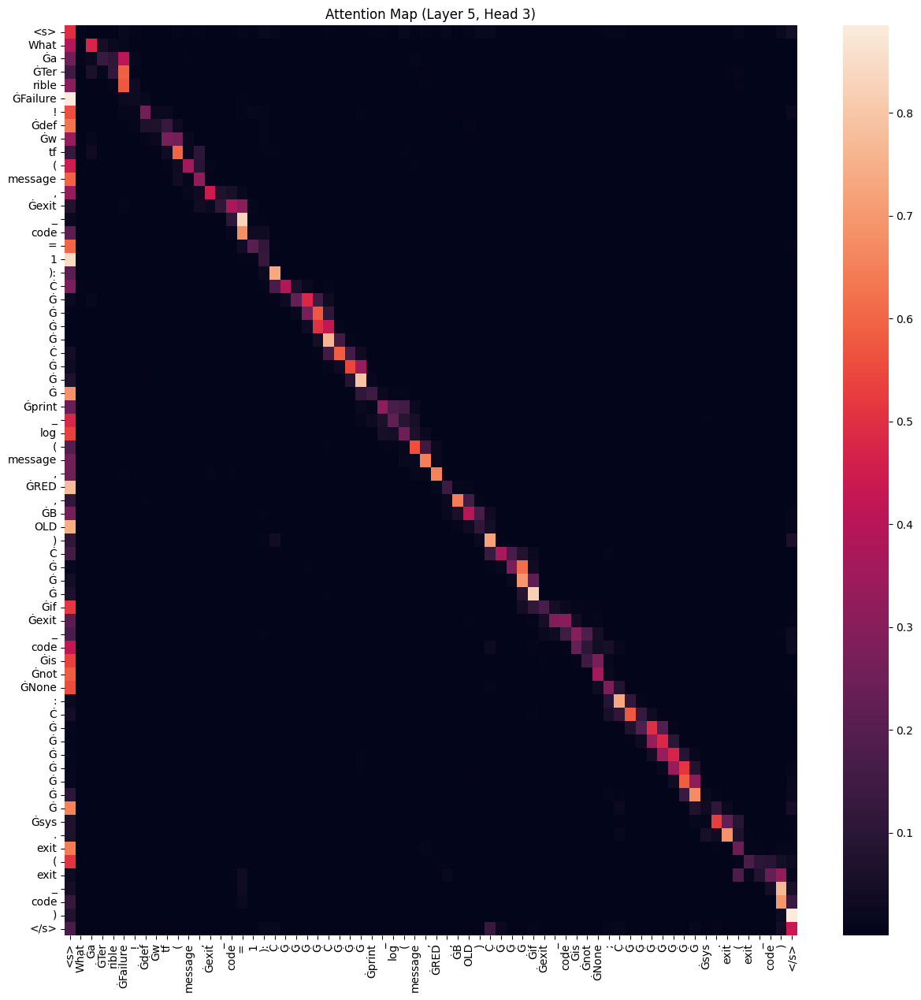

...

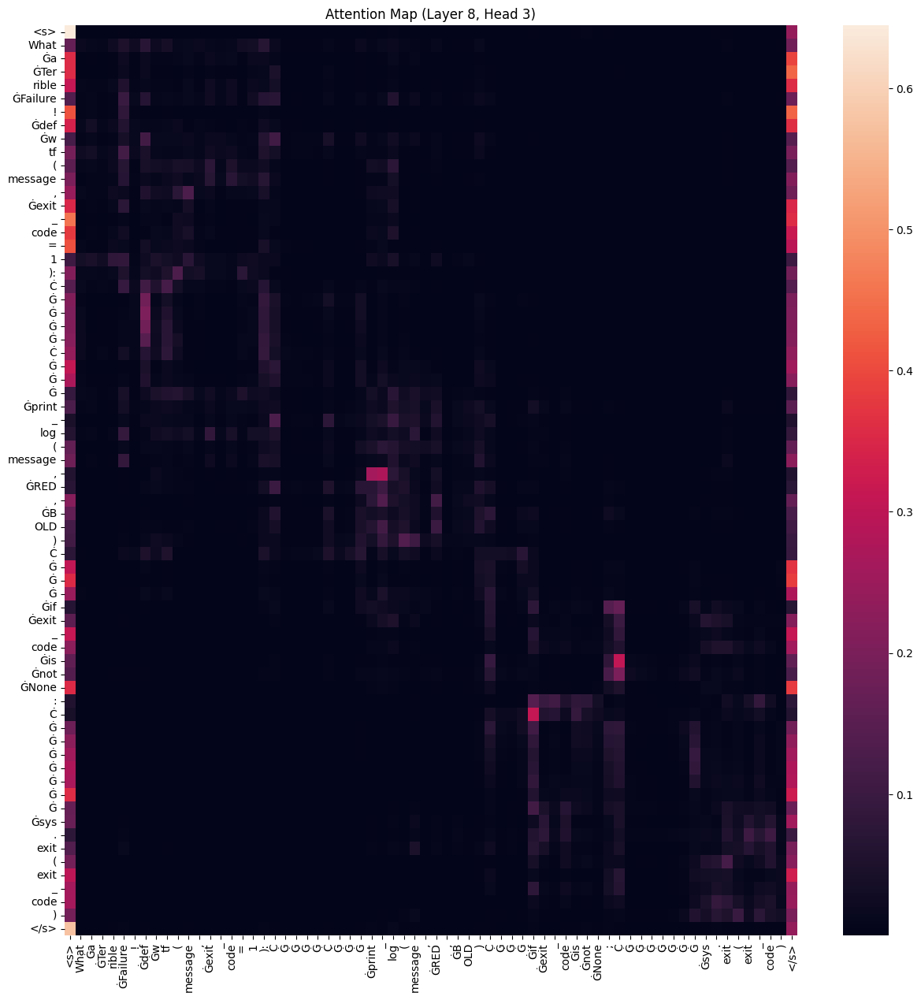

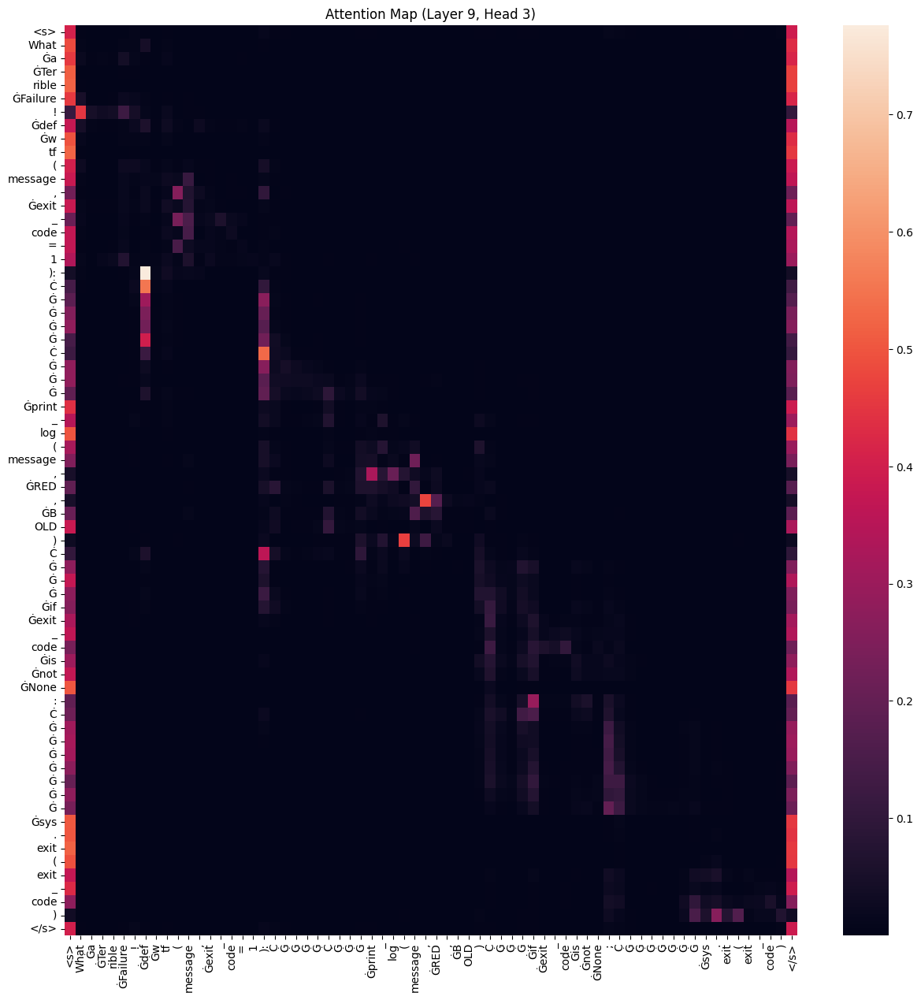

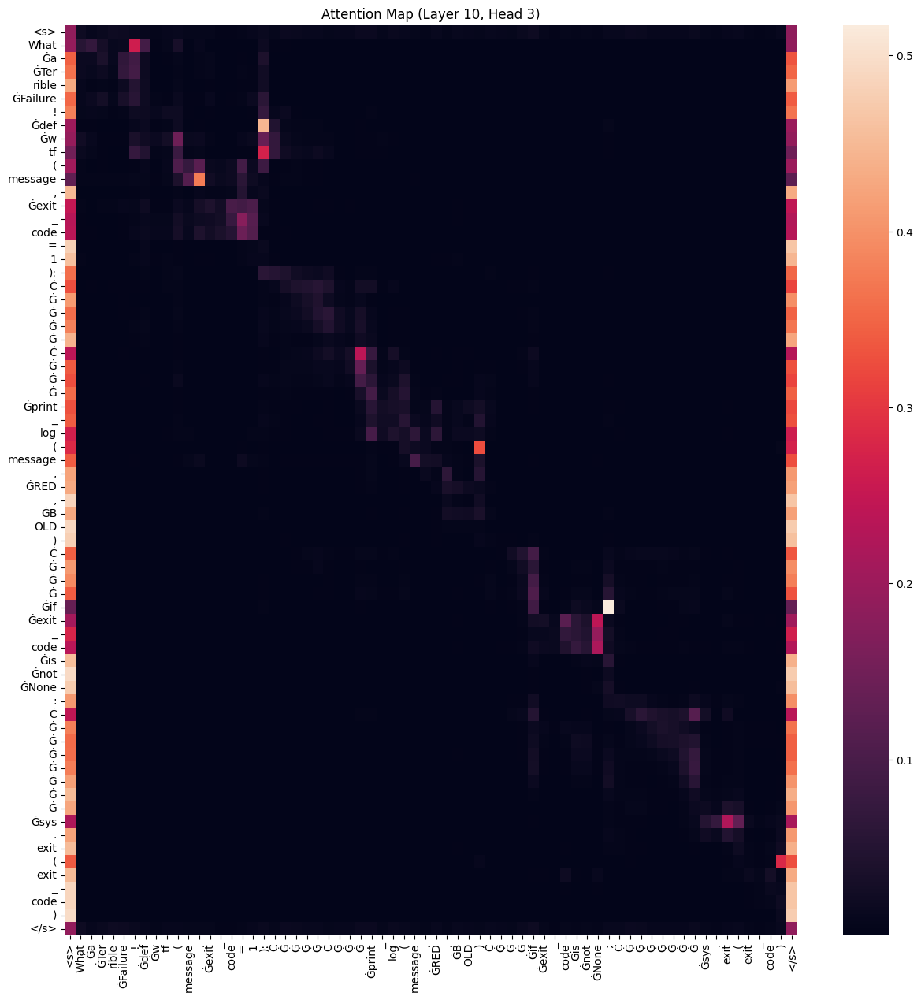

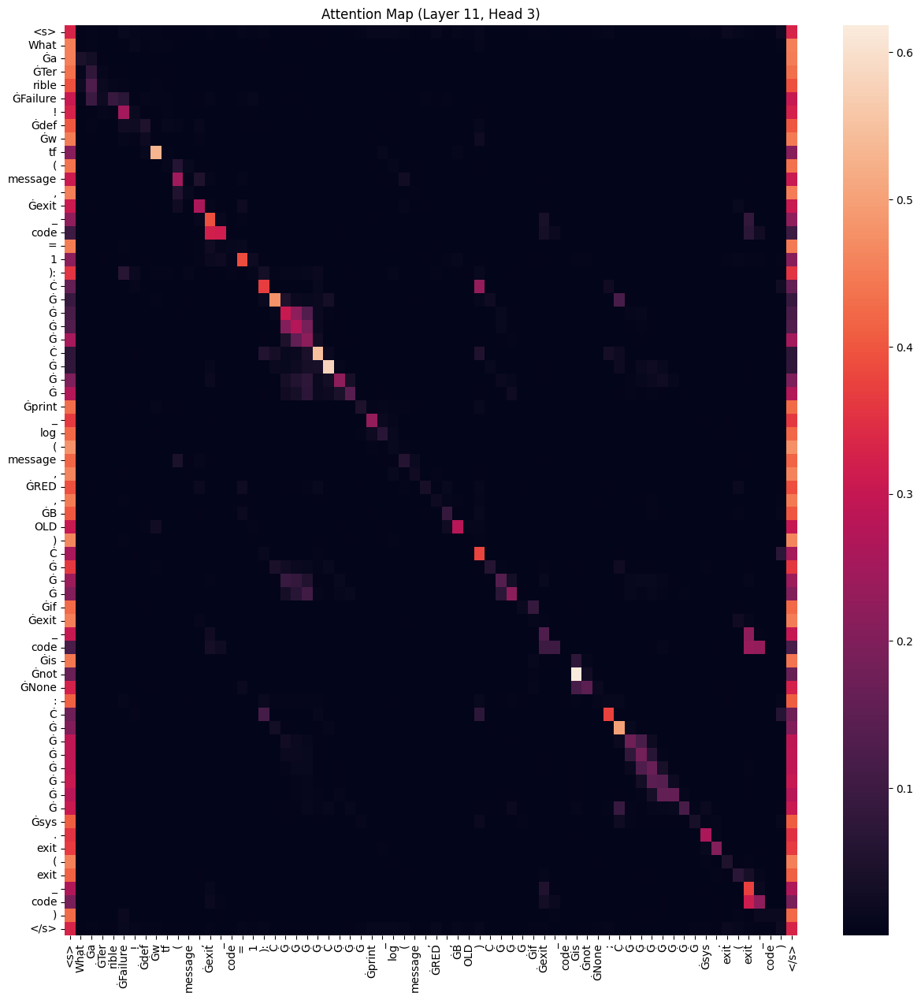

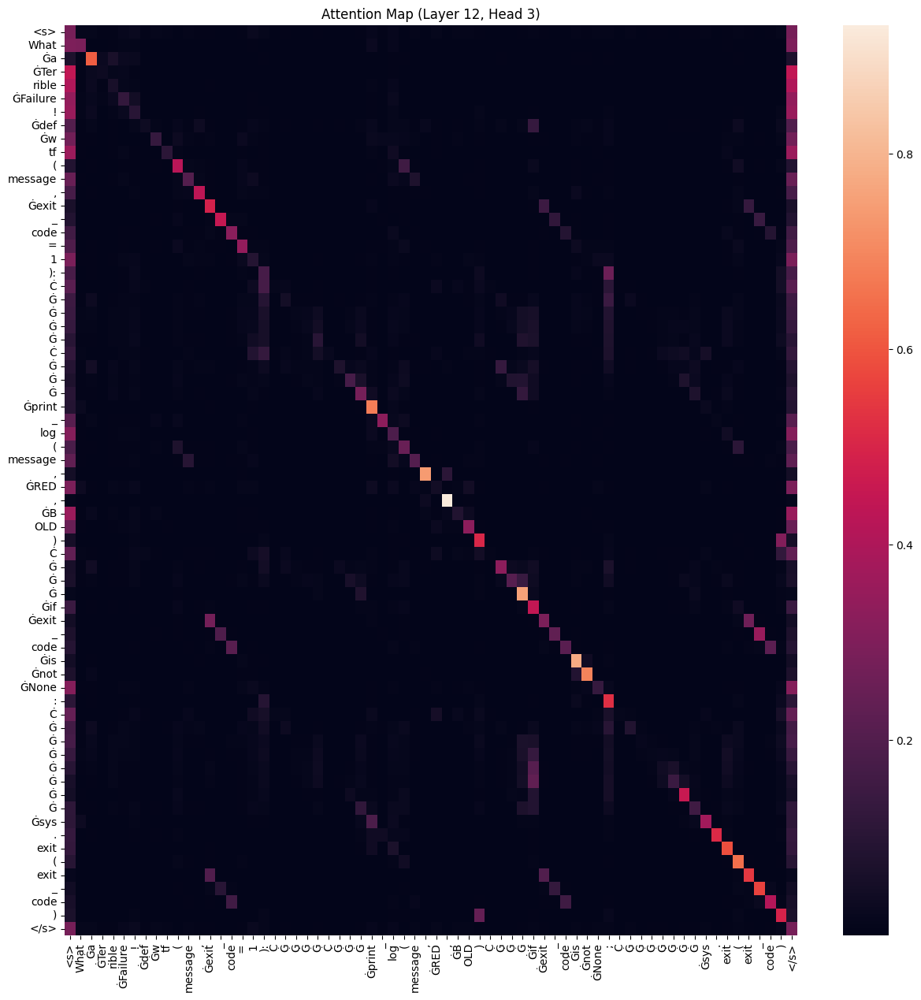

In [ ]:
import torch
# ... (その他必要なimport文)

def visualize_all_layers_head3(model, tokenizer, query, code, device):
    """
    1から12層の3番目のヘッドのAttentionを可視化する関数
    """
    combined_text = query + " " + code
    inputs = tokenizer(combined_text, return_tensors="pt", truncation=True, padding=True).to(device)

    with torch.no_grad():
        outputs = model(**inputs, output_attentions=True)

    for layer in range(1, 13):  # 1から12層をループ
        attentions = outputs.attentions[layer - 1][0, 2].cpu().numpy()  # レイヤーは0始まり、ヘッドは2 (3番目)
        combined_tokens = tokenizer.convert_ids_to_tokens(inputs["input_ids"][0])

        fig, ax = plt.subplots(figsize=(15, 15))
        sns.heatmap(attentions, xticklabels=combined_tokens, yticklabels=combined_tokens, ax=ax)
        plt.title(f"Attention Map (Layer {layer}, Head 3)")
        plt.show()

if __name__ == "__main__":
    # ... (モデル、tokenizerのロード、データセットの準備)

    # モデル1の可視化 (1から12層の3番目のヘッド)
    print(f"\n{model_name1} のAttention可視化 (1から12層の3番目のヘッド):")
    visualize_all_layers_head3(model1, tokenizer1, query_text, cleaned_code_text, device)

    # モデル2の可視化 (1から12層の3番目のヘッド)
    print(f"\n{model_name2} のAttention可視化 (1から12層の3番目のヘッド):")
    visualize_all_layers_head3(model2, tokenizer2, query_text, cleaned_code_text, device)


google/code_x_glue_ct_code_to_text データセットをロード...
使用デバイス: cuda


Some weights of the model checkpoint at microsoft/codebert-base-mlm were not used when initializing RobertaForMaskedLM: ['roberta.pooler.dense.bias', 'roberta.pooler.dense.weight']
- This IS expected if you are initializing RobertaForMaskedLM from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing RobertaForMaskedLM from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Asking to truncate to max_length but no maximum length is provided and the model has no predefined maximum length. Default to no truncation.



可視化サンプル: 47
クエリ: Exports data from a Cloud SQL instance to a Cloud Storage bucket as a SQL dump
        or CSV file.

        :param instance: Database instance ID of the Cloud SQL instance. This does not include the
            project ID.
        :type instance: str
        :param body: The request body, as described in
            https://cloud.google.com/sql/docs/mysql/admin-api/v1beta4/instances/export#request-body
        :type body: dict
        :param project_id: Project ID of the project that contains the instance. If set
            to None or missing, the default project_id from the GCP connection is used.
        :type project_id: str
        :return: None

Shuu12121/CodeMorph-BERT の結果:
正解のコード (順位: 1):
def sina_xml_to_url_list(xml_data):
    
    rawurl = []
    dom = parseString(xml_data)
    for node in dom.getElementsByTagName('durl'):
        url = node.getElementsByTagName('url')[0]
        rawurl.append(url.childNodes[0].data)
    return rawurl
不正解のコード (順位: 100):
def

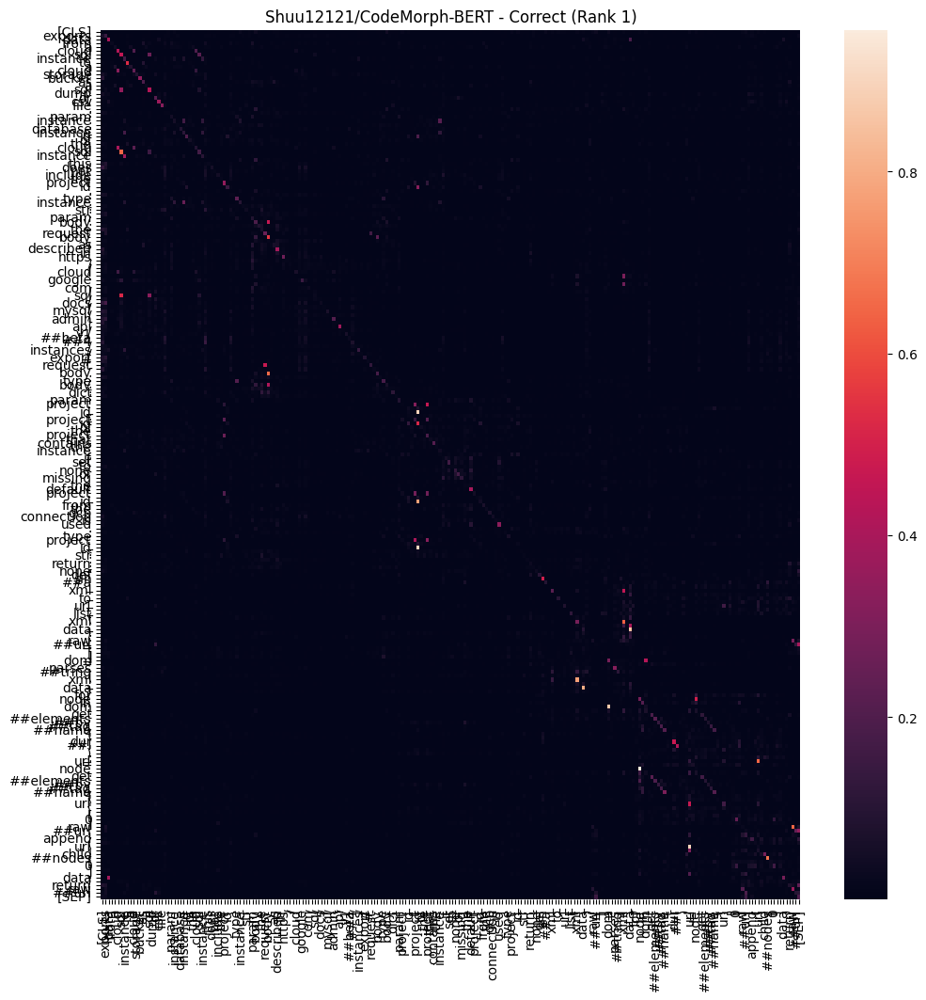


Shuu12121/CodeMorph-BERT のAttention可視化（不正解, 順位: 100）:


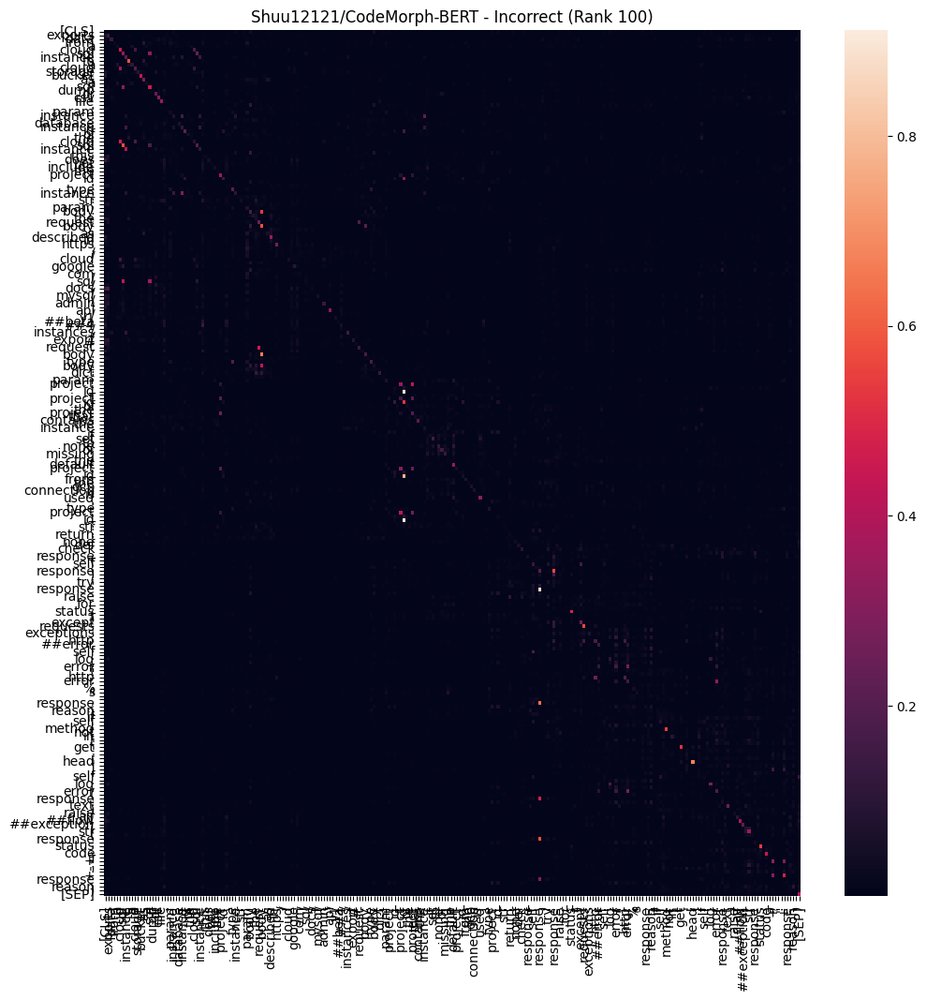


microsoft/codebert-base-mlm のAttention可視化（正解, 順位: 11）:


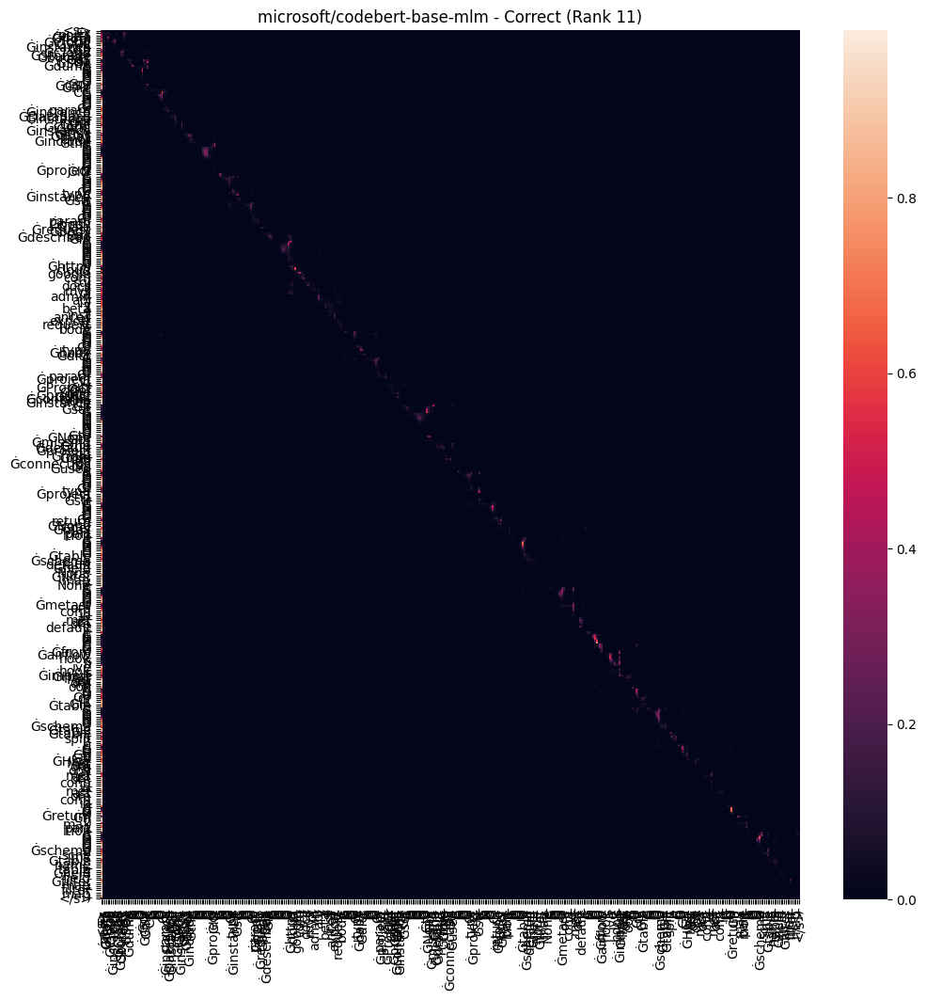


microsoft/codebert-base-mlm のAttention可視化（不正解, 順位: 100）:


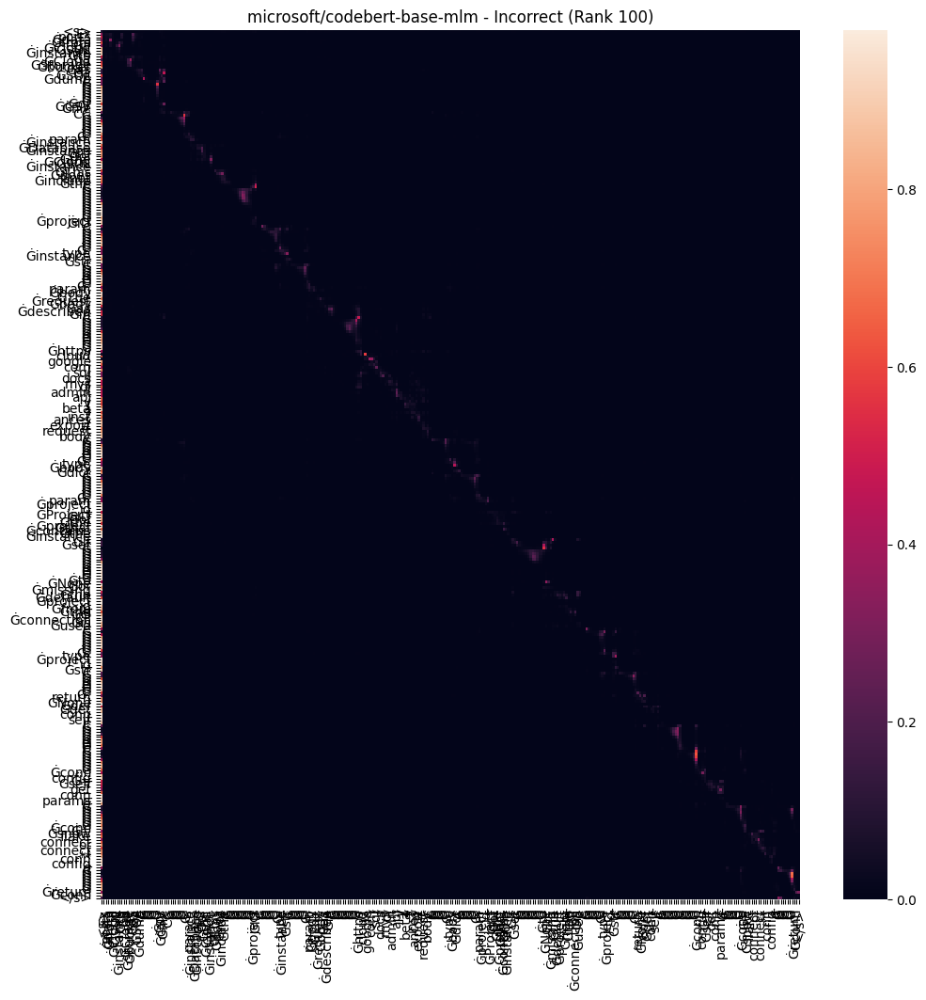

In [ ]:
import torch
import numpy as np
import re
import random
import matplotlib.pyplot as plt
import seaborn as sns
from transformers import AutoModelForMaskedLM, AutoTokenizer, RobertaForMaskedLM, BertForMaskedLM
from datasets import load_dataset
from sklearn.metrics.pairwise import cosine_similarity

def remove_multiline_strings(code):
    pattern = r'("""(.*?)"""|\'\'\'(.*?)\'\'\')'
    return re.sub(pattern, '', code, flags=re.DOTALL)

def get_cls_embedding(model, tokenizer, text, device, max_length=256):
    inputs = tokenizer(text, return_tensors="pt", truncation=True, max_length=max_length)
    inputs = {k: v.to(device) for k, v in inputs.items()}
    if isinstance(model, BertForMaskedLM):
        outputs = model.bert(**inputs)
    elif isinstance(model, RobertaForMaskedLM):
        outputs = model.roberta(**inputs)
    else:
        raise ValueError("Model must be BertForMaskedLM or RobertaForMaskedLM.")
    cls_embedding = outputs.last_hidden_state[:, 0, :]
    return cls_embedding.detach().cpu().numpy()

def evaluate_code_search(model, tokenizer, dataset, device, max_examples=100, pool_size=100):
    num_examples = min(len(dataset), max_examples)
    all_codes = [remove_multiline_strings(dataset[i]["code"]) for i in range(len(dataset))]
    queries = [dataset[i]["docstring"] for i in range(num_examples)]

    all_code_embeddings = np.concatenate([get_cls_embedding(model, tokenizer, code, device) for code in all_codes[:num_examples]], axis=0)

    sim_matrices = []
    for i in range(num_examples):
        query_embedding = get_cls_embedding(model, tokenizer, queries[i], device).reshape(1, -1)
        candidate_indices = [i] + random.sample([j for j in range(num_examples) if j != i], pool_size - 1)
        candidate_pool_embeddings = all_code_embeddings[candidate_indices]
        sims = cosine_similarity(query_embedding, candidate_pool_embeddings)[0]
        sim_matrices.append(sims)

    sim_matrix = np.array(sim_matrices)
    return sim_matrix, all_codes

def visualize_attention(model, tokenizer, query, code, device, layer=8, head=0, title="Attention Map"):
    combined_text = query + " " + code
    inputs = tokenizer(combined_text, return_tensors="pt", truncation=True, padding=True).to(device)

    with torch.no_grad():
        outputs = model(**inputs, output_attentions=True)

    attentions = outputs.attentions[layer][0, head].cpu().numpy()
    combined_tokens = tokenizer.convert_ids_to_tokens(inputs["input_ids"][0])

    #filtered_tokens = [t for t in combined_tokens if re.match(r'^[a-zA-Z0-9_]+$', t)]
    filtered_tokens = combined_tokens

    fig, ax = plt.subplots(figsize=(12, 12))
    sns.heatmap(attentions[:len(filtered_tokens), :len(filtered_tokens)], xticklabels=filtered_tokens, yticklabels=filtered_tokens, ax=ax)
    plt.title(title)
    plt.show()

if __name__ == "__main__":
    print("\ngoogle/code_x_glue_ct_code_to_text データセットをロード...")
    tc_dataset = load_dataset("google/code_x_glue_ct_code_to_text", "python", split="test", trust_remote_code=True)
    subset_tc = tc_dataset.select(range(100))
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    print(f"使用デバイス: {device}")

    model_name1 = "Shuu12121/CodeMorph-BERT"
    tokenizer1 = AutoTokenizer.from_pretrained(model_name1)
    model1 = AutoModelForMaskedLM.from_pretrained(model_name1).to(device)

    model_name2 = "microsoft/codebert-base-mlm"
    tokenizer2 = AutoTokenizer.from_pretrained(model_name2)
    model2 = AutoModelForMaskedLM.from_pretrained(model_name2).to(device)

    sim_matrix_tc1, all_codes1 = evaluate_code_search(model1, tokenizer1, subset_tc, device, max_examples=100, pool_size=100)
    sim_matrix_tc2, all_codes2 = evaluate_code_search(model2, tokenizer2, subset_tc, device, max_examples=100, pool_size=100)

    example_index = 47  # 可視化するサンプル
    query_text = subset_tc[example_index]["docstring"]

    # モデル1の処理
    ranked_indices1 = np.argsort(-sim_matrix_tc1[example_index])
    correct_code_text1 = all_codes1[ranked_indices1[0]]
    incorrect_code_text1 = all_codes1[ranked_indices1[-1]]
    correct_rank1 = np.where(ranked_indices1 == 0)[0][0] + 1  # 1-based index
    incorrect_rank1 = np.where(ranked_indices1 == ranked_indices1[-1])[0][0] + 1

    # モデル2の処理
    ranked_indices2 = np.argsort(-sim_matrix_tc2[example_index])
    correct_code_text2 = all_codes2[ranked_indices2[0]]
    incorrect_code_text2 = all_codes2[ranked_indices2[-1]]
    correct_rank2 = np.where(ranked_indices2 == 0)[0][0] + 1
    incorrect_rank2 = np.where(ranked_indices2 == ranked_indices2[-1])[0][0] + 1


    print(f"\n可視化サンプル: {example_index}")
    print(f"クエリ: {query_text}")

    print(f"\n{model_name1} の結果:")
    print(f"正解のコード (順位: {correct_rank1}):\n{correct_code_text1}")
    print(f"不正解のコード (順位: {incorrect_rank1}):\n{incorrect_code_text1}")

    print(f"\n{model_name2} の結果:")
    print(f"正解のコード (順位: {correct_rank2}):\n{correct_code_text2}")
    print(f"不正解のコード (順位: {incorrect_rank2}):\n{incorrect_code_text2}")


    # モデル1のAttention可視化
    print(f"\n{model_name1} のAttention可視化（正解, 順位: {correct_rank1}）:")
    visualize_attention(model1, tokenizer1, query_text, correct_code_text1, device, layer=8, head=3, title=f"{model_name1} - Correct (Rank {correct_rank1})")

    print(f"\n{model_name1} のAttention可視化（不正解, 順位: {incorrect_rank1}）:")
    visualize_attention(model1, tokenizer1, query_text, incorrect_code_text1, device, layer=8, head=3, title=f"{model_name1} - Incorrect (Rank {incorrect_rank1})")

    # モデル2のAttention可視化
    print(f"\n{model_name2} のAttention可視化（正解, 順位: {correct_rank2}）:")
    visualize_attention(model2, tokenizer2, query_text, correct_code_text2, device, layer=8, head=3, title=f"{model_name2} - Correct (Rank {correct_rank2})")

    print(f"\n{model_name2} のAttention可視化（不正解, 順位: {incorrect_rank2}）:")
    visualize_attention(model2, tokenizer2, query_text, incorrect_code_text2, device, layer=8, head=3, title=f"{model_name2} - Incorrect (Rank {incorrect_rank2})")



google/code_x_glue_ct_code_to_text データセットをロード...
使用デバイス: cuda


Some weights of the model checkpoint at microsoft/codebert-base-mlm were not used when initializing RobertaForMaskedLM: ['roberta.pooler.dense.bias', 'roberta.pooler.dense.weight']
- This IS expected if you are initializing RobertaForMaskedLM from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing RobertaForMaskedLM from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).



可視化サンプル: 32
クエリ: Uploads the file to Google cloud storage

Shuu12121/CodeMorph-BERT の結果:
モデルが予測した1位のコード (順位: 1):
def sina_xml_to_url_list(xml_data):
    
    rawurl = []
    dom = parseString(xml_data)
    for node in dom.getElementsByTagName('durl'):
        url = node.getElementsByTagName('url')[0]
        rawurl.append(url.childNodes[0].data)
    return rawurl
モデルが予測した最下位のコード (順位: 100):
def _get_aws_credentials(self):
        
        if self.snowflake_conn_id:
            connection_object = self.get_connection(self.snowflake_conn_id)
            if 'aws_secret_access_key' in connection_object.extra_dejson:
                aws_access_key_id = connection_object.extra_dejson.get(
                    'aws_access_key_id')
                aws_secret_access_key = connection_object.extra_dejson.get(
                    'aws_secret_access_key')
        return aws_access_key_id, aws_secret_access_key

microsoft/codebert-base-mlm の結果:
モデルが予測した1位のコード (順位: 29):
def create_session():
    
    

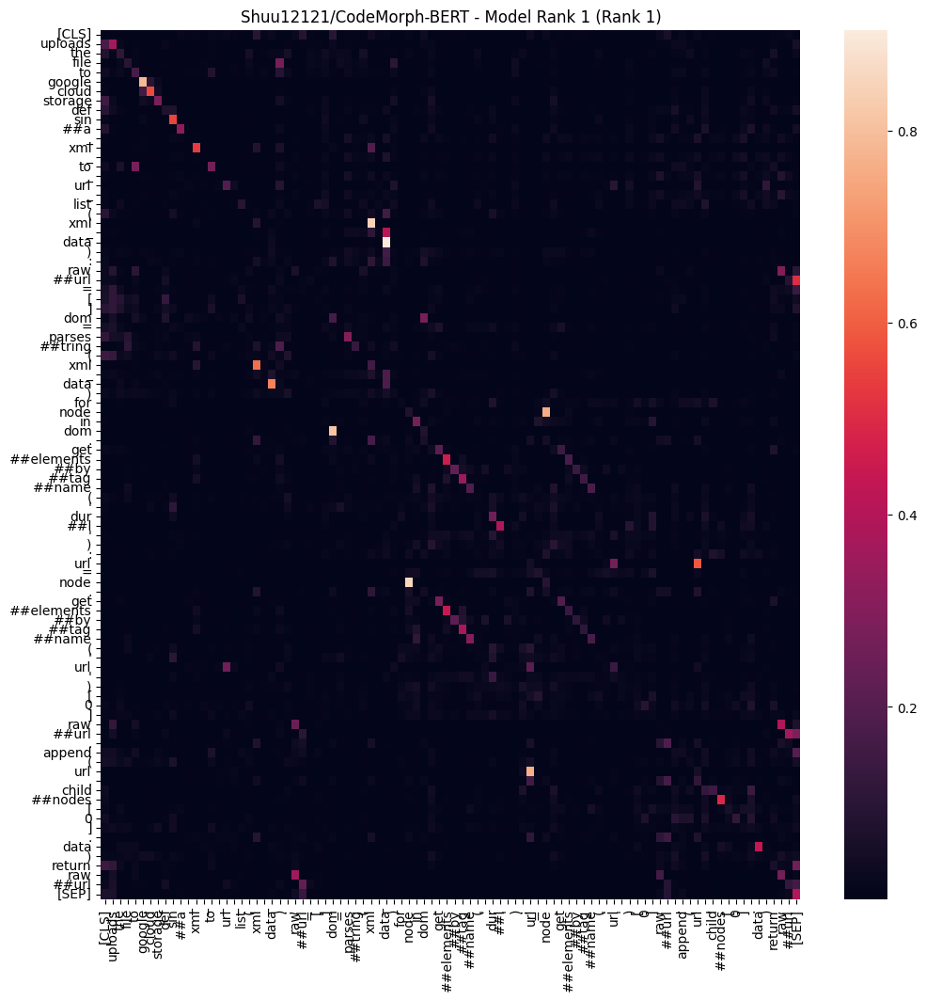


Shuu12121/CodeMorph-BERT のAttention可視化（モデル予測最下位, 順位: 100）:


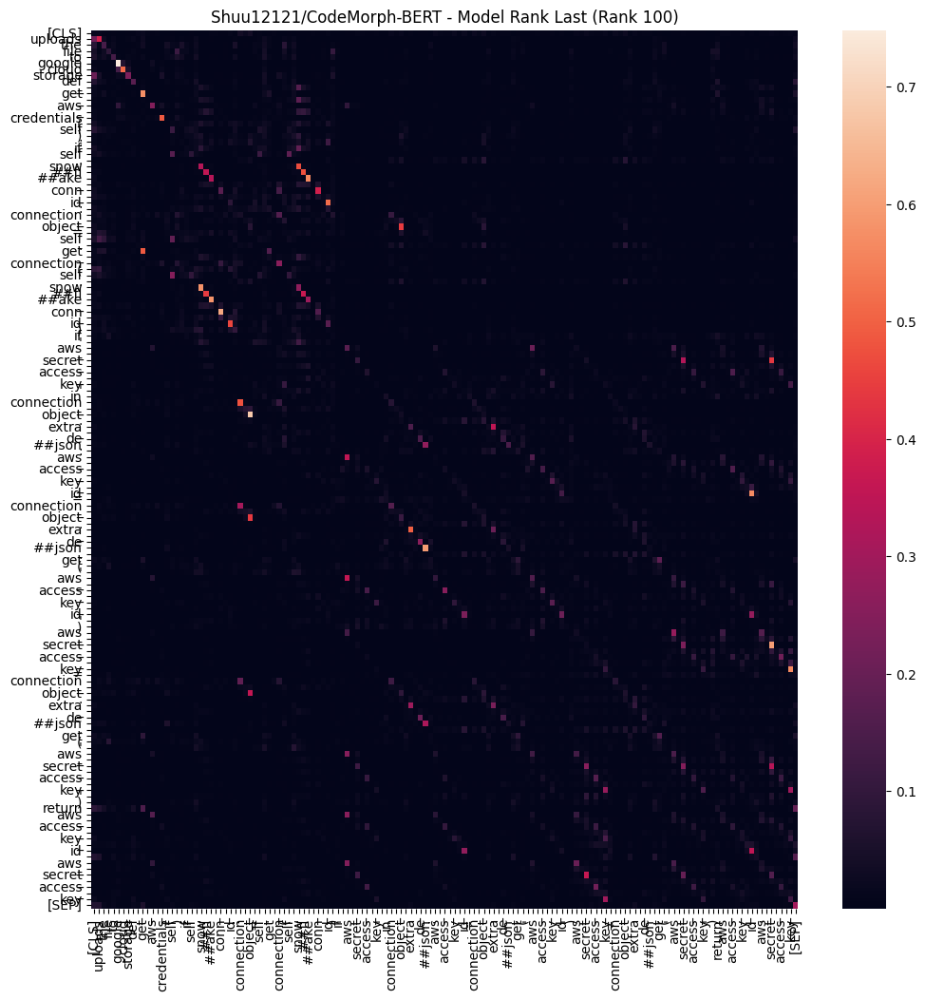


Shuu12121/CodeMorph-BERT のAttention可視化（データセット正解コード）:


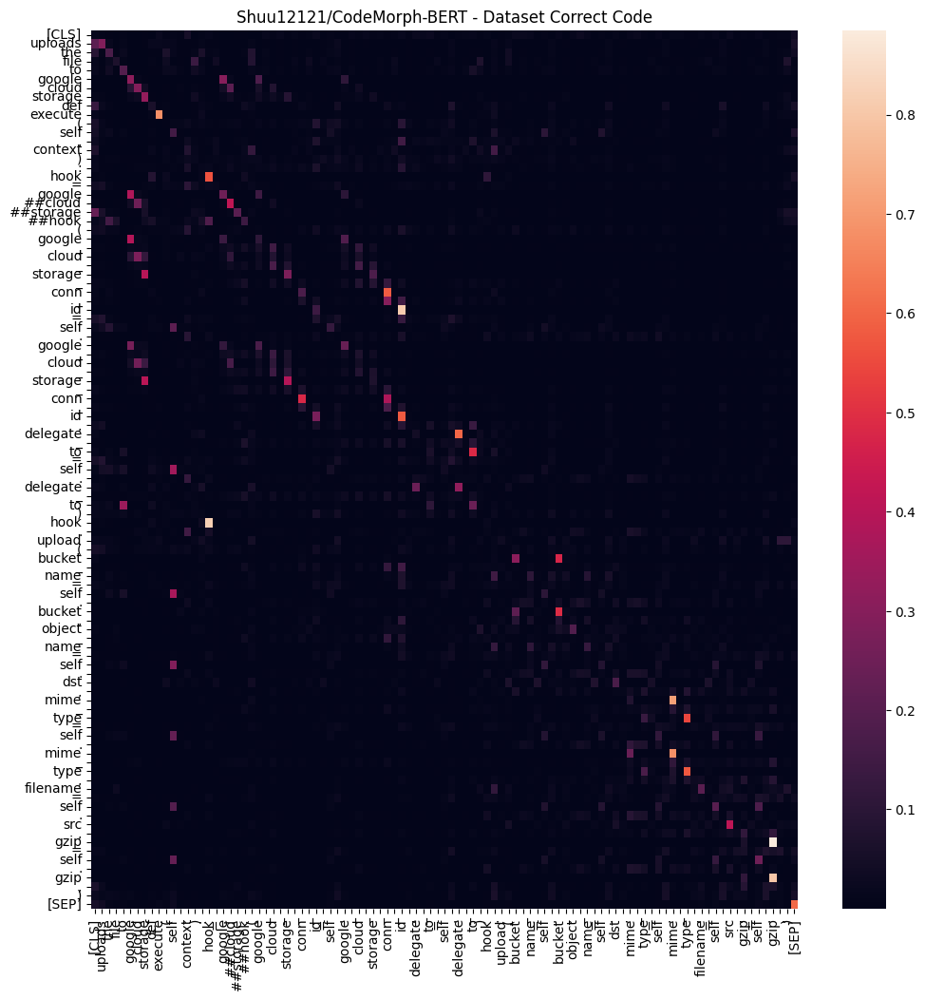


microsoft/codebert-base-mlm のAttention可視化（モデル予測1位, 順位: 29）:


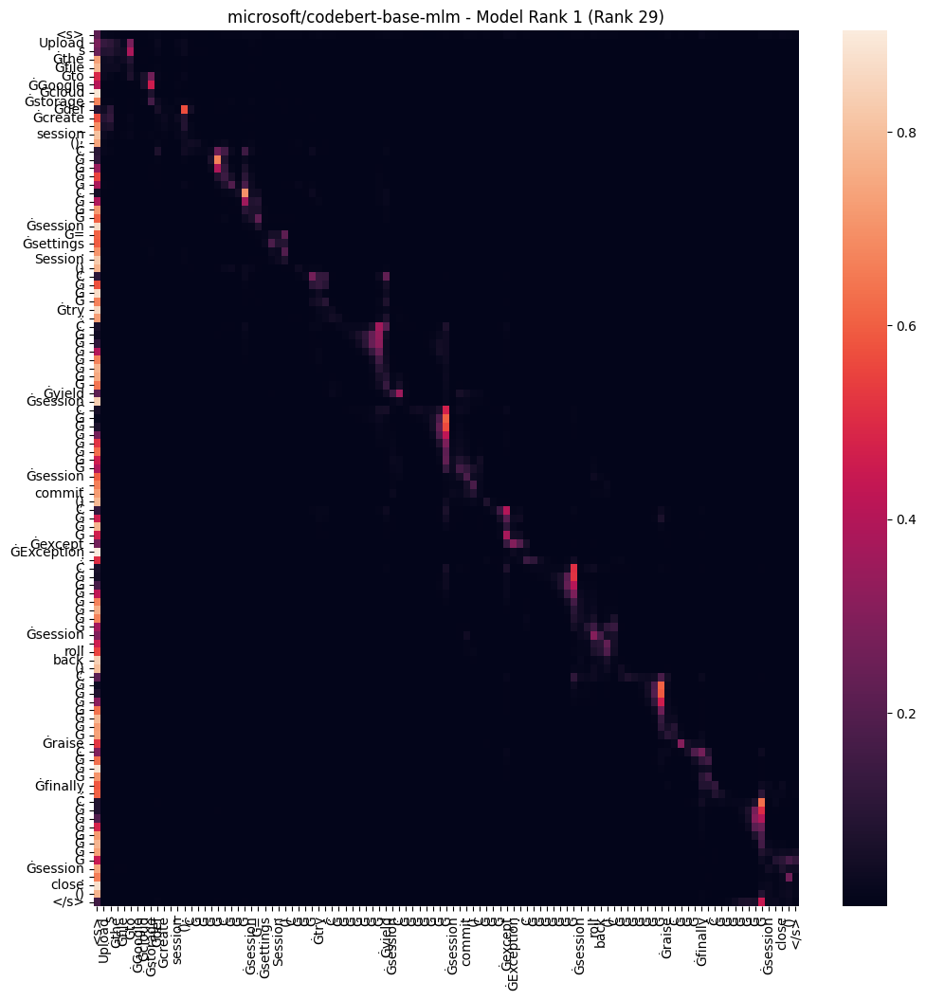


microsoft/codebert-base-mlm のAttention可視化（モデル予測最下位, 順位: 100）:


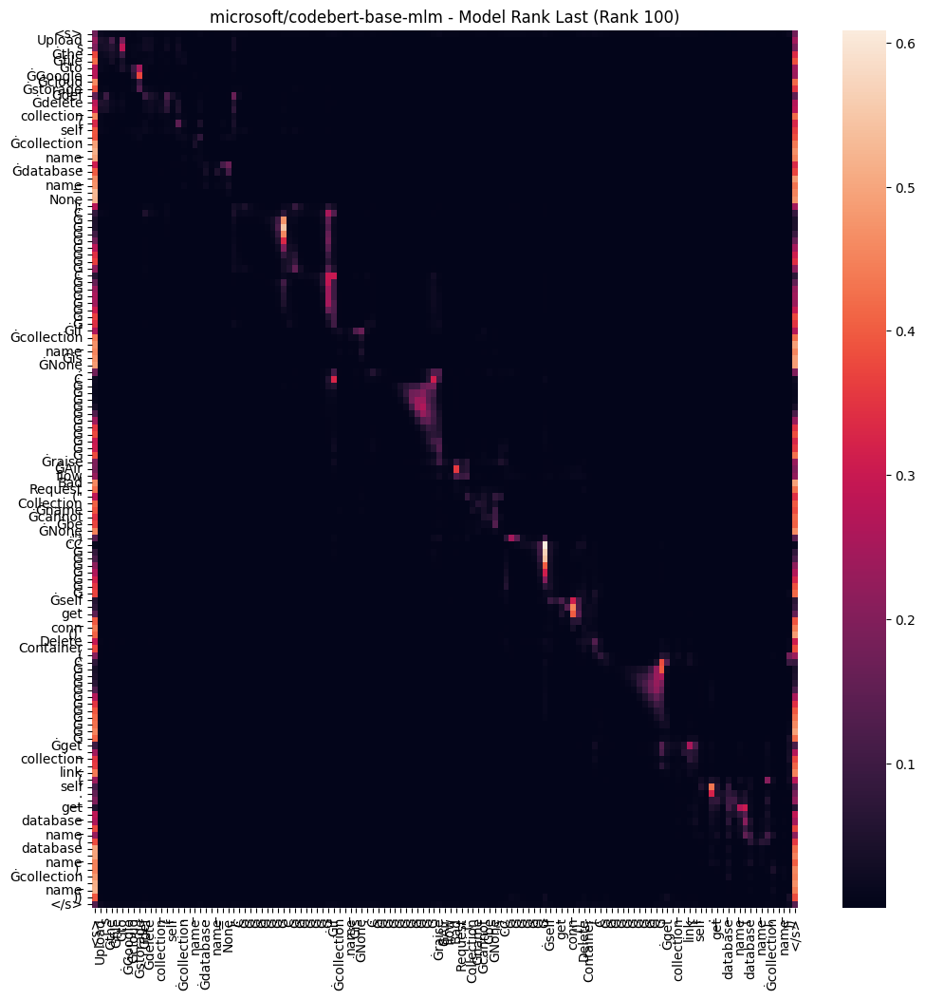


microsoft/codebert-base-mlm のAttention可視化（データセット正解コード）:


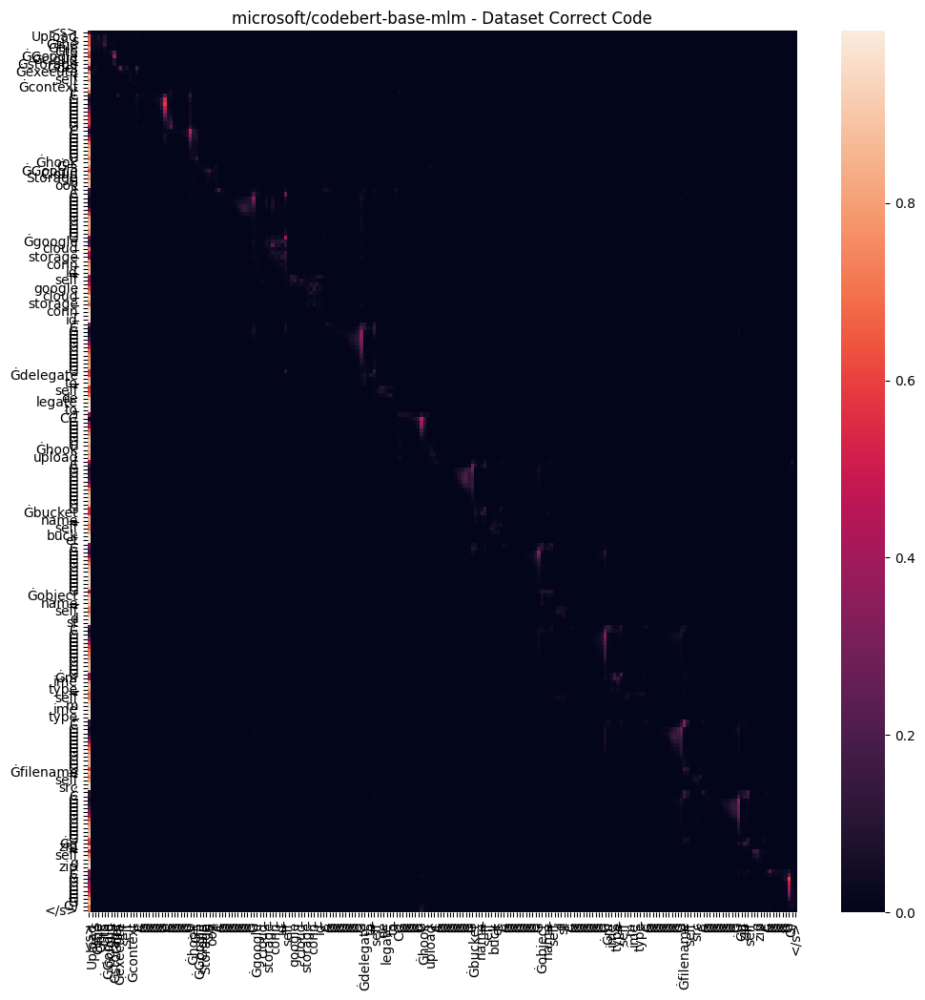

In [ ]:
import torch
import numpy as np
import re
import random
import matplotlib.pyplot as plt
import seaborn as sns
from transformers import AutoModelForMaskedLM, AutoTokenizer, RobertaForMaskedLM, BertForMaskedLM
from datasets import load_dataset
from sklearn.metrics.pairwise import cosine_similarity

def remove_multiline_strings(code):
    pattern = r'("""(.*?)"""|\'\'\'(.*?)\'\'\')'
    return re.sub(pattern, '', code, flags=re.DOTALL)

def get_cls_embedding(model, tokenizer, text, device, max_length=256):
    inputs = tokenizer(text, return_tensors="pt", truncation=True, max_length=max_length)
    inputs = {k: v.to(device) for k, v in inputs.items()}
    if isinstance(model, BertForMaskedLM):
        outputs = model.bert(**inputs)
    elif isinstance(model, RobertaForMaskedLM):
        outputs = model.roberta(**inputs)
    else:
        raise ValueError("Model must be BertForMaskedLM or RobertaForMaskedLM.")
    cls_embedding = outputs.last_hidden_state[:, 0, :]
    return cls_embedding.detach().cpu().numpy()

def evaluate_code_search(model, tokenizer, dataset, device, max_examples=100, pool_size=100):
    num_examples = min(len(dataset), max_examples)
    all_codes = [remove_multiline_strings(dataset[i]["code"]) for i in range(len(dataset))]
    queries = [dataset[i]["docstring"] for i in range(num_examples)]

    all_code_embeddings = np.concatenate([get_cls_embedding(model, tokenizer, code, device) for code in all_codes[:num_examples]], axis=0)

    sim_matrices = []
    for i in range(num_examples):
        query_embedding = get_cls_embedding(model, tokenizer, queries[i], device).reshape(1, -1)
        candidate_indices = [i] + random.sample([j for j in range(num_examples) if j != i], pool_size - 1)
        candidate_pool_embeddings = all_code_embeddings[candidate_indices]
        sims = cosine_similarity(query_embedding, candidate_pool_embeddings)[0]
        sim_matrices.append(sims)

    sim_matrix = np.array(sim_matrices)
    return sim_matrix, all_codes

def visualize_attention(model, tokenizer, query, code, device, layer=8, head=0, title="Attention Map"):
    combined_text = query + " " + code
    max_length_raw = tokenizer.model_max_length # 一旦元の値を取得
    max_length = max_length_raw if max_length_raw is not None else 512
    max_length = min(max_length, 512) # max_length が大きすぎる場合に 1024 でクランプ
    inputs = tokenizer(combined_text, return_tensors="pt", truncation=True, max_length=max_length, padding=True).to(device)

    with torch.no_grad():
        outputs = model(**inputs, output_attentions=True)

    attentions = outputs.attentions[layer][0, head].cpu().numpy()
    combined_tokens = tokenizer.convert_ids_to_tokens(inputs["input_ids"][0])

    #filtered_tokens = [t for t in combined_tokens if re.match(r'^[a-zA-Z0-9_]+$', t)]
    filtered_tokens = combined_tokens

    fig, ax = plt.subplots(figsize=(12, 12))
    sns.heatmap(attentions[:len(filtered_tokens), :len(filtered_tokens)], xticklabels=filtered_tokens, yticklabels=filtered_tokens, ax=ax)
    plt.title(title)
    plt.show()

if __name__ == "__main__":
    print("\ngoogle/code_x_glue_ct_code_to_text データセットをロード...")
    tc_dataset = load_dataset("google/code_x_glue_ct_code_to_text", "python", split="test", trust_remote_code=True)
    subset_tc = tc_dataset.select(range(100))
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    print(f"使用デバイス: {device}")

    model_name1 = "Shuu12121/CodeMorph-BERT"
    tokenizer1 = AutoTokenizer.from_pretrained(model_name1)
    model1 = AutoModelForMaskedLM.from_pretrained(model_name1).to(device)

    model_name2 = "microsoft/codebert-base-mlm"
    tokenizer2 = AutoTokenizer.from_pretrained(model_name2)
    model2 = AutoModelForMaskedLM.from_pretrained(model_name2).to(device)

    sim_matrix_tc1, all_codes1 = evaluate_code_search(model1, tokenizer1, subset_tc, device, max_examples=100, pool_size=100)
    sim_matrix_tc2, all_codes2 = evaluate_code_search(model2, tokenizer2, subset_tc, device, max_examples=100, pool_size=100)

    example_index = 32  # 可視化するサンプル
    query_text = subset_tc[example_index]["docstring"]
    true_code_text = remove_multiline_strings(subset_tc[example_index]["code"]) # Get true code

    # モデル1の処理
    ranked_indices1 = np.argsort(-sim_matrix_tc1[example_index])
    correct_code_text1 = all_codes1[ranked_indices1[0]]
    incorrect_code_text1 = all_codes1[ranked_indices1[-1]]
    correct_rank1 = np.where(ranked_indices1 == 0)[0][0] + 1  # 1-based index
    incorrect_rank1 = np.where(ranked_indices1 == ranked_indices1[-1])[0][0] + 1

    # モデル2の処理
    ranked_indices2 = np.argsort(-sim_matrix_tc2[example_index])
    correct_code_text2 = all_codes2[ranked_indices2[0]]
    incorrect_code_text2 = all_codes2[ranked_indices2[-1]]
    correct_rank2 = np.where(ranked_indices2 == 0)[0][0] + 1
    incorrect_rank2 = np.where(ranked_indices2 == ranked_indices2[-1])[0][0] + 1


    print(f"\n可視化サンプル: {example_index}")
    print(f"クエリ: {query_text}")

    print(f"\n{model_name1} の結果:")
    print(f"モデルが予測した1位のコード (順位: {correct_rank1}):\n{correct_code_text1}")
    print(f"モデルが予測した最下位のコード (順位: {incorrect_rank1}):\n{incorrect_code_text1}")

    print(f"\n{model_name2} の結果:")
    print(f"モデルが予測した1位のコード (順位: {correct_rank2}):\n{correct_code_text2}")
    print(f"モデルが予測した最下位のコード (順位: {incorrect_rank2}):\n{incorrect_code_text2}")

    print(f"\nデータセットの正解コード:") # Print true code
    print(f"{true_code_text}")


    # モデル1のAttention可視化
    print(f"\n{model_name1} のAttention可視化（モデル予測1位, 順位: {correct_rank1}）:")
    visualize_attention(model1, tokenizer1, query_text, correct_code_text1, device, layer=8, head=3, title=f"{model_name1} - Model Rank 1 (Rank {correct_rank1})")

    print(f"\n{model_name1} のAttention可視化（モデル予測最下位, 順位: {incorrect_rank1}）:")
    visualize_attention(model1, tokenizer1, query_text, incorrect_code_text1, device, layer=8, head=3, title=f"{model_name1} - Model Rank Last (Rank {incorrect_rank1})")

    print(f"\n{model_name1} のAttention可視化（データセット正解コード）:") # Visualize true code attention
    visualize_attention(model1, tokenizer1, query_text, true_code_text, device, layer=8, head=3, title=f"{model_name1} - Dataset Correct Code")


    # モデル2のAttention可視化
    print(f"\n{model_name2} のAttention可視化（モデル予測1位, 順位: {correct_rank2}）:")
    visualize_attention(model2, tokenizer2, query_text, correct_code_text2, device, layer=8, head=3, title=f"{model_name2} - Model Rank 1 (Rank {correct_rank2})")

    print(f"\n{model_name2} のAttention可視化（モデル予測最下位, 順位: {incorrect_rank2}）:")
    visualize_attention(model2, tokenizer2, query_text, incorrect_code_text2, device, layer=8, head=3, title=f"{model_name2} - Model Rank Last (Rank {incorrect_rank2})")

    print(f"\n{model_name2} のAttention可視化（データセット正解コード）:") # Visualize true code attention
    visualize_attention(model2, tokenizer2, query_text, true_code_text, device, layer=8, head=3, title=f"{model_name2} - Dataset Correct Code")

Asking to truncate to max_length but no maximum length is provided and the model has no predefined maximum length. Default to no truncation.



Shuu12121/CodeMorph-BERT のAttention可視化 (1から12層の3番目のヘッド):


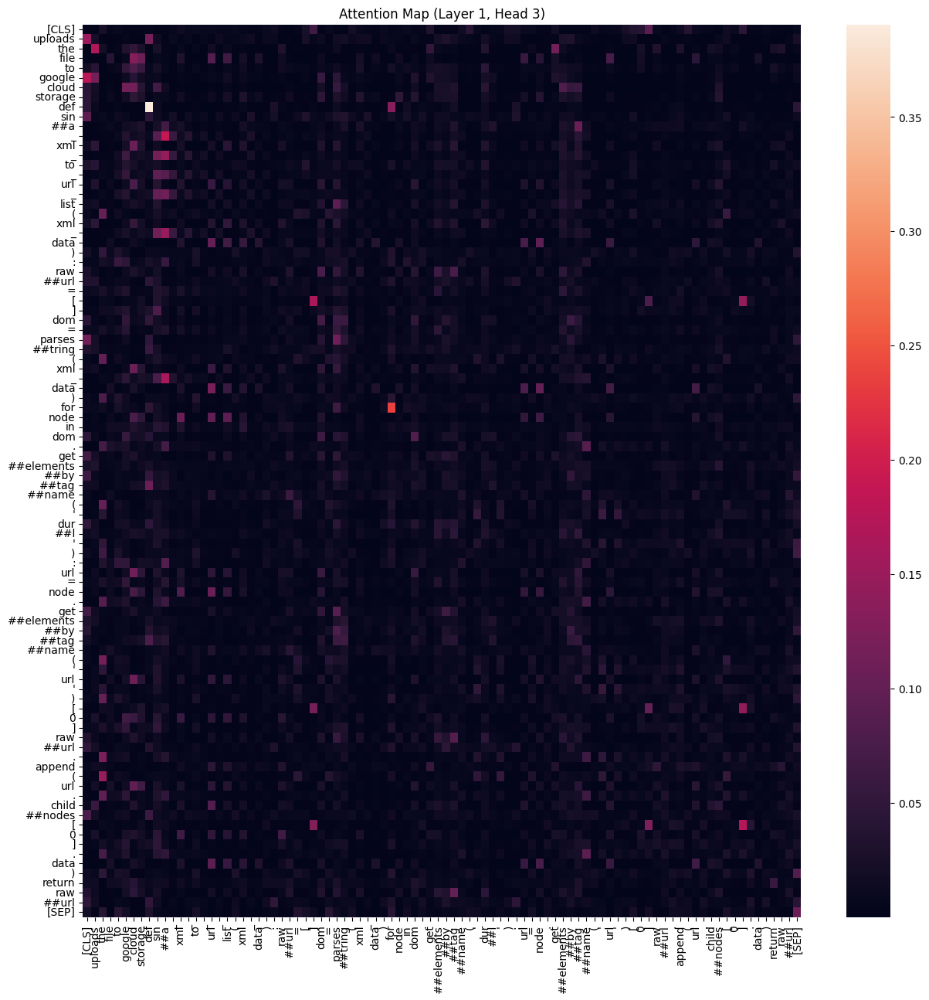

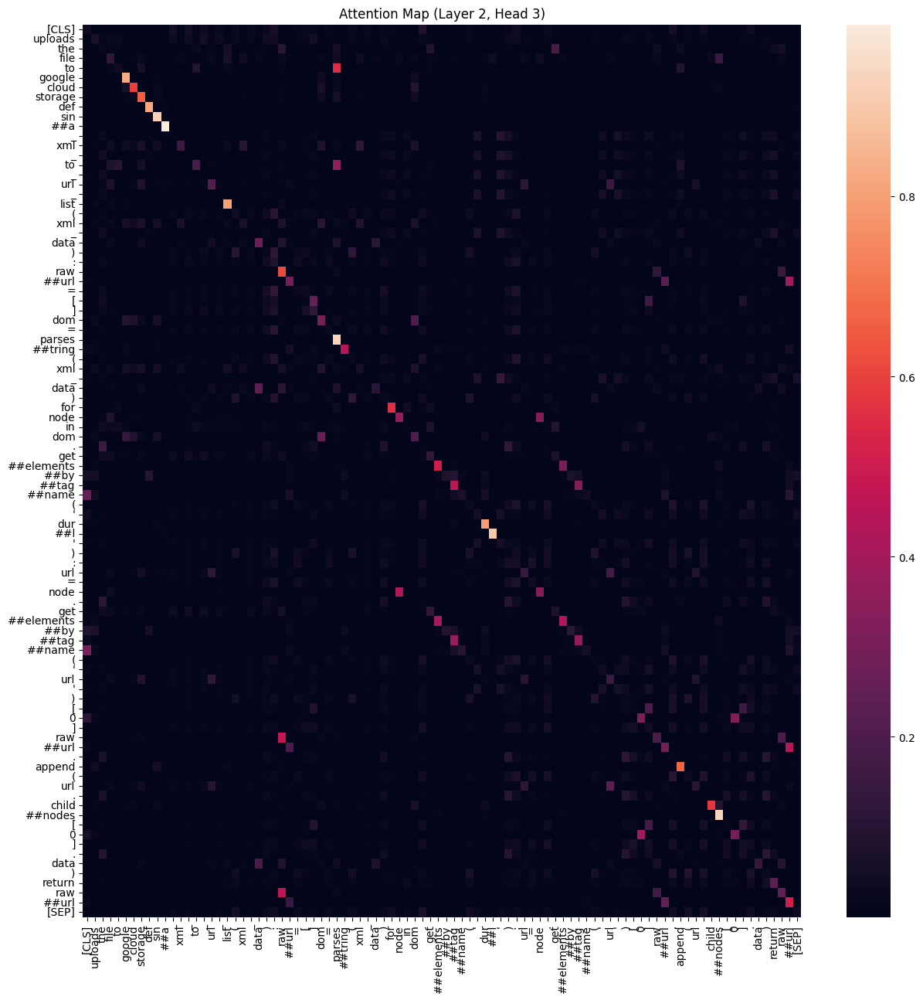

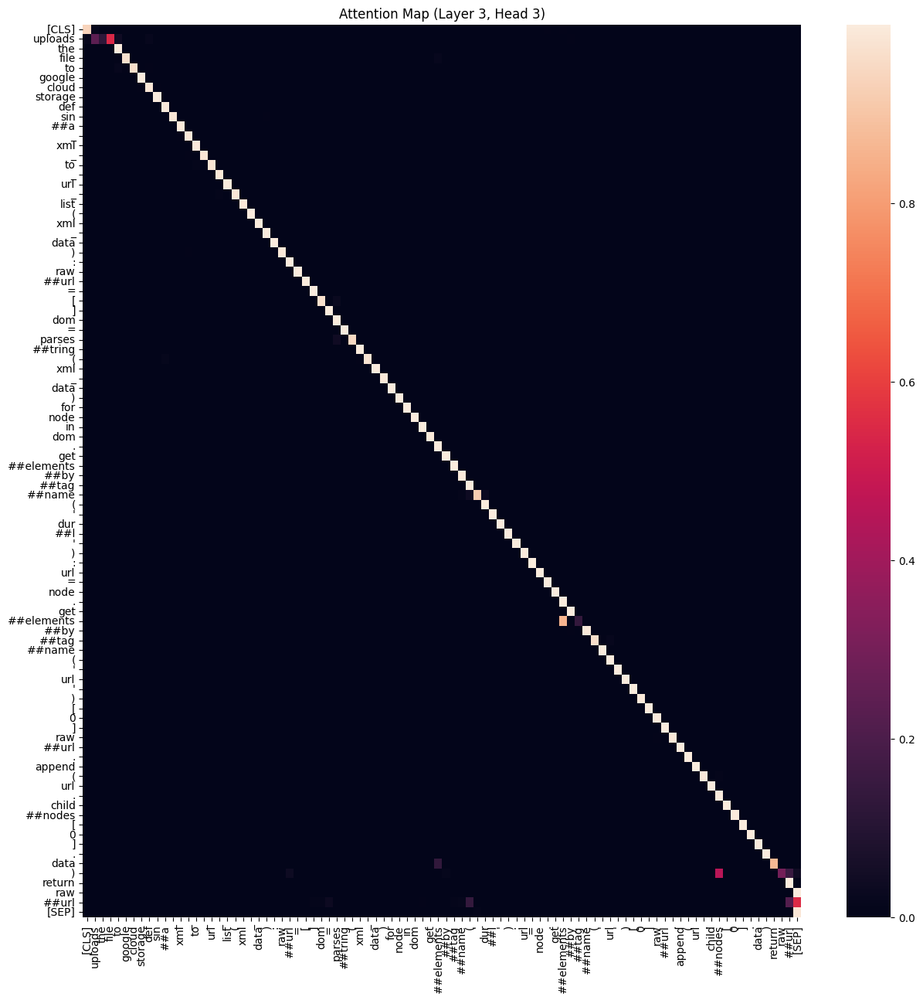

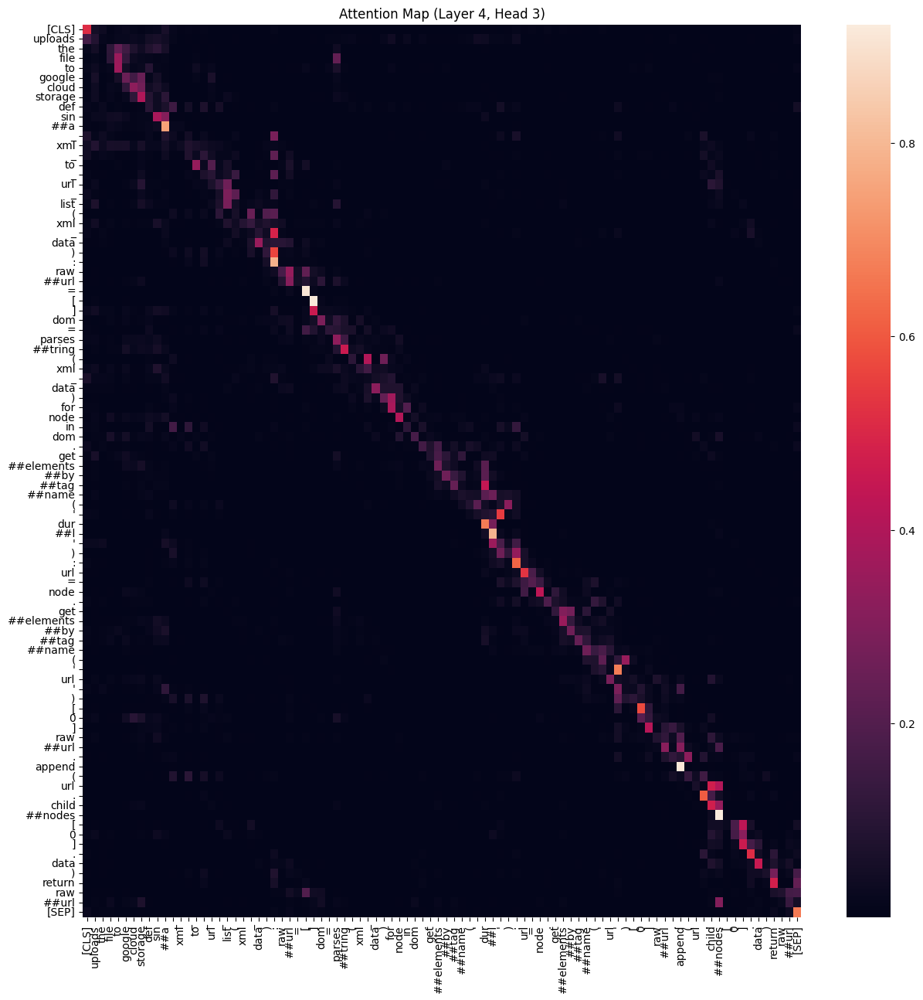

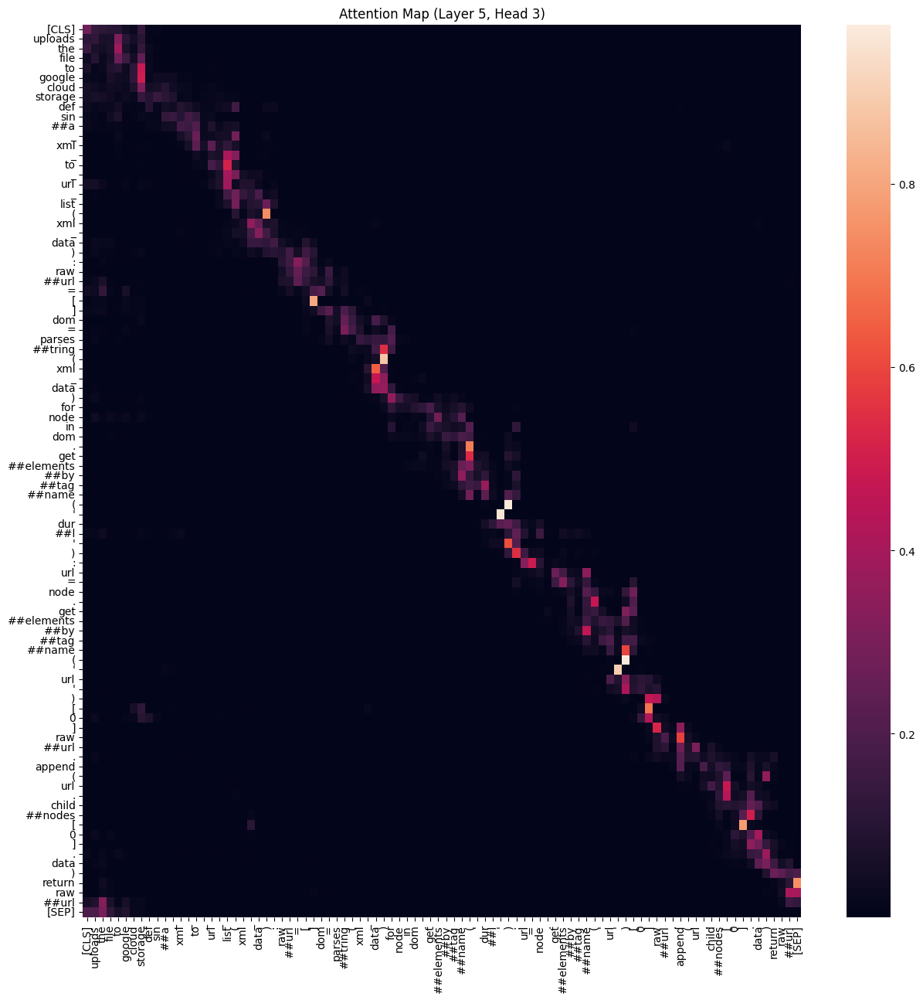

...

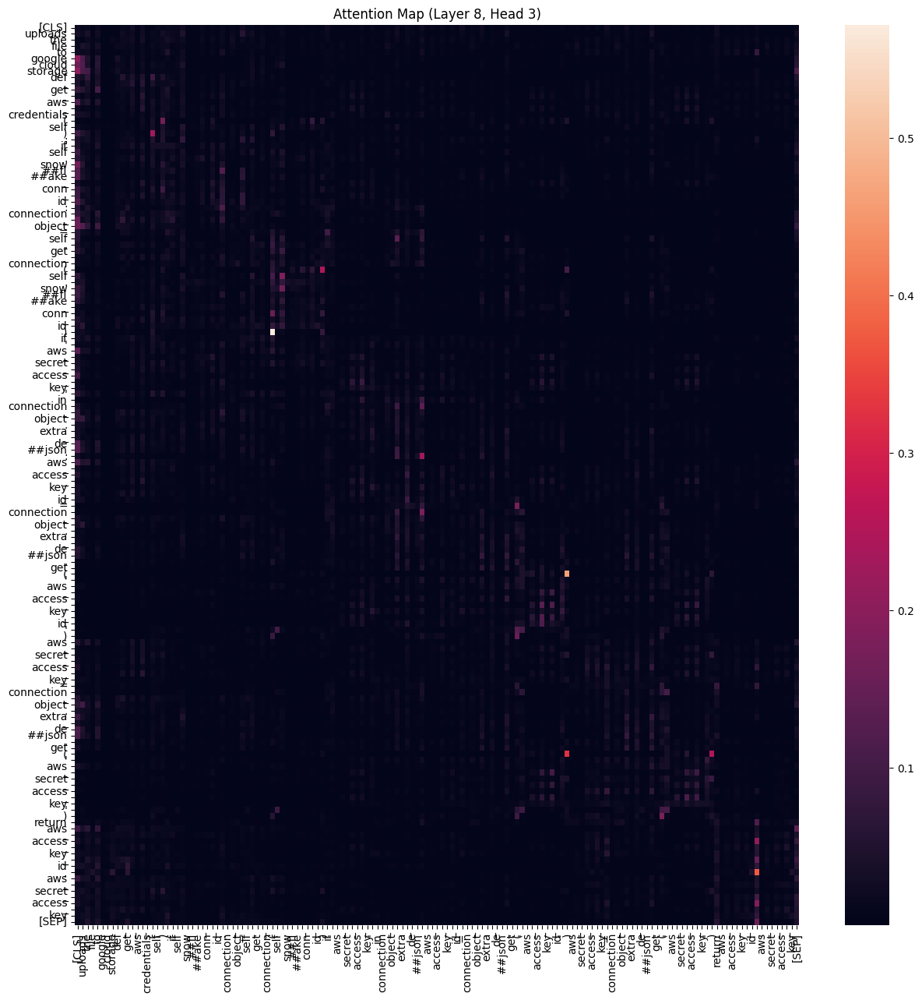

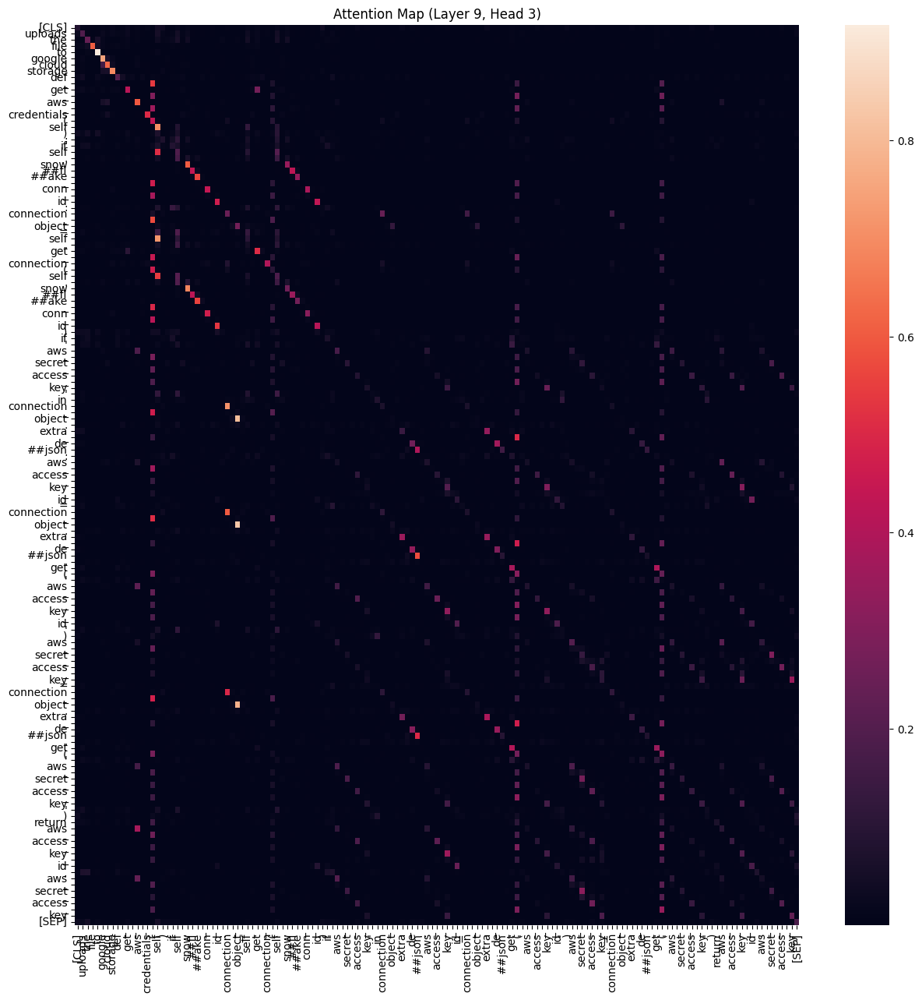

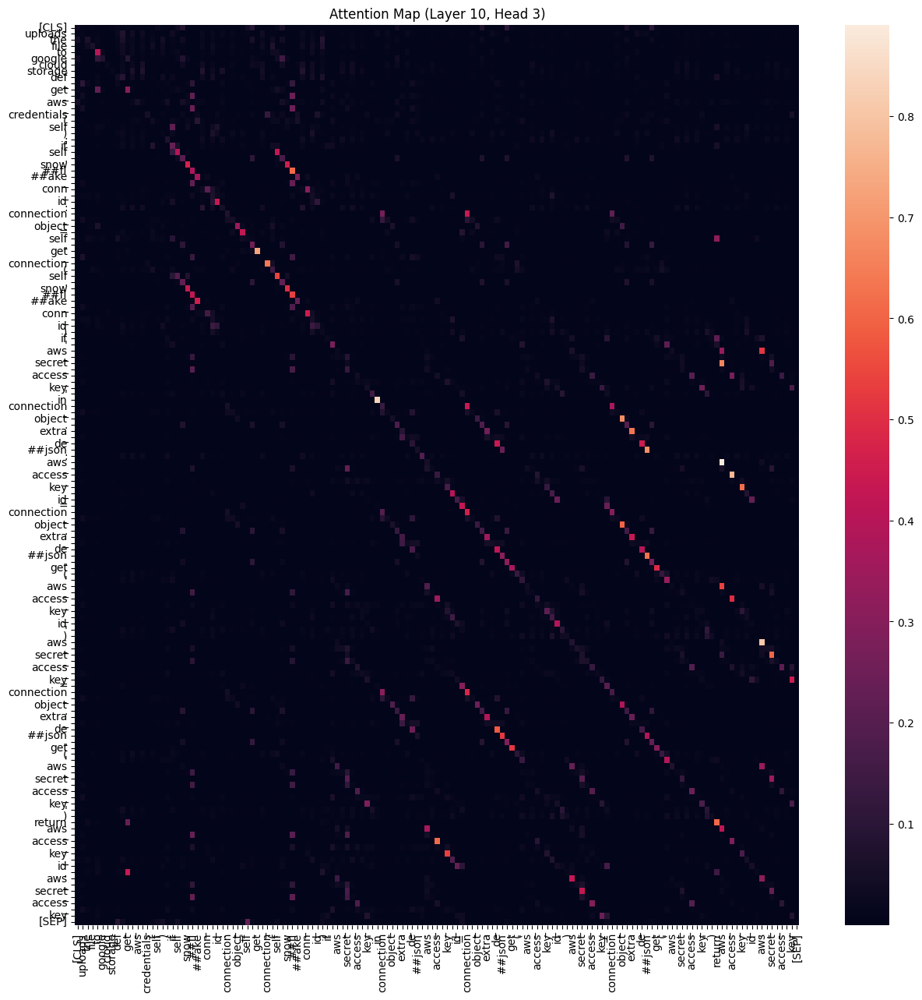

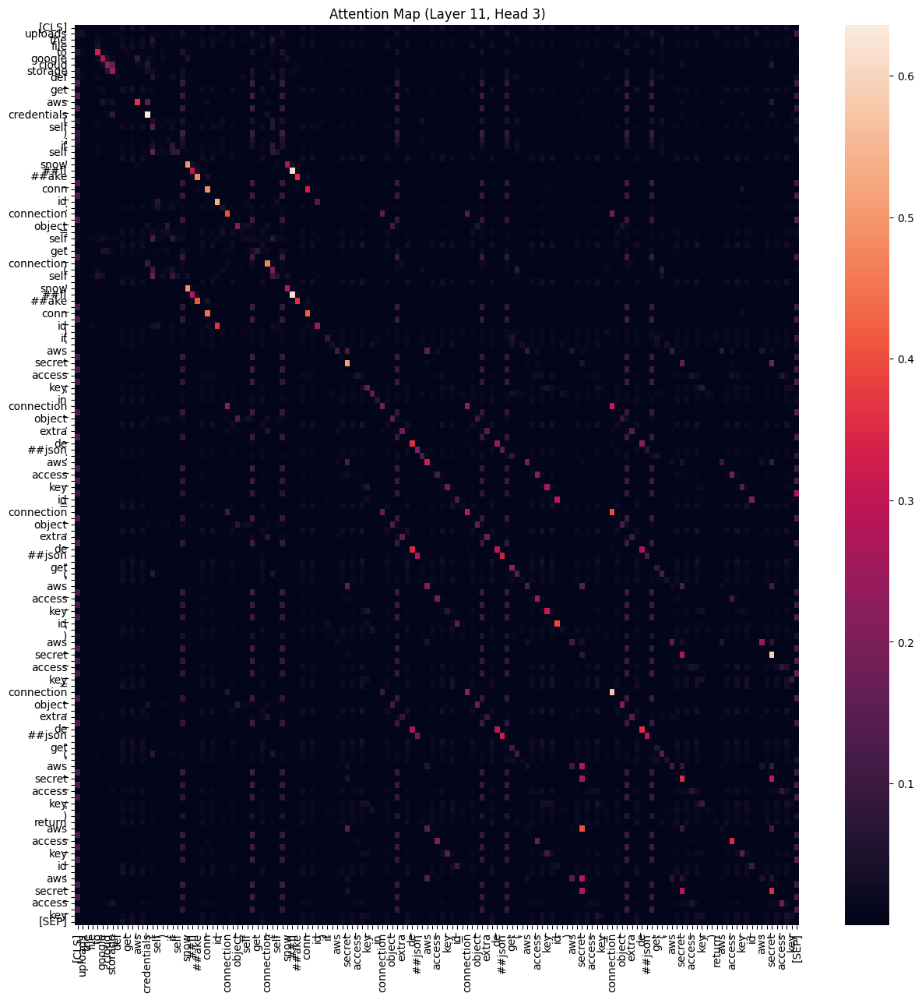

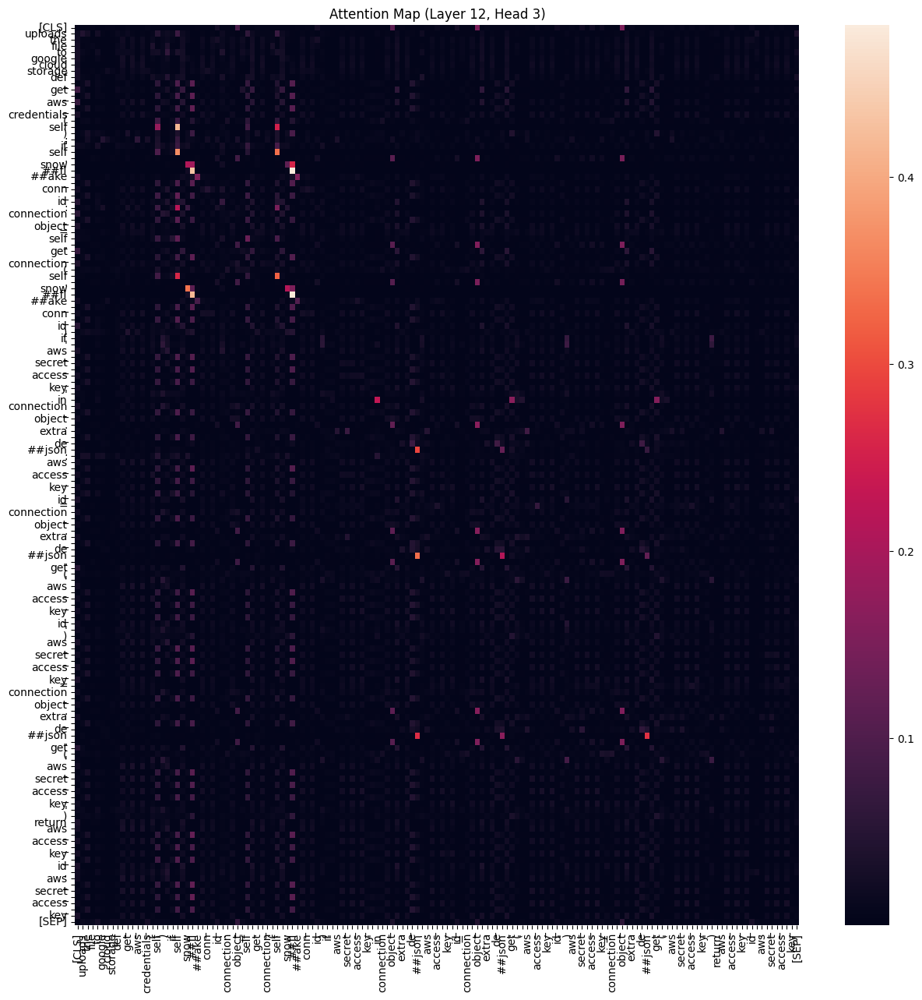


microsoft/codebert-base-mlm のAttention可視化 (1から12層の3番目のヘッド):


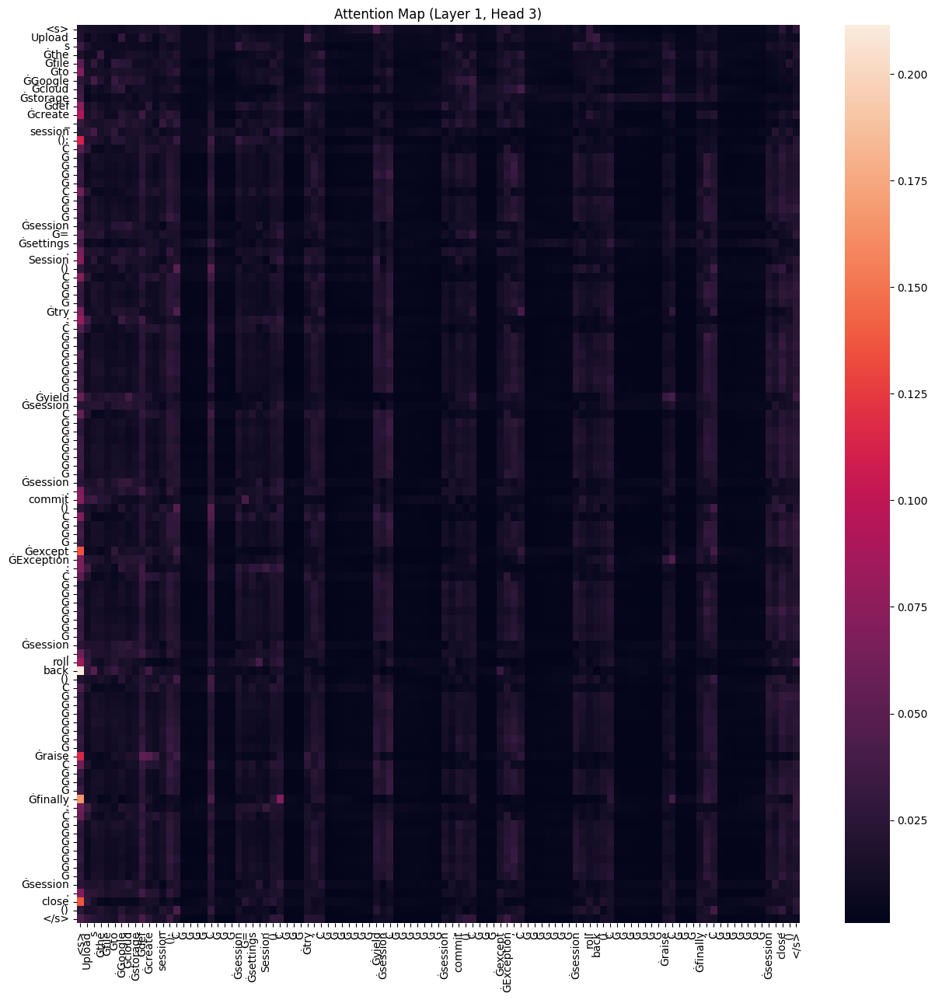

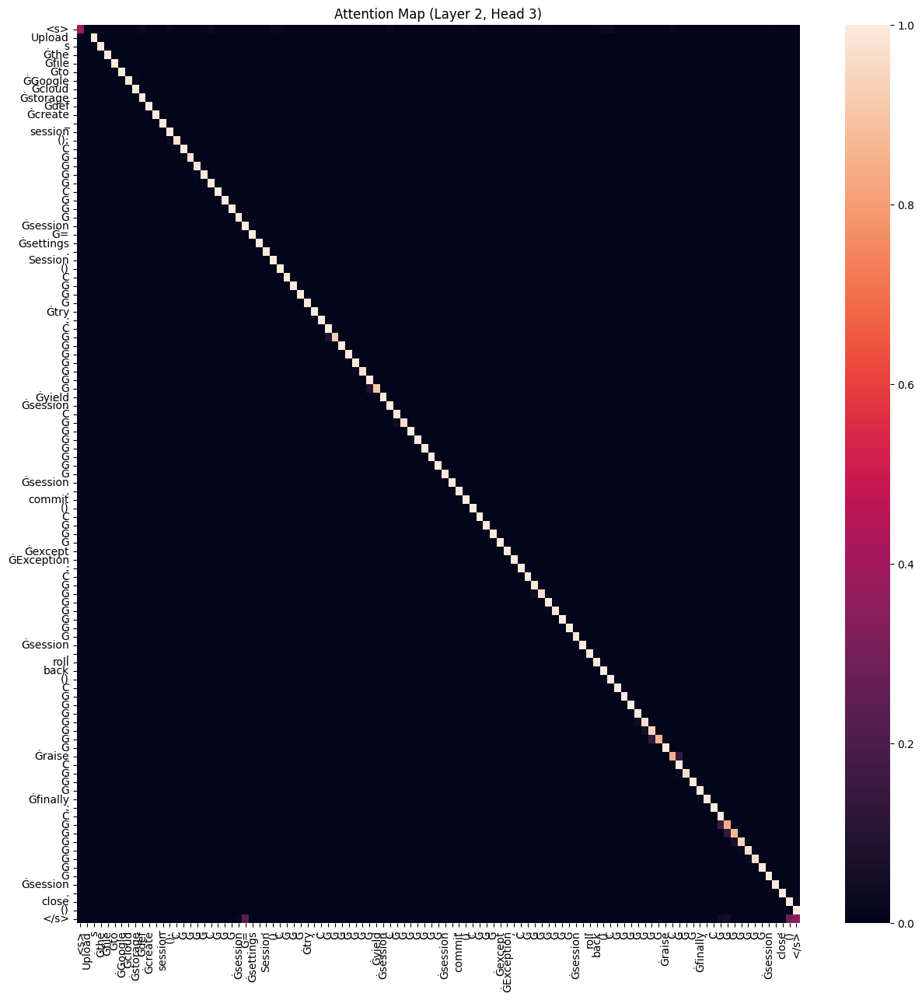

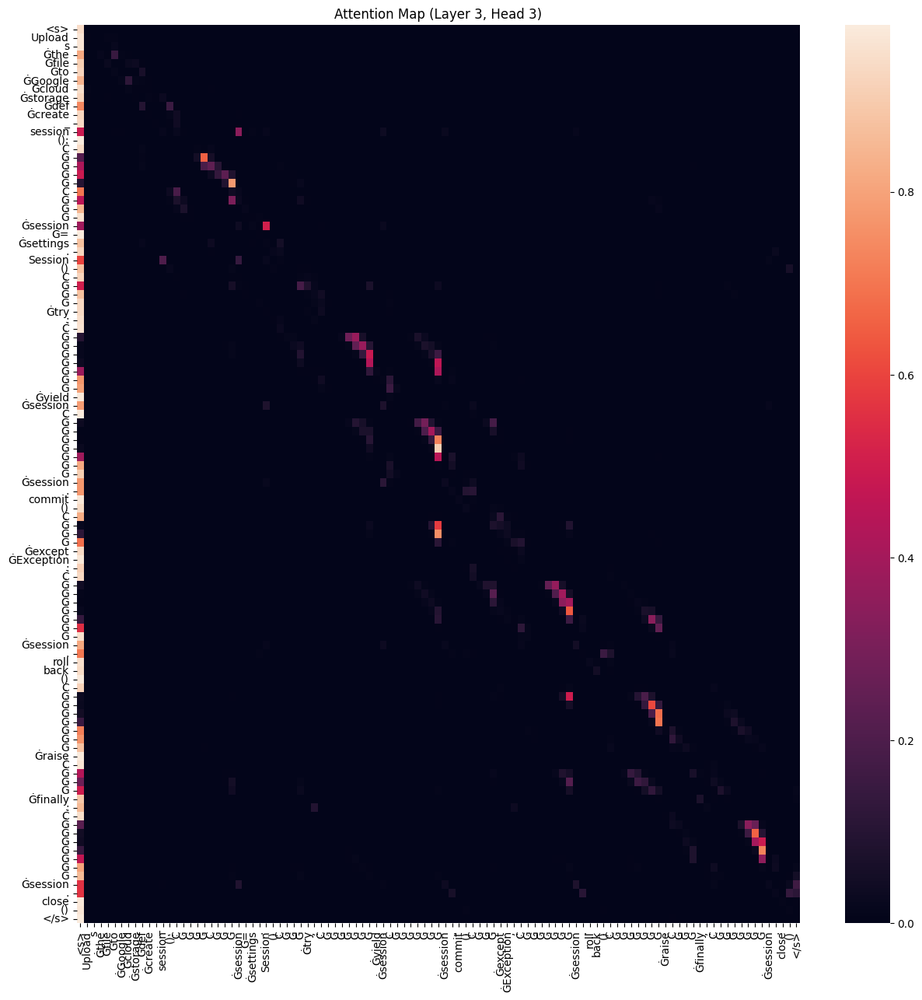

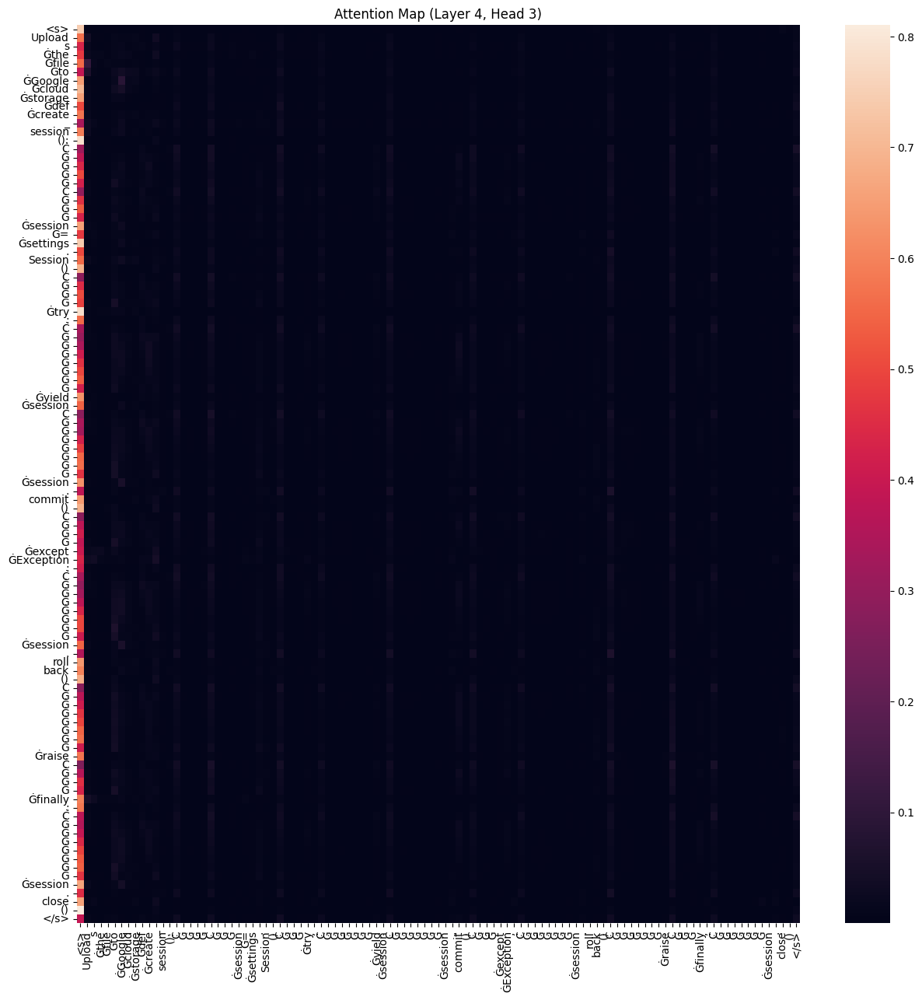

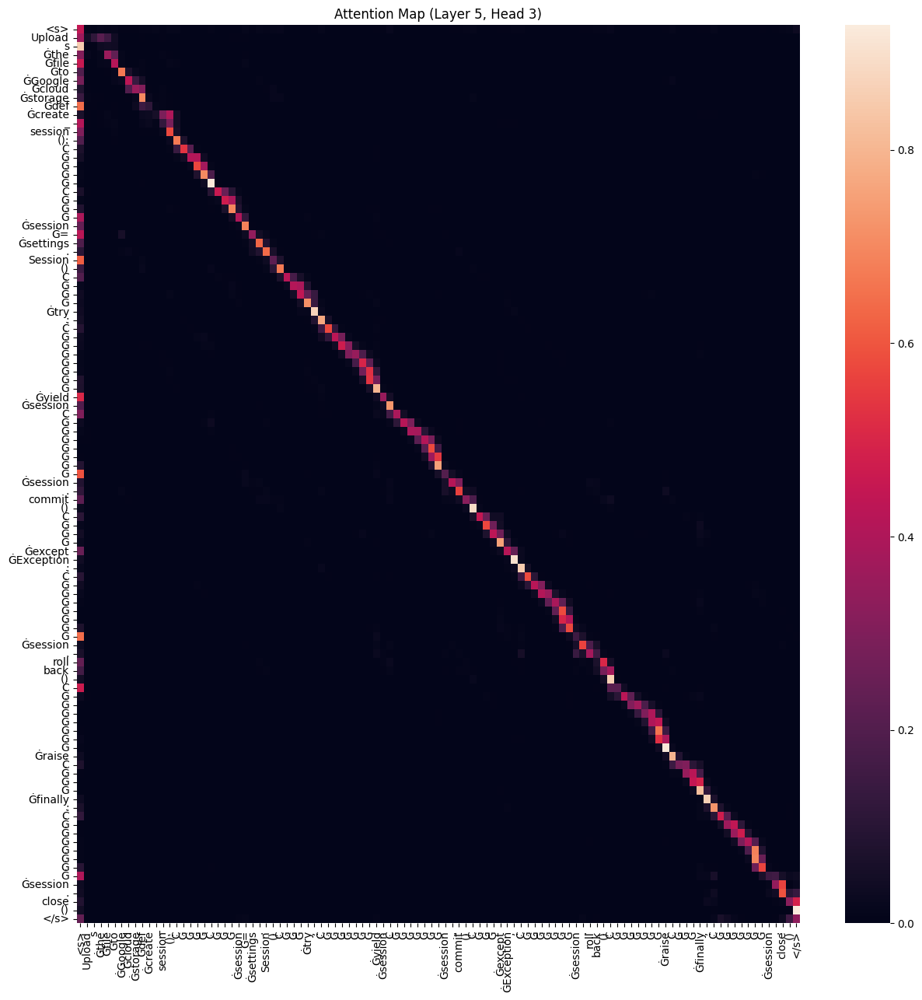

...

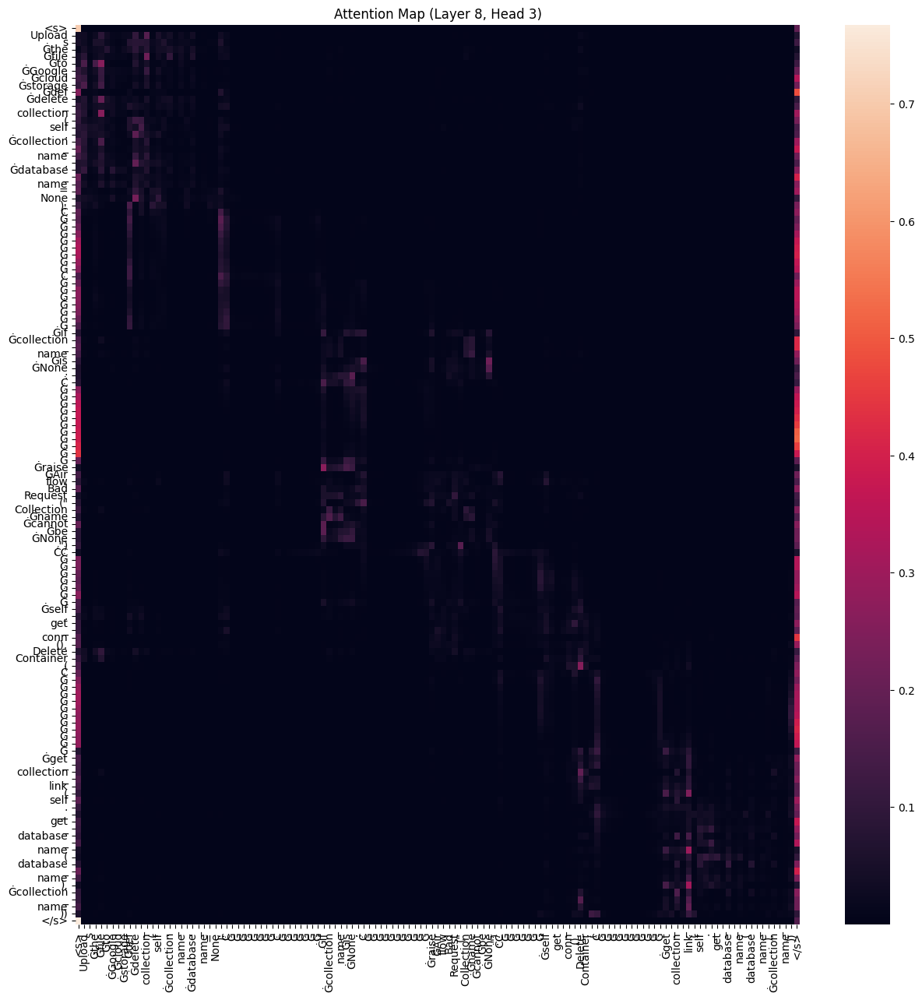

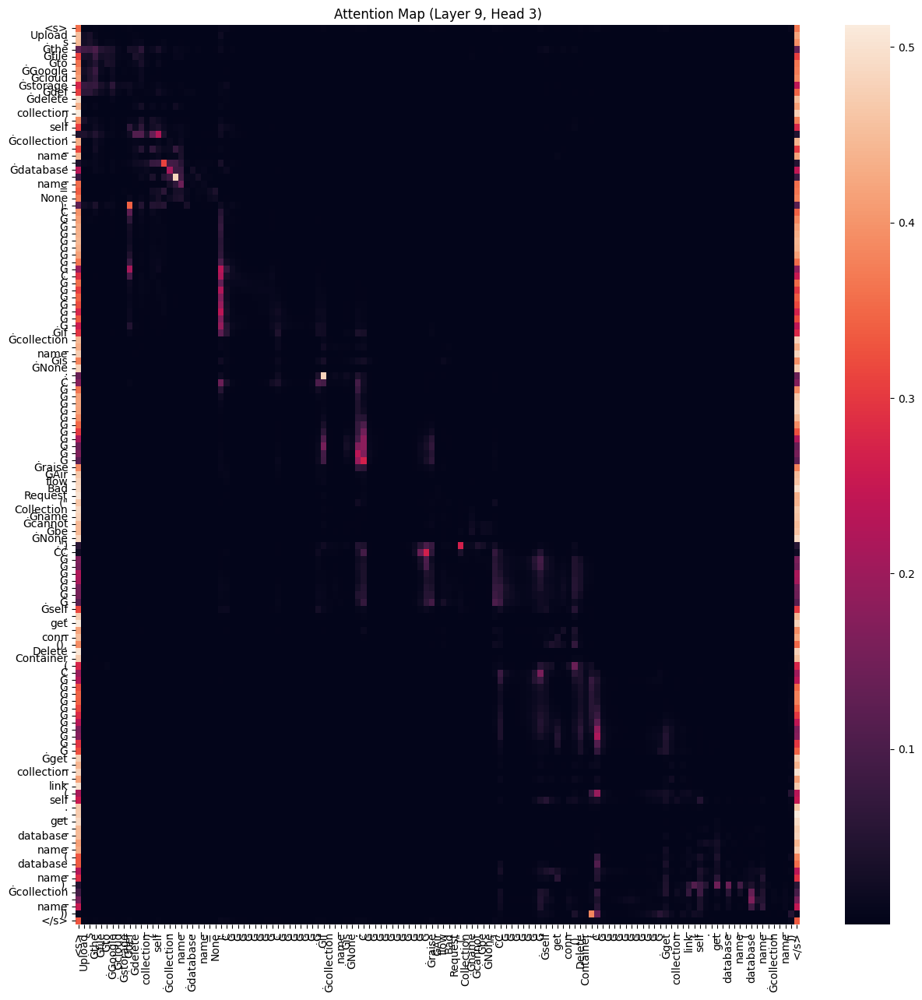

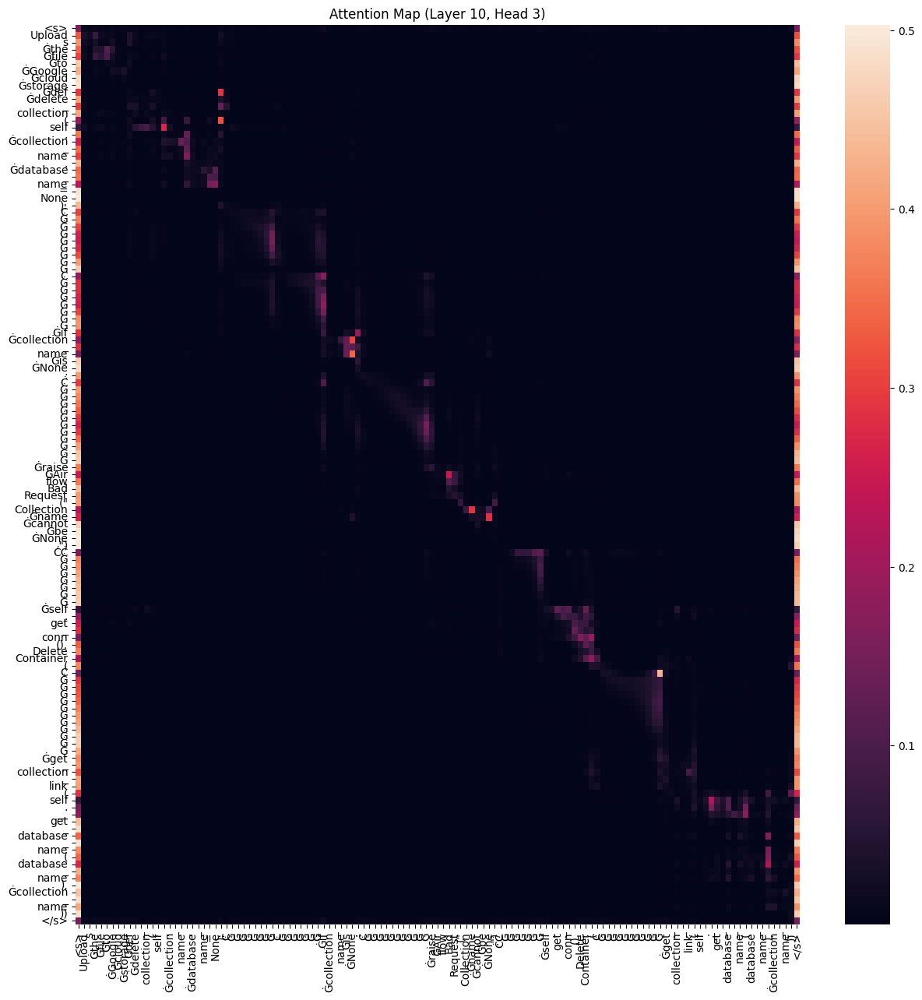

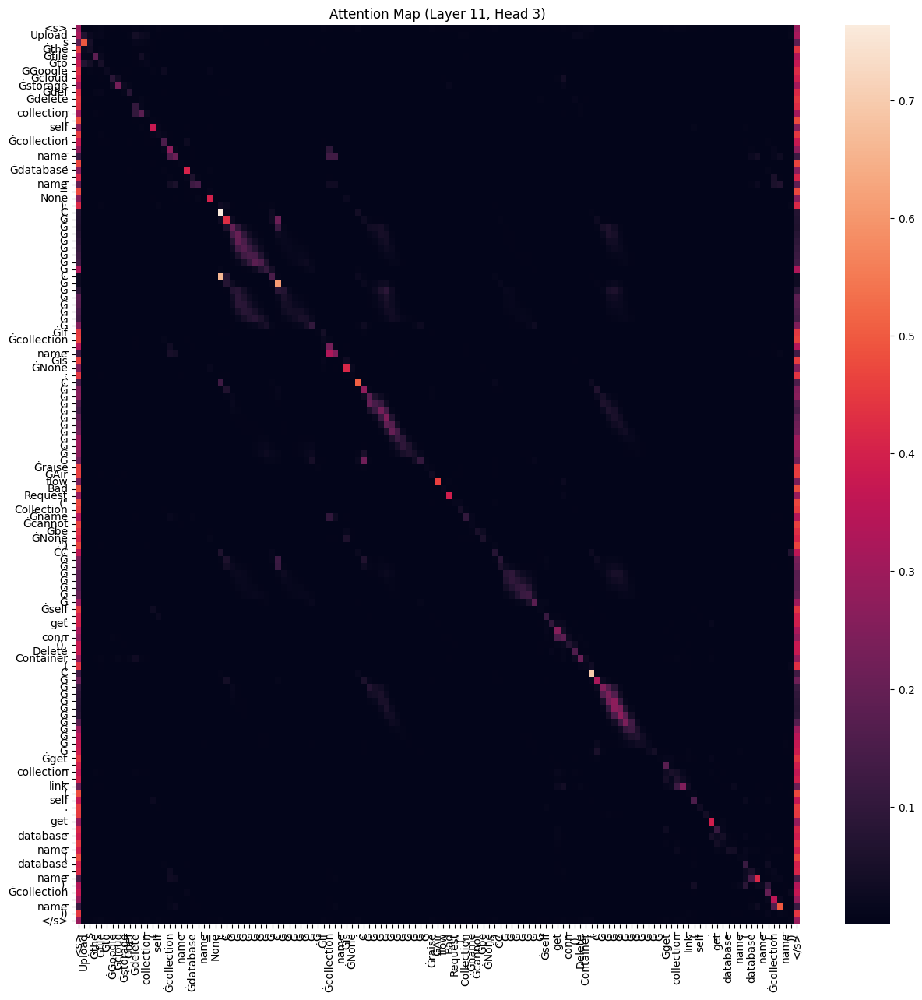

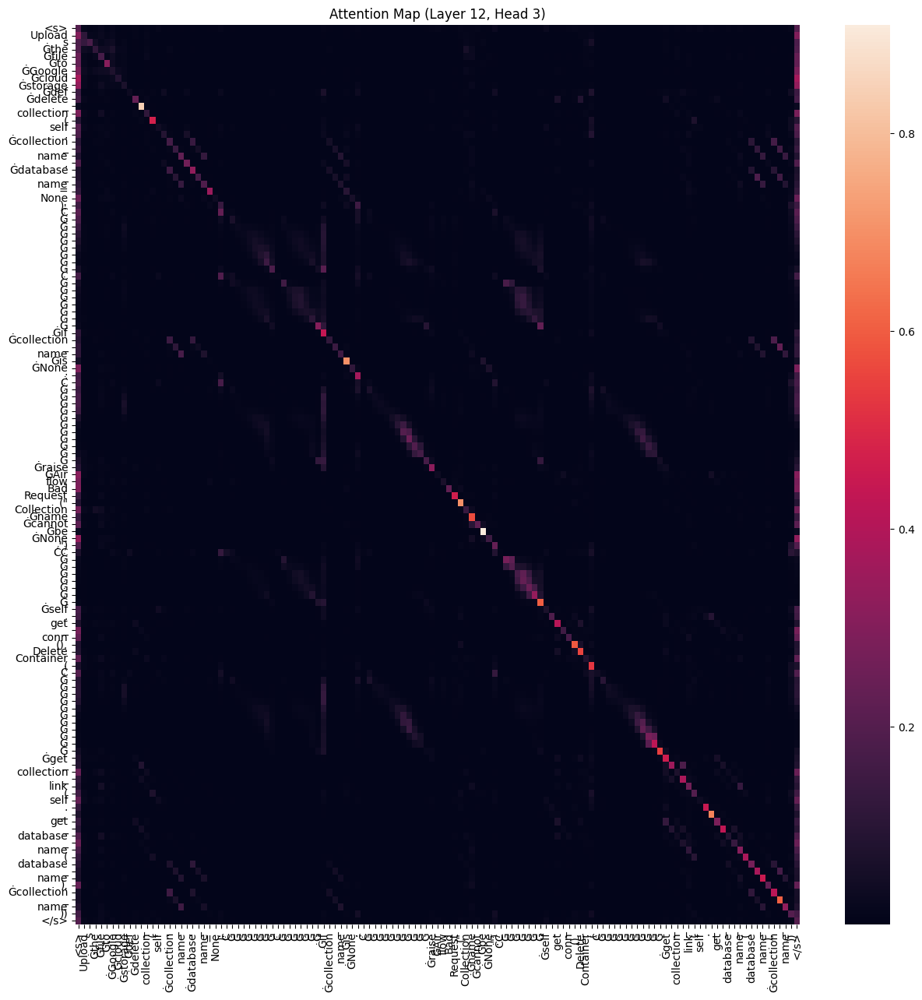

In [ ]:
import torch
# ... (その他必要なimport文)

def visualize_all_layers_head3(model, tokenizer, query, code, device):
    """
    1から12層の3番目のヘッドのAttentionを可視化する関数
    """
    combined_text = query + " " + code
    inputs = tokenizer(combined_text, return_tensors="pt", truncation=True, padding=True).to(device)

    with torch.no_grad():
        outputs = model(**inputs, output_attentions=True)

    for layer in range(1, 13):  # 1から12層をループ
        attentions = outputs.attentions[layer - 1][0, 2].cpu().numpy()  # レイヤーは0始まり、ヘッドは2 (3番目)
        combined_tokens = tokenizer.convert_ids_to_tokens(inputs["input_ids"][0])

        fig, ax = plt.subplots(figsize=(15, 15))
        sns.heatmap(attentions, xticklabels=combined_tokens, yticklabels=combined_tokens, ax=ax)
        plt.title(f"Attention Map (Layer {layer}, Head 3)")
        plt.show()

if __name__ == "__main__":
    # ... (モデル、tokenizerのロード、データセットの準備)

    # モデル1の可視化 (1から12層の3番目のヘッド)
    print(f"\n{model_name1} のAttention可視化 (1から12層の3番目のヘッド):")
    visualize_all_layers_head3(model1, tokenizer1, query_text, correct_code_text1, device)
    visualize_all_layers_head3(model1, tokenizer1, query_text, incorrect_code_text1, device)

    # モデル2の可視化 (1から12層の3番目のヘッド)
    print(f"\n{model_name2} のAttention可視化 (1から12層の3番目のヘッド):")
    visualize_all_layers_head3(model2, tokenizer2, query_text, correct_code_text2, device)
    visualize_all_layers_head3(model2, tokenizer2, query_text, incorrect_code_text2, device)

In [ ]:

from matplotlib.backends.backend_pdf import PdfPages
def visualize_all_heads(model, tokenizer, query, code, device, layer=11, pdf_filename=None):
    """
    指定した層のすべてのヘッドのAttentionを可視化する関数
    PDFファイル名が指定されていれば、そのPDFに出力する
    """
    combined_text = query + " " + code
    inputs = tokenizer(combined_text, return_tensors="pt", truncation=True, padding=True).to(device)

    with torch.no_grad():
        outputs = model(**inputs, output_attentions=True)

    num_heads = outputs.attentions[layer].shape[1]  # ヘッド数を取得

    # PdfPagesを使うかどうかを分岐
    if pdf_filename is not None:
        pdf = PdfPages(pdf_filename)
    else:
        pdf = None

    for head in range(num_heads):
        attentions = outputs.attentions[layer][0, head].cpu().numpy()
        combined_tokens = tokenizer.convert_ids_to_tokens(inputs["input_ids"][0])

        fig, ax = plt.subplots(figsize=(12, 12))
        sns.heatmap(attentions, xticklabels=combined_tokens, yticklabels=combined_tokens, ax=ax, cmap="viridis")
        plt.title(f"Attention Map (Layer {layer}, Head {head})")
        plt.tight_layout()

        if pdf is not None:
            pdf.savefig(fig)
            plt.close(fig)  # メモリ節約のために閉じる
        else:
            plt.show()

    if pdf is not None:
        pdf.close()
        print(f"PDF出力が完了しました: {pdf_filename}")


if __name__ == "__main__":
    # ... (モデル、tokenizerのロード、データセットの準備)


    # モデル1の可視化 (8層のすべてのヘッド)
    # モデル1の正解Attention可視化 (12層のすべてのヘッド) をPDFに出力
    print(f"\n{model_name1} の正解Attention可視化 (12層のすべてのヘッド):")
    visualize_all_heads(model1, tokenizer1, query_text, correct_code_text1, device, layer=11, pdf_filename="model1_correct_attention.pdf")

    # モデル1の不正解Attention可視化 (12層のすべてのヘッド) をPDFに出力
    print(f"\n{model_name1} の不正解Attention可視化 (12層のすべてのヘッド):")
    visualize_all_heads(model1, tokenizer1, query_text, incorrect_code_text1, device, layer=11, pdf_filename="model1_incorrect_attention.pdf")

    # モデル2も同様に
    print(f"\n{model_name2} の正解Attention可視化 (12層のすべてのヘッド):")
    visualize_all_heads(model2, tokenizer2, query_text, correct_code_text2, device, layer=11, pdf_filename="model2_correct_attention.pdf")

    print(f"\n{model_name2} の不正解Attention可視化 (12層のすべてのヘッド):")
    visualize_all_heads(model2, tokenizer2, query_text, incorrect_code_text2, device, layer=11, pdf_filename="model2_incorrect_attention.pdf")



Shuu12121/CodeMorph-BERT の正解Attention可視化 (12層のすべてのヘッド):
PDF出力が完了しました: model1_correct_attention.pdf

Shuu12121/CodeMorph-BERT の不正解Attention可視化 (12層のすべてのヘッド):
PDF出力が完了しました: model1_incorrect_attention.pdf

microsoft/codebert-base-mlm の正解Attention可視化 (12層のすべてのヘッド):
PDF出力が完了しました: model2_correct_attention.pdf

microsoft/codebert-base-mlm の不正解Attention可視化 (12層のすべてのヘッド):
PDF出力が完了しました: model2_incorrect_attention.pdf
